In [2]:
import os
import glob
import numpy as np
import json
import math
import matplotlib.pyplot as plt
from scipy.optimize import minimize, differential_evolution
from scipy.stats import norm
import george
from george import kernels

In [3]:
# Import the .json file
print(os.getcwd())
os.chdir('/home/ricky/selected_all_type_photometry')
filename = glob.glob('*.json')
np.random.seed(1)
np.random.shuffle(filename)
print(len(filename))
print(filename)

# Create a list for all .json, the 1st SN saved as json_data[0], the 2nd SN saved as json_data[1], etc.
json_data = []
for i in filename:
    with open(i, encoding="utf-8") as f:
        json_data.append(json.load(f))

/home/ricky/RNNAE
331
['SN1999ee.json', 'SN2011ht.json', 'SN2007bc.json', 'SN2007I.json', 'SN2013dh.json', 'SN2006qq.json', 'SN2002he.json', 'SN2007fb.json', 'SN2002es.json', 'SN2007cq.json', 'SN2008bo.json', 'ASASSN-15fa.json', 'SN1999cr.json', 'SN2006jc.json', 'SN2007pk.json', 'SN2006bo.json', 'SN2007C.json', 'SN2006mq.json', 'iPTF13bvn.json', 'SN2005A.json', 'SN2011bm.json', 'SN2005ag.json', 'SN2004dt.json', 'SN2003hv.json', 'SN2004ey.json', 'OGLE-2012-SN-006.json', 'SN2016bkv.json', 'LSQ11ot.json', 'SN2014dt.json', 'SN2009kq.json', 'SN2006ac.json', 'SN2011ef.json', 'SN2010al.json', 'SN2004aw.json', 'SN2017ein.json', 'SN2005bf.json', 'SN2004gk.json', 'SN2007nq.json', 'SN2002er.json', 'SN2007co.json', 'SN2003fa.json', 'SN2019ein.json', 'SN2008ax.json', 'SN2006is.json', 'SN2014cy.json', 'SN2011dh.json', 'LSQ13dpa.json', 'SN1981B.json', 'SN2002gd.json', 'SN2018gv.json', 'SN2002ha.json', 'SN1979C.json', 'SN1999gi.json', 'SN2011aa.json', 'SN2017erp.json', 'SN2008ip.json', 'SN2018aoz.json

In [4]:
''' Avoid any .json that didn't contain more than 10 data points at the specified band

Input
    filename: list of string
        1D list
        the name of the .json file

    Filter: list of string
        1D list
        Name of each band of a particular filter system in use
    
Return
    filename_id: list of number
        1D list
        id of non-empty SN in the list of filename
'''

def avoid_emptySN(filename, Filter):
    
    Band = []
    filename_id = []
    #filename1 = filename
    #print(filename)
    for i in range(len(filename)):
        #print(i)
        Band.append([])
        
        SN_name = filename[i].replace('.json', '')
        SN_name = SN_name.replace('_', ':')
        
        try:
            N = len(json_data[i][SN_name]['photometry']) # The no. of data point of photometry in each SN
            LumDist = float(json_data[i][SN_name]['lumdist'][0]['value'])
        except:
            N = 1
        #print(SN_name)
        for j in range(N): # Loop through all photemetry datapoint in one SN
            # Avoid any data point without band data
            try:
                Band[i].append(json_data[i][SN_name]['photometry'][j]['band'])
            except:
                Band[i].append(0)
                
        a = 0
        for j in range(N):
            for k in range(len(Filter)):
                if Band[i][j] == Filter[k]:
                    a += 1
        
        if a > 10: # Any SN with more than 10 data points will be used
            filename_id.append(i)
            
    return filename_id

In [5]:
Filter_all = ['U', 'B', 'V', 'R', 'I', "u'", "g'", "r'", "i'", 'u', 'g', 'r', 'i'] # Filter to be used for your plotting later
filename_all = avoid_emptySN(filename, Filter_all)

In [6]:
'''Extract data from .json

Input
    Filter: list of string
        1D list
        Name of each band of a particular filter system in use
    
Return
    Time: list 
        shape=(len(Filter), len(filename_id), number of data)
        Time of datapoints of SN
        
    Magnitude_Abs: list
        shape=(len(Filter), len(filename_id), number of data)
        Absolute magnitude of datapoints of SN,
        calculated from the relative magnitude, redshift, and luminosity distance
        
    Magnitude_Abs_err: list
        shape=(len(Filter), len(filename_id), number of data)
        Error of absolute magnitude of datapoints of SN,
        calculated from relative magnitude error and luminosity distance error
        
    Type: list
        1D list
        Store the claimed type of the SN
'''

def lc_extractor(filename, filename_id, Filter):
    
    Band = [] # Contain EM band chosen for analysis
    Type = [] # Claimed type from the .json
    
    Time = [] # Contain time (MJD) for each band
    Magnitude_Abs = [] # Contain absolute magnitude for each band
    Magnitude_Abs_err = [] # Contain error of absolute magnitude for each band
    
    for j in range(len(Filter)): # Create a dimension to store the data at each band separately
        Time.append([]) 
        Magnitude_Abs.append([])
        Magnitude_Abs_err.append([])

    
    
    for i in range(len(filename_id)): # Loop through all SN

        Band.append([]) # Create 2D list

        SN_name = filename[filename_id[i]].replace('.json', '')
        SN_name = SN_name.replace('_', ':')
        
        LumDist = float(json_data[filename_id[i]][SN_name]['lumdist'][0]['value']) # Obtain the luminosity distance
        
        try:
            LumDist_err = float(json_data[filename_id[i]][SN_name]['lumdist'][0]['e_value'])
        except:
            LumDist_err = 0

        z = float(json_data[filename_id[i]][SN_name]['redshift'][0]['value']) # Obtain the redshift, z

        N = len(json_data[filename_id[i]][SN_name]['photometry']) # The no. of data point of photometry in each SN

        Type.append(json_data[filename_id[i]][SN_name]['claimedtype'][0]['value']) 

        for j in range(len(Filter)):

            Time[j].append([])
            Magnitude_Abs[j].append([])
            Magnitude_Abs_err[j].append([])

        for j in range(N): # Loop through all photemetry datapoint in one SN
            # Avoid any data point without band data
            try:
                Band[i].append(json_data[filename_id[i]][SN_name]['photometry'][j]['band'])
            except:
                Band[i].append(0)

            for k in range(len(Filter)):
                # Create light curves for every sources   
                if Band[i][j] == Filter[k]:

                    Magnitude_App = float(json_data[filename_id[i]][SN_name]['photometry'][j]['magnitude']) # Obtain the apparent magnitude from photometry       

                    Time[k][i].append(float(json_data[filename_id[i]][SN_name]['photometry'][j]['time'])) # Fill the Time list
                    Magnitude_Abs[k][i].append(Magnitude_App - 5*np.log10(LumDist*1e5) + 2.5*np.log10(1+z)) # Calculate the absolute magnitude and fill the Magnitude_Abs list

                    try:
                        Magnitude_App_err = float(json_data[filename_id[i]][SN_name]['photometry'][j]['e_magnitude'])
                        Magnitude_Abs_err[k][i].append(np.sqrt(Magnitude_App_err**2 + (5*0.434*LumDist_err/LumDist)**2))
                    except:
                        Magnitude_Abs_err[k][i].append(0.3)
            
            
    return Time, Magnitude_Abs, Magnitude_Abs_err, Type

In [7]:
Time_all, Magnitude_Abs_all, Magnitude_Abs_err_all, Type_all = lc_extractor(filename, filename_all, Filter_all)

print(np.array(filename_all).shape)
print(filename[filename_all[23]])

(330,)
SN2003hv.json


In [8]:
# Convert the data lists into shape=(len(filename_id), len(Filter), data points)
def transpose(Time, Magnitude_Abs, Magnitude_Abs_err):
    return np.array(Time, dtype="object").T, np.array(Magnitude_Abs, dtype="object").T, np.array(Magnitude_Abs_err, dtype="object").T

In [9]:
t_all, m_all, m_err_all = transpose(Time_all, Magnitude_Abs_all, Magnitude_Abs_err_all)

In [10]:
'''Zeroing the time list by the peak magnitude such that the peak has day = 0
Also truncate the data lists to only include -50 days to 135 days post peak'''
def peak_zeroing(t, m, m_err, Filter, lightcurve_length_before, lightcurve_length_after):
    
    for i in range(len(t)):
        # Find the maximum time in shortest wavelength band
        maximum = 0
        maximum1 = []
        a = None

        if len(m[i][1]) != 0: # choosing B band for maximum calculation as default
            a = 1 
        else:
            for j in range(len(Filter)): # choose other bands if B band is empty
                if len(m[i][j]) != 0:
                    a = j
                    break

        maximum = np.argmin(m[i][a]) # save the id of maximum magnitude, in B band or otherwise
        t_max = t[i][a][maximum] # save the time of maximum magnitude

        for j in range(len(Filter)):

            t[i][j] = np.array(t[i][j]) - t_max # shift the days of time list such that the peak is 0 days

            t[i][j] = np.delete(t[i][j], np.where(t[i][j] > lightcurve_length_after)) # truncate away any time data after 135 days
            m[i][j] = m[i][j][0:len(t[i][j])] # truncate away any magnitude after 135 days
            m_err[i][j] = m_err[i][j][0:len(t[i][j])] # truncate away any magnitude error after 135 days

            t[i][j] = np.delete(t[i][j], np.where(t[i][j] < lightcurve_length_before)) # truncate away any time data before -50 days
            m[i][j] = m[i][j][len(m[i][j]) - len(t[i][j]):] # truncate away any magnitude data before -50 days
            m_err[i][j] = m_err[i][j][len(m_err[i][j]) - len(t[i][j]):] # truncate away any magnitude error data before -50 days

            if (len(t[i][j]) - len(m_err[i][j])) !=0:
                print('bruh') # print bruh if the length of the lists doesn't match

    return t, m, m_err

In [11]:
lightcurve_length_before = -50
lightcurve_length_after = 135

t_all, m_all, m_err_all = peak_zeroing(t_all, m_all, m_err_all, Filter_all, lightcurve_length_before, lightcurve_length_after)

In [12]:
del json_data

In [13]:
def GP_normalization(y, y_err):
    return (y - np.mean(y)) / (np.max(y) - np.min(y)), y_err / (np.max(y) - np.min(y)), np.mean(y), np.max(y) - np.min(y)

In [14]:
def GP_interpolate(t, m, m_err, Type, Filter, Filter_wavelength, filename1, color):
    
    data = [] # Save the data generated by the GP interpolation
    padding_point = [] # Save the padding point of each SN to be used to create the mask later
    
    data_mean = [] # Save the mean of the magnitude before normalization for unnormalization purpose later
    data_range = [] # Save the range of the magnitude before normalization for unnormalization purpose later
    
    type_GP = []
    
    mask = []
    
    m1 = []
    m1_err = []
    
    succ_id = []
    
    selected = [128]
    
    #for i in selected:
    for i in range(len(t)):
        
        Filter_num = [] # List containing Filter_wavelength for GP fitting, with number of element matching the number of element in x (time)
        x = [] # List of t containing all bands
        y = [] # List of m containing all bands
        y_err = [] # List of m_err containing all bands
        residual = [] # List of GP prediction - actual observation
        a = 'empty' # Store the band number of the longest band timewise
        b = 0 # Store the time duration of the longest band timewise

                
        
        m1.append([])
        m1_err.append([])
        for j in range(len(Filter)):
            m1[-1].append([])
            m1_err[-1].append([])
        
        for j in range(len(Filter)):
            # Finding which band has the longest light curve
            if len(t[i][j]) != 0:
                if (t[i][j][-1] - t[i][j][0]) > b:
                    b = t[i][j][-1] - t[i][j][0]
                    a = j

            # Saving the t and m and m_err for all bands for GP fitting
            for k in range(len(t[i][j])):
                x.append(t[i][j][k])
                y.append(m[i][j][k])
                y_err.append(m_err[i][j][k])
                Filter_num.append(Filter_wavelength[j])

        x1 = np.vstack([x, Filter_num]).T # 2D list with both the time and Filter_wavelength used for initial GP fitting


        
        Filter_pred = [] # List containing Filter_wavelength for GP fitting, with number of element matching the number of element in x (time) 
        x_pred = [] # List of t containing all bands
        for j in range(len(Filter)):
            x_pred_temp = np.linspace(t[i][a][0], t[i][a][-1], 500)
            for k in range(500):
                x_pred.append(x_pred_temp[k])
                Filter_pred.append(Filter_wavelength[j])

        x_pred1 = np.vstack([x_pred, Filter_pred]).T # 2D list with both the artificial time list and Filter_wavelength used for GP generation
        
        
        
        # Normalization
        #print(y_err)
        y, y_err, y_mean, y_range = GP_normalization(y, y_err) # Normalizing the magnitude and magnitude error such that the GP mean is 0
        #print(y_err)
        for j in range(len(Filter)):
            m1[-1][j] = (m[i][j] - y_mean) / y_range
            m1_err[-1][j] = m_err[i][j] / y_range
        
        
        print(filename[filename_all[i]])
        #kernel = np.var(y)*kernels.ExpKernel(metric=[100,10], ndim=2) + kernels.ConstantKernel(log_constant=0, ndim=2) # Exp Kernel and Constant Kernel
        kernel = np.var(y)*kernels.ExpKernel(metric=[100,10], ndim=2)
        gp = george.GP(kernel, white_noise=np.log(np.var(y)), fit_white_noise=True)
        
        gp.compute(x1, y_err) # Initial GP fitting

        def neg_ln_like(p):
            gp.set_parameter_vector(p)
            return -gp.log_likelihood(np.array(y))

        def grad_neg_ln_like(p):
            gp.set_parameter_vector(p)
            return -gp.grad_log_likelihood(np.array(y))

        try:
            result = minimize(neg_ln_like, gp.get_parameter_vector(), jac=grad_neg_ln_like, method='L-BFGS-B') # Fitting for finding the optimum parameters of the kernel
            print(i, result)
            print(i, 'converged successfully')
            gp.recompute()
            pred, pred_var = gp.predict(y, x_pred1, return_var=True) # GP generation with artifical time
            
            type_GP.append(Type[i])
            
            data_mean.append(y_mean)
            data_range.append(y_range)
            
            # Creating the original masking
            mask.append([])
            for j in range(len(Filter)):
                if len(m[i][j]) > 10:
                    mask[-1].append(1) # The particular band is only considered as useful when there's more than 10 data points at that band
                else:
                    mask[-1].append(0)
                    
            succ_id.append(i)
        except:
            print(i, 'failed to converge')
            continue


        '''# Plot out the result of the GP generation with artificial time
        fig, axs = plt.subplots(1, 2, figsize=(35, 9))
        #plt.gca().invert_yaxis()
        for j in range(len(Filter)):
            if mask[-1][j] == 1:
                for k in range(2):
                    axs[k].plot(x_pred[j*500:(j+1)*500], pred[j*500:(j+1)*500], color=color[j], lw=1.5, alpha=0.8, label=Filter[j])
                    axs[k].fill_between(x_pred[j*500:(j+1)*500], pred[j*500:(j+1)*500] - np.sqrt(pred_var[j*500:(j+1)*500]), pred[j*500:(j+1)*500] + np.sqrt(pred_var[j*500:(j+1)*500]),
                                    color=color[j], alpha=0.2)
                    axs[k].errorbar(t[i][j], m1[-1][j], yerr=m1_err[-1][j], fmt='.', color=color[j], capsize=0)
                    axs[0].set_xlim(t[i][a][0], t[i][a][-1])
                    axs[1].set_xlim(-50, 135)
                    axs[1].set_ylim(min(pred[j*500:(j+1)*500])-0.5, max(pred[j*500:(j+1)*500])+0.5)
        
        for k in range(2):
            axs[k].invert_yaxis()
            axs[k].grid()
            axs[k].legend()
            #axs[k].set_title(filename[filename1[i]], color='white')
            axs[k].set_title(filename[filename1[i]]+' '+type_GP[-1], color='white')
            
        plt.show()'''


        pred_residual, pred_var_residual = gp.predict(y, x1, return_var=True) # GP generation with actual observation
        #print('shape of pred_residual', pred_residual.shape)


        fig, axs = plt.subplots(1, len(Filter)+1, figsize=(35, 6))
        l = 0

        '''# Calculate the residual
        for j in range(len(Filter)+1):
            residual.append([])
            if j != len(Filter): # Residual calculation for each single band
                for k in range(len(m1[-1][j])):
                    residual[j].append(-1*(m1[-1][j][k] - pred_residual[l+k])) # Notice the sign is flipped for easier observation for our ape brain
                l += len(m1[-1][j]) # id calculation as pred_residual is just a 1D long list containing all bands
            else:
                for k in range(len(y)): # Residual calculation for all bands
                    residual[j].append(-1*(y[k] - pred_residual[k])) # Again the sign is flipped

            mu, sigma = norm.fit(residual[j]) # Fit a Gaussian distribution on the residual

            # Plotting the residual
            values,bins,_ = axs[j].hist(residual[j], bins=20, color=color[j], density=False, alpha=0.7)
            area = sum(np.diff(bins)*values)

            if len(residual[j]) == 0: # Skip empty bands
                continue

            gcxmin = np.min(residual[j])
            gcxmax = np.max(residual[j])
            gcx = np.linspace(gcxmin, gcxmax, 100)
            gc = area*norm.pdf(gcx, mu, sigma)

            axs[j].plot(gcx, gc, color=color[j], linestyle='--', linewidth=2)
            axs[j].axvline(x=0, color='k', label='0')
            axs[j].axvline(x=mu, color=color[j], linestyle='--', label='mean')
            axs[j].legend()
            axs[j].grid()
            axs[j].set_title('mean = '+'%.3f'%mu+'\n var = '+'%.3f'%sigma, color='white')

        plt.show()'''


        # Temporary variable per SN
        data_t = [] # Store the time for GP interpolation
        data_m = [] # Store the magnitude from GP interpolation
        data_m_err = [] # Store the error of magnitude from GP interpolation
        data_temp = [] # Store all temporary data per SN, this list will be saved to the actual data[] within every loop

        Filter_pred = []
        data_t_temp = np.linspace(t[i][a][0], t[i][a][-1], int(t[i][a][-1] - t[i][a][0])+2) # Time list for GP interpolation, data points with 1 day apart
        padding_point.append(len(data_t_temp)) # Padding was used after the length of the GP interpolation
        
        # Initialize time list for GP interpolation
        for j in range(len(Filter)):   
            for k in range(len(data_t_temp)):
                data_t.append(data_t_temp[k])
                Filter_pred.append(Filter_wavelength[j])

        data_t1 = np.vstack([data_t, Filter_pred]).T
        #print(data_t1.shape)
        data_m_temp, data_m_err_temp = gp.predict(y, data_t1, return_var=True)
        #print(len(data_m_temp))
        
        lightcurve_length = np.arange(lightcurve_length_before, lightcurve_length_after, 1) # The whole length of time list
        
        # LC padding
        for j in range(len(Filter)):
            data_m.append([])
            data_m_err.append([])
            for k in lightcurve_length:
                if k < t[i][a][0]:
                    pass
                elif k > t[i][a][-1]:
                    #print((j+1)*(len(data_t_temp))-1)
                    data_m[j].append(data_m_temp[(j+1)*(len(data_t_temp))-1])
                    data_m_err[j].append(np.sqrt(data_m_err_temp[(j+1)*(len(data_t_temp))-1]))
                    #data_m[j].append(0)
                    #data_m_err[j].append(0)
                else:
                    #print(j*(len(data_t_temp))+k-int(t[i][a][0]))
                    data_m[j].append(data_m_temp[j*(len(data_t_temp))+k-int(t[i][a][0])])
                    data_m_err[j].append(np.sqrt(data_m_err_temp[j*(len(data_t_temp))+k-int(t[i][a][0])]))
            for k in range(len(lightcurve_length)-len(data_m[j])): # This part was used if the length of data is less than 185
                data_m[j].append(data_m[j][-1])
                data_m_err[j].append(np.sqrt(data_m_err[j][-1]))

        lightcurve_length = lightcurve_length + (t[i][a][0] - lightcurve_length_before) # Time list

        #print('data_m[0]=',np.array(data_m[0]).shape)

        data_temp.append(lightcurve_length)
        for j in range(len(Filter)):
            data_temp.append(data_m[j])
        for j in range(len(Filter)):
            data_temp.append(data_m_err[j])
        data.append([data_temp[j] for j in range(len(data_temp))])
        
        '''# Plot out the data input
        plt.figure(figsize=(10, 6))
        plt.gca().invert_yaxis()
        plt.grid()
        for j in range(len(Filter)):
            if mask[-1][j] == 1:
                #plt.scatter(lightcurve_length, data_m[j], color=color[j], s=0.3)
                plt.errorbar(lightcurve_length, data_m[j], yerr=data_m_err[j], fmt='.', color=color[j], lw=0.8)
        plt.show()'''

    data = np.array(data, dtype=object)
    print('data shape=', data.shape)
    
    return data, data_mean, data_range, padding_point, type_GP, mask, succ_id

SN1999ee.json
0       fun: -2252.5415473283597
 hess_inv: <4x4 LbfgsInvHessProduct with dtype=float64>
      jac: array([ 1.54335933e-05, -5.89006548e-04, -1.82010577e-03,  1.60882561e-03])
  message: 'CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH'
     nfev: 41
      nit: 37
     njev: 41
   status: 0
  success: True
        x: array([-23.91371133,  -2.40866369,  13.61477947,   8.41997582])
0 converged successfully
SN2011ht.json
1       fun: -199.23215362104872
 hess_inv: <4x4 LbfgsInvHessProduct with dtype=float64>
      jac: array([ 1.69549773e-06, -6.73871512e-03,  4.81018235e-03, -1.52239294e-03])
  message: 'CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH'
     nfev: 37
      nit: 34
     njev: 37
   status: 0
  success: True
        x: array([-23.17079191,  -2.58688377,  12.3748174 ,   7.82767296])
1 converged successfully
SN2007bc.json
2       fun: -262.25247811632346
 hess_inv: <4x4 LbfgsInvHessProduct with dtype=float64>
      jac: array([ 1.01670401e-06, -1.10058813e-03, -

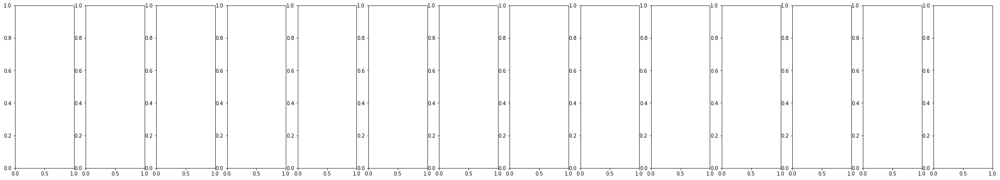

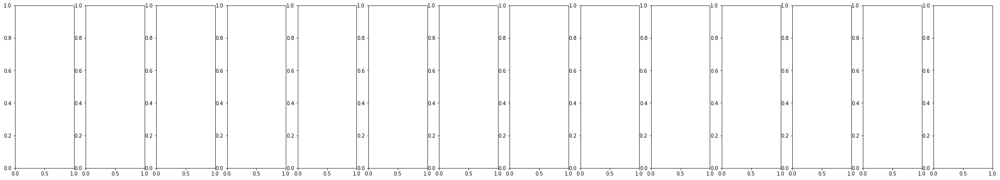

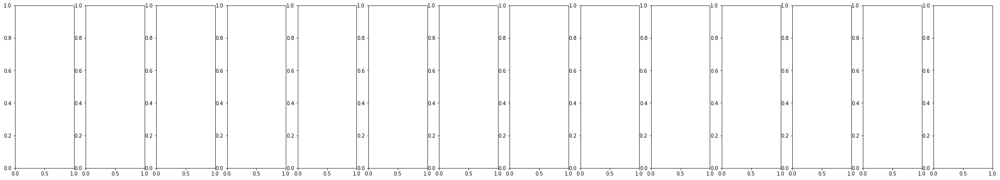

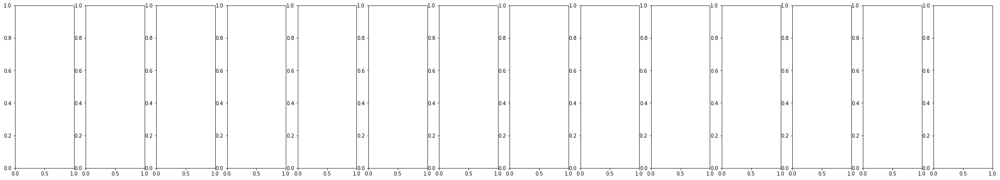

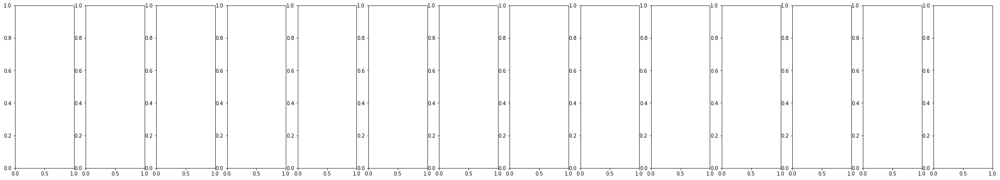

...

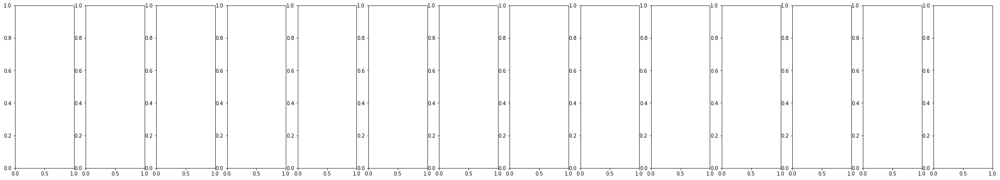

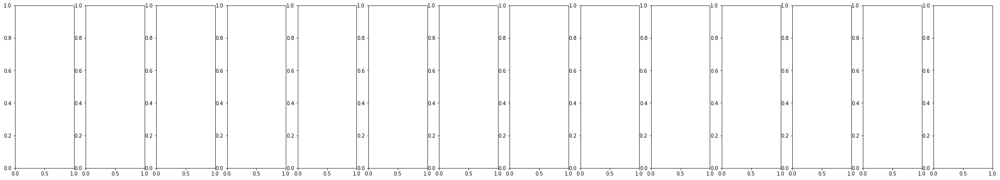

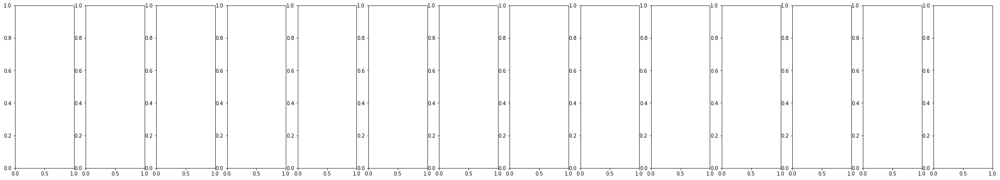

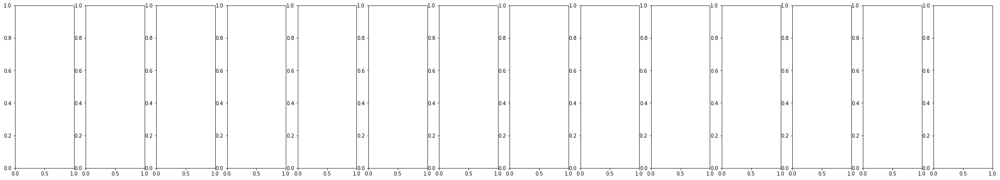

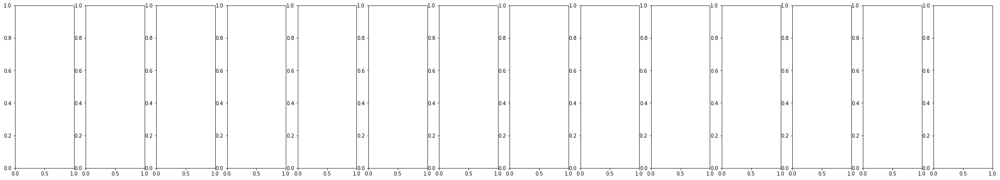

In [15]:
Filter_wavelength_all = [3.663, 4.361, 5.448, 6.407, 7.980, 3.608, 4.671, 6.141, 7.457, 3.542, 4.724, 6.202, 7.673] # JMC, SDSS, SDSSp
color = ['darkviolet', 'royalblue', 'seagreen', 'crimson', 'maroon', 'darkmagenta', 'darkgreen', 'firebrick', 'darkred', 'indigo', 'darkseagreen', 'indianred', 'sienna', 'k']
data_all, mean_all, range_all, padding_all, type_GP_all, mask_all, succ_id_all = GP_interpolate(t_all, m_all, m_err_all, Type_all, Filter_all, Filter_wavelength_all, filename_all, color)

In [16]:
print(np.array(data_all).shape)
print(np.array(mean_all).shape)
print(np.array(range_all).shape)
print(np.array(padding_all).shape)
print(np.array(type_GP_all).shape)
print(np.array(mask_all).shape)
print(np.array(succ_id_all).shape)

(329, 27, 185)
(329,)
(329,)
(329,)
(329,)
(329, 13)
(329,)


In [17]:
num_filter = np.arange(1, 14)
num_filter_err = np.arange(14, 27)

def unnormalization(data, mean, rang):
    data_temp = np.array(data)
    for i in range(data.shape[0]):
        for j in num_filter:
            #print(j)
            data_temp[i,j,:] = data[i,j,:]*rang[i] + mean[i]
        for j in num_filter_err:
            data_temp[i,j,:] = data[i,j,:]*rang[i]
    return data_temp

data_all_un = unnormalization(data_all, mean_all, range_all)

#print(data_all_un[0,1,:])

In [18]:
def weighted_avg2(len_a, len_b, len_B, A, B):
    avg = (len_a + len_b) / 2
    return (avg * A + len_B * B) / (avg + len_B)

def weighted_avg3(len_a, len_b, len_c, len_B, A, B):
    avg = (len_a + len_b + len_c) / 3
    return (avg * A + len_B * B) / (avg + len_B)

def weighted_avg4(len_a, len_b, len_c, len_d, len_B, A, B):
    avg = (len_a + len_b + len_c + len_d) / 4
    return (avg * A + len_B * B) / (avg + len_B)

def weighted_avg2_err(len_a, len_b, len_B, A, B):
    avg = (len_a + len_b) / 2
    total = avg + len_B
    return ((avg*A/total)**2 + (len_B*B/total)**2)**0.5

def weighted_avg3_err(len_a, len_b, len_c, len_B, A, B):
    avg = (len_a + len_b + len_c) / 3
    total = avg + len_B
    return ((avg*A/total)**2 + (len_B*B/total)**2)**0.5

def weighted_avg4_err(len_a, len_b, len_c, len_d, len_B, A, B):
    avg = (len_a + len_b + len_c + len_d) / 4
    total = avg + len_B
    return ((avg*A/total)**2 + (len_B*B/total)**2)**0.5

In [19]:
'''Conversion from SDSS_p to SDSS

Equations from Andrew Pickles
Las Cumbres Observatory Global Telescope, Santa Barbara, CA
The 2010 STScI Calibration Workshop
''' 
    
data_all_temp = np.zeros((data_all.shape))
data_all_temp1 = np.zeros((data_all.shape))
data_all_temp2 = np.zeros((data_all.shape))

mask_temp1 = []
mask_temp2 = []

print(data_all_un.shape)
for i in range(data_all_un.shape[0]):
    mask_temp1.append([])
    
    data_all_temp[i,6,:] =         data_all_un[i,10,:]
    data_all_temp[i,7,:] = 0.037 + data_all_un[i,11,:] + 0.060 * (data_all_un[i,11,:] - data_all_un[i,12,:] - 0.53)
    data_all_temp[i,8,:] = 0.010 + data_all_un[i,12,:] + 0.035 * (data_all_un[i,12,:] - data_all_un[i,13,:] - 0.21)
    data_all_temp[i,9,:] =         data_all_un[i,13,:] + 0.041 * (data_all_un[i,12,:] - data_all_un[i,13,:] - 0.21)
    
    data_all_temp[i,19,:] =            data_all_un[i,23,:]
    data_all_temp[i,20,:] = ( (1.060 * data_all_un[i,24,:])**2 + (0.060 * data_all_un[i,25,:])**2 )**0.5
    data_all_temp[i,21,:] = ( (1.035 * data_all_un[i,25,:])**2 + (0.035 * data_all_un[i,26,:])**2 )**0.5
    data_all_temp[i,22,:] = ( (0.959 * data_all_un[i,26,:])**2 + (0.041 * data_all_un[i,25,:])**2 )**0.5
    
    if mask_all[i][9] == 1: # u'
        #print(len(m_all[i][9]), len(m_all[i][9]), len(m_all[i][5]))
        data_all_temp1[i,6,:] = weighted_avg2(len(m_all[succ_id_all[i]][9]), len(m_all[succ_id_all[i]][9]), len(m_all[succ_id_all[i]][5]), data_all_temp[i,6,:], data_all_un[i,6,:])
        data_all_temp1[i,19,:] = weighted_avg2_err(len(m_all[succ_id_all[i]][9]), len(m_all[succ_id_all[i]][9]), len(m_all[succ_id_all[i]][5]), data_all_temp[i,19,:], data_all_un[i,19,:])
        mask_temp1[i].append(1)
    else:
        mask_temp1[i].append(0)
    
    if (mask_all[i][10] == 1) & (mask_all[i][11] == 1): # g' and r'
        data_all_temp1[i,7,:] = weighted_avg2(len(m_all[succ_id_all[i]][10]), len(m_all[succ_id_all[i]][11]), len(m_all[succ_id_all[i]][6]), data_all_temp[i,7,:], data_all_un[i,7,:])
        data_all_temp1[i,20,:] = weighted_avg2_err(len(m_all[succ_id_all[i]][10]), len(m_all[succ_id_all[i]][11]), len(m_all[succ_id_all[i]][6]), data_all_temp[i,20,:], data_all_un[i,20,:])
        mask_temp1[i].append(1)
    else:
        mask_temp1[i].append(0)
    
    if (mask_all[i][11] == 1) & (mask_all[i][12] == 1): # r' and i'
        data_all_temp1[i,8,:] = weighted_avg2(len(m_all[succ_id_all[i]][11]), len(m_all[succ_id_all[i]][12]), len(m_all[succ_id_all[i]][7]), data_all_temp[i,8,:], data_all_un[i,8,:])
        data_all_temp1[i,21,:] = weighted_avg2_err(len(m_all[succ_id_all[i]][11]), len(m_all[succ_id_all[i]][12]), len(m_all[succ_id_all[i]][7]), data_all_temp[i,21,:], data_all_un[i,21,:])
        mask_temp1[i].append(1)
    else:
        mask_temp1[i].append(0)
        
    if (mask_all[i][11] == 1) & (mask_all[i][12] == 1): # r' and i'
        data_all_temp1[i,9,:] = weighted_avg2(len(m_all[succ_id_all[i]][11]), len(m_all[succ_id_all[i]][12]), len(m_all[succ_id_all[i]][8]), data_all_temp[i,9,:], data_all_un[i,9,:])
        data_all_temp1[i,22,:] = weighted_avg2_err(len(m_all[succ_id_all[i]][11]), len(m_all[succ_id_all[i]][12]), len(m_all[succ_id_all[i]][8]), data_all_temp[i,22,:], data_all_un[i,22,:])
        mask_temp1[i].append(1)
    else:
        mask_temp1[i].append(0)

(329, 27, 185)


In [20]:
'''Conversion from JMC to SDSS

Equations from Jester et al. (2005)
sdss3.org
''' 

for i in range(data_all_un.shape[0]):
    mask_temp2.append([])
    
    data_all_temp[i,6,:] = 1.28 * data_all_un[i,1,:] - 0.68 * data_all_un[i,2,:] + 0.40 * data_all_un[i,3,:]                                                         + 1.01
    data_all_temp[i,7,:] =                             0.60 * data_all_un[i,2,:] + 0.40 * data_all_un[i,3,:]                                                         - 0.12
    data_all_temp[i,8,:] =                           - 0.42 * data_all_un[i,2,:] + 1.42 * data_all_un[i,3,:]                                                         + 0.11
    data_all_temp[i,9,:] =                           - 0.42 * data_all_un[i,2,:] + 1.42 * data_all_un[i,3,:] - 0.91 * data_all_un[i,4,:] + 0.91 * data_all_un[i,5,:] + 0.31
    
    data_all_temp[i,19,:] = ( (1.28 * data_all_un[i,14,:])**2 + (0.68 * data_all_un[i,15,:])**2 + (0.40 * data_all_un[i,16,:])**2 )**0.5
    data_all_temp[i,20,:] = (                                 + (0.60 * data_all_un[i,15,:])**2 + (0.40 * data_all_un[i,16,:])**2 )**0.5
    data_all_temp[i,21,:] = (                                 + (0.42 * data_all_un[i,15,:])**2 + (1.42 * data_all_un[i,16,:])**2 )**0.5
    data_all_temp[i,22,:] = (                                 + (0.42 * data_all_un[i,15,:])**2 + (1.42 * data_all_un[i,16,:])**2 + (0.91 * data_all_un[i,16,:])**2 + (0.91 * data_all_un[i,16,:])**2 )**0.5
    
    if (mask_all[i][0] == 1) & (mask_all[i][1] == 1) & (mask_all[i][2] == 1): # U, B, V
        data_all_temp2[i,6,:] = weighted_avg3(len(m_all[succ_id_all[i]][0]), len(m_all[succ_id_all[i]][1]), len(m_all[succ_id_all[i]][2]), len(m_all[succ_id_all[i]][5]), data_all_temp[i,6,:], data_all_un[i,6,:])
        data_all_temp2[i,19,:] = weighted_avg3_err(len(m_all[succ_id_all[i]][0]), len(m_all[succ_id_all[i]][1]), len(m_all[succ_id_all[i]][2]), len(m_all[succ_id_all[i]][5]), data_all_temp[i,19,:], data_all_un[i,19,:])
        mask_temp2[i].append(1)
    else:
        mask_temp2[i].append(0)
        
    if (mask_all[i][1] == 1) & (mask_all[i][2] == 1): # B, V
        data_all_temp2[i,7,:] = weighted_avg2(len(m_all[succ_id_all[i]][1]), len(m_all[succ_id_all[i]][2]), len(m_all[succ_id_all[i]][6]), data_all_temp[i,7,:], data_all_un[i,7,:])
        data_all_temp2[i,20,:] = weighted_avg2_err(len(m_all[succ_id_all[i]][1]), len(m_all[succ_id_all[i]][2]), len(m_all[succ_id_all[i]][6]), data_all_temp[i,20,:], data_all_un[i,20,:])
        mask_temp2[i].append(1)
    else:
        mask_temp2[i].append(0)
        
    if (mask_all[i][1] == 1) & (mask_all[i][2] == 1): # B, V
        data_all_temp2[i,8,:] = weighted_avg2(len(m_all[succ_id_all[i]][1]), len(m_all[succ_id_all[i]][2]), len(m_all[succ_id_all[i]][7]), data_all_temp[i,8,:], data_all_un[i,8,:])
        data_all_temp2[i,21,:] = weighted_avg2_err(len(m_all[succ_id_all[i]][1]), len(m_all[succ_id_all[i]][2]), len(m_all[succ_id_all[i]][7]), data_all_temp[i,21,:], data_all_un[i,21,:])
        mask_temp2[i].append(1)
    else:
        mask_temp2[i].append(0)
        
    if (mask_all[i][1] == 1) & (mask_all[i][2] == 1) & (mask_all[i][3] == 1) & (mask_all[i][4] == 1): # B, V, R, I
        data_all_temp2[i,9,:] = weighted_avg4(len(m_all[succ_id_all[i]][1]), len(m_all[succ_id_all[i]][2]), len(m_all[succ_id_all[i]][3]), len(m_all[succ_id_all[i]][4]), len(m_all[succ_id_all[i]][8]), data_all_temp[i,9,:], data_all_un[i,9,:])
        data_all_temp2[i,22,:] = weighted_avg4_err(len(m_all[succ_id_all[i]][1]), len(m_all[succ_id_all[i]][2]), len(m_all[succ_id_all[i]][3]), len(m_all[succ_id_all[i]][4]), len(m_all[succ_id_all[i]][8]), data_all_temp[i,22,:], data_all_un[i,22,:])
        mask_temp2[i].append(1)
    else:
        mask_temp2[i].append(0)

In [21]:
mask_convt = []
data_convt_un = np.zeros((data_all.shape[0], 9, data_all.shape[2]))
data_convt = np.zeros((data_all.shape[0], 9, data_all.shape[2]))
data_convt[:,0,:] = data_all[:,0,:]
for i in range(data_all_un.shape[0]):
    mask_convt.append([])
    for j in range(4):
        if (mask_all[i][j+6] == 1) or (mask_temp1[i][j] == 1) or (mask_temp2[i][j] == 1):
            #print(mask_temp2[i][j])
            #print(np.mean(mask_all[i][j+5]*data_all_un[i,j+5,:]), np.mean(mask_temp1[i][j]*data_all_temp1[i,j+5,:]), np.mean(mask_temp2[i][j]*data_all_temp2[i,j+5,:]))
            #print(np.mean(data_all_un[i,j+6,:]), np.mean(data_all_temp1[i,j+6,:]), np.mean(data_all_temp2[i,j+6,:]))
            data_convt_un[i,j+1,:] = (mask_all[i][j+6]*data_all_un[i,j+6,:] + mask_temp1[i][j]*data_all_temp1[i,j+6,:] + mask_temp2[i][j]*data_all_temp2[i,j+6,:]) / ((mask_all[i][j+6] + mask_temp1[i][j] + mask_temp2[i][j]))
            #print(i, j, np.mean(data_convt_un[i,j+1,:]))
            data_convt_un[i,j+5,:] = ((mask_all[i][j+6]*data_all_un[i,j+19,:])**2 + (mask_temp1[i][j]*data_all_temp1[i,j+19,:])**2 + (mask_temp2[i][j]*data_all_temp2[i,j+19,:])**2)**0.5
            #print(np.mean(data_convt_un[i,j+5,:]))
            mask_convt[i].append(1)
        else:
            #print(i, j, np.mean(data_all_un[i,j+6,:]))
            data_convt_un[i,j+1,:] = data_all_un[i,j+6,:]
            data_convt_un[i,j+5,:] = data_all_un[i,j+19,:]
            mask_convt[i].append(0)

In [22]:
# renormalization and checking for flat light curves
y_mean = []
y_range = []
for i in range(data_convt_un.shape[0]):
    y = []
    
    for j in range(4):
        for k in range(data_convt_un.shape[2]):
            y.append(data_convt_un[i,j+1,k])
            
    y_mean.append(np.mean(y))
    y_range.append(np.max(y) - np.min(y))
    if y_range[-1] == 0:
        print(filename[filename_all[i]])
        print(data_convt_un[i,1,:])
    
    for j in range(4):
        if y_range[-1] != 0:
            data_convt[i,j+1,:] = (data_convt_un[i,j+1,:] - y_mean[-1]) / y_range[-1]
            data_convt[i,j+5,:] = data_convt_un[i,j+5,:] / y_range[-1]

In [23]:
print(data_convt.shape)
print(type(data_convt))

(329, 9, 185)
<class 'numpy.ndarray'>


In [24]:
Filter_SDSS = ['u', 'g', 'r', 'i']

In [25]:
import keras
from keras.models import Sequential
from keras.layers import LSTM, GRU, Dense, Dropout, Layer, Bidirectional, Conv2D, Flatten, BatchNormalization
from keras.layers import RepeatVector, concatenate
from keras.layers import TimeDistributed
from keras.callbacks import EarlyStopping
from keras.utils.vis_utils import plot_model
from keras.optimizers import Adam
import keras.backend as K
import tensorflow as tf

2022-01-25 00:21:26.496736: I tensorflow/stream_executor/platform/default/dso_loader.cc:49] Successfully opened dynamic library libcudart.so.10.1


In [26]:
# Spliting training set and testing set

split_portion = 0.8
split = int(split_portion*(data_convt.shape[0]))

Input = [[],[],[],[]]


Type1 = [i.replace('II P Pec', '1') for i in type_GP_all]
Type1 = [i.replace('II P', '1') for i in Type1]
Type1 = [i.replace('.IIP', '1') for i in Type1]
Type1 = [i.replace('II', '1') for i in Type1]
Type1 = [i.replace('.2P', '1') for i in Type1]
Type1 = [i.replace('.Ia', '0') for i in Type1]
Type1 = [i.replace('Ia Pec', '0') for i in Type1]
Type1 = [i.replace('Ia', '0') for i in Type1]
Type1 = [i.replace('0-91T', '0') for i in Type1]
Type1 = [i.replace('SLSN-I', '0') for i in Type1]
Type1 = [i.replace('IIn', '2') for i in Type1]
Type1 = [i.replace('IIb', '2') for i in Type1]
Type1 = [i.replace('Ic Pec', '2') for i in Type1]
Type1 = [i.replace('Ic BL', '2') for i in Type1]
Type1 = [i.replace('Ib Pec', '2') for i in Type1]
Type1 = [i.replace('Ib/c', '2') for i in Type1]
Type1 = [i.replace('Ib', '2') for i in Type1]
Type1 = [i.replace('Ic', '2') for i in Type1]
Type1 = [i.replace('1b', '2') for i in Type1]
Type1 = [i.replace('1n', '2') for i in Type1]
Type1 = [i.replace('2n', '2') for i in Type1]
Type1 = [i.replace('2 Pec', '2') for i in Type1]
Type1 = [i.replace('0-02cx', '2') for i in Type1]
Type1 = [i.replace('0?', '2') for i in Type1]
Type1 = [i.replace('1ec', '2') for i in Type1]
Type1 = [i.replace('BL-2', '2') for i in Type1]
Type1 = [i.replace('0Pec', '2') for i in Type1]
Type1 = [i.replace('Super-Luminous 2', '2') for i in Type1]
Type1 = [i.replace('TDE', '2') for i in Type1]
Type1 = [i.replace('Ca-rich', '2') for i in Type1]
Type1 = [i.replace('2/2', '2') for i in Type1]
Type1 = [i.replace('~', '2') for i in Type1]
Type1 = [i.replace('0-92g', '0') for i in Type1]
Type1 = [i.replace('0-HV', '0') for i in Type1]
Type1 = [i.replace('1?', '0') for i in Type1]

Type1 = [float(Type1[i]) for i in range(len(Type1))]
Type1 = np.array(Type1)

for i in range(len(Type1)):
    Input[0].append(data_convt[i])
    if Type1[i] == 0:
        Input[1].append(data_convt[i])
    if Type1[i] == 1:
        Input[2].append(data_convt[i])
    if Type1[i] == 2:
        Input[3].append(data_convt[i])
        

Input_train = []
Input_test = []
Type_train = []
Type_test = []

for i in range(len(Input)):
    Input_train.append([])
    Input_test.append([])
    Type_train.append([])
    Type_test.append([])
    
    #print(len(Input[i]))
    Input[i] = np.array(Input[i])
    Input_train[i] = Input[i][:int(split_portion*len(Input[i]))]
    Input_test[i] = Input[i][int(split_portion*len(Input[i])):]
    Input[i] = Input[i].transpose((0, 2, 1))
    Input_train[i] = K.cast_to_floatx(Input_train[i].transpose((0, 2, 1)))
    Input_test[i] = K.cast_to_floatx(Input_test[i].transpose((0, 2, 1)))
    
    #print(split_portion*len(Input[i]))
    Type_train[i] = Type1[:int(split_portion*len(Input[i]))]
    Type_test[i] = Type1[int(split_portion*len(Input[i])):]

print(Input[0].shape, Input_train[0].shape, Input_test[0].shape) #no. of sample (batch size), timesteps in RNN, no. of features
print(Input[1].shape, Input_train[1].shape, Input_test[1].shape)
print(Input[2].shape, Input_train[2].shape, Input_test[2].shape)
print(Input[3].shape, Input_train[3].shape, Input_test[3].shape)

(329, 185, 9) (263, 185, 9) (66, 185, 9)
(188, 185, 9) (150, 185, 9) (38, 185, 9)
(66, 185, 9) (52, 185, 9) (14, 185, 9)
(75, 185, 9) (60, 185, 9) (15, 185, 9)


In [27]:
print(np.array(mask_convt).shape)
print(Type_train[0].shape)

(329, 4)
(263,)


In [28]:
# Custom loss function weighting the non-padding part, the loss function only calculate magnitude, but not the time and error
# Buggy for a specific type of Input, but fine for Input[0]
def masking(Input, padding_point, split):
    
    weight = []
    for i in range(Input.shape[0]):
        temp1 = [1 for j in range(padding_point[i+split])]
        temp2 = [0 for j in range(Input.shape[1]-padding_point[i+split])]
        temp = np.hstack((temp1, temp2))
        weight.append(temp)
        weight1 = np.array(weight)
    #print(weight1[0])
    #print(weight1.shape)
    
    mask = [weight1 for i in range(Input.shape[2])]
    print(np.array(mask).shape)
    mask = np.transpose(mask, (1, 2, 0))
    print(np.array(mask).shape)
    #print(1,mask)
    
    '''for i in range(mask.shape[0]):
        for j in range(len(Filter_SDSS)):
            #print(mask_convt[i+split][j])
            mask[i,:,j+1] = mask[i,:,j+1] * mask_convt[i+split][j]
            mask[i,:,j+5] = mask[i,:,j+5] * mask_convt[i+split][j]'''
    #print(2,mask)
    return mask
    # np.array([[mask for i in range(weight1.shape[1])] for j in range(weight1.shape[0])])

def my_loss_fn(y_true, y_pred, mask, Filter):
    y_true_masked = tf.math.multiply(y_true, mask)
    y_pred_masked = tf.math.multiply(y_pred, mask[:,:,1:len(Filter)+1])
    mse = tf.keras.losses.mean_squared_error(y_true = y_true_masked[:,:,1:len(Filter)+1], y_pred = y_pred_masked[:,:,:])
    return mse


mask_train = [0]*len(Input)
mask_test = [0]*len(Input)
for i in range(len(mask_train)):
    mask_train[i] = masking(Input_train[i], padding_all, 0)
    mask_test[i] = masking(Input_test[i], padding_all, split)
#print(np.mean(mask_train[0]))

#print(type(Input_train[0]))
#print(my_loss_fn(Input_train[0], 0.8*Input_train[0][:,:,1:len(Filter_SDSS)+1], mask_train[0], Filter_SDSS))

(9, 263, 185)
(263, 185, 9)
(9, 66, 185)
(66, 185, 9)
(9, 150, 185)
(150, 185, 9)
(9, 38, 185)
(38, 185, 9)
(9, 52, 185)
(52, 185, 9)
(9, 14, 185)
(14, 185, 9)
(9, 60, 185)
(60, 185, 9)
(9, 15, 185)
(15, 185, 9)


In [29]:
# Autoencoder

input_seq = keras.Input(shape=(Input[0].shape[1], Input[0].shape[2]))
input_mask = keras.Input(shape=(Input[0].shape[1], Input[0].shape[2]))
input_conc_phase = keras.Input(shape=(Input[0].shape[1], 1))

x = BatchNormalization()(input_seq)
x = Bidirectional(GRU(185, activation='tanh', return_sequences=True))(x)
x = BatchNormalization()(x)
x = Bidirectional(GRU(50, activation='tanh', return_sequences=True))(x)
x = BatchNormalization()(x)
encoded = Bidirectional(GRU(6, activation='tanh', return_sequences=False))(x)

x = RepeatVector(Input[0].shape[1])(encoded)
merged = concatenate([x, input_conc_phase], axis=-1)
x = BatchNormalization()(merged)
x = Bidirectional(GRU(50, activation='tanh', return_sequences=True))(x)
x = BatchNormalization()(x)
x = Bidirectional(GRU(185, activation='tanh', return_sequences=True))(x)
x = BatchNormalization()(x)
decoded = TimeDistributed(Dense(Input[0].shape[2]-len(Filter_SDSS)-1))(x)

autoencoder = keras.Model([input_seq, input_mask, input_conc_phase], decoded)
autoencoder.add_loss(my_loss_fn(input_seq, decoded, input_mask, Filter_SDSS))
encoder = keras.Model(input_seq, encoded)

opt = Adam(learning_rate=0.0001)

autoencoder.compile(optimizer=opt, loss=None)
autoencoder.summary()

2022-01-25 00:21:27.731759: I tensorflow/compiler/jit/xla_cpu_device.cc:41] Not creating XLA devices, tf_xla_enable_xla_devices not set
2022-01-25 00:21:27.732861: I tensorflow/stream_executor/platform/default/dso_loader.cc:49] Successfully opened dynamic library libcuda.so.1
2022-01-25 00:21:30.341910: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1720] Found device 0 with properties: 
pciBusID: 0000:09:00.0 name: GeForce RTX 2080 Ti computeCapability: 7.5
coreClock: 1.635GHz coreCount: 68 deviceMemorySize: 10.76GiB deviceMemoryBandwidth: 573.69GiB/s
2022-01-25 00:21:30.343066: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1720] Found device 1 with properties: 
pciBusID: 0000:0a:00.0 name: GeForce RTX 2080 Ti computeCapability: 7.5
coreClock: 1.635GHz coreCount: 68 deviceMemorySize: 10.76GiB deviceMemoryBandwidth: 573.69GiB/s
2022-01-25 00:21:30.344190: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1720] Found device 2 with properties: 
pciBusID: 0000:43:00.0 name: GeFo

Model: "model"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            [(None, 185, 9)]     0                                            
__________________________________________________________________________________________________
batch_normalization (BatchNorma (None, 185, 9)       36          input_1[0][0]                    
__________________________________________________________________________________________________
bidirectional (Bidirectional)   (None, 185, 370)     217560      batch_normalization[0][0]        
__________________________________________________________________________________________________
batch_normalization_1 (BatchNor (None, 185, 370)     1480        bidirectional[0][0]              
______________________________________________________________________________________________

In [30]:
Input_train_conc = np.zeros((Input_train[0].shape[0], Input_train[0].shape[1], 1))

for i in range(Input_train_conc.shape[0]):
    Input_train_conc[i,:,0] = Input_train[0][i,:,0]
    
print(Input_train_conc.shape)

(263, 185, 1)


In [31]:
callbacks = EarlyStopping(monitor='val_loss', min_delta=0, patience=50,
                       verbose=0, mode='min', baseline=None,
                       restore_best_weights=True)

history = autoencoder.fit(x=[Input_train[0], mask_train[0], Input_train_conc], y=None,
                          validation_split = 0.1,
                          epochs=1000,
                          verbose=1,
                          callbacks=[callbacks])

Epoch 1/1000


2022-01-25 00:21:33.932817: I tensorflow/compiler/mlir/mlir_graph_optimization_pass.cc:116] None of the MLIR optimization passes are enabled (registered 2)
2022-01-25 00:21:33.933471: I tensorflow/core/platform/profile_utils/cpu_utils.cc:112] CPU Frequency: 2994040000 Hz
2022-01-25 00:21:42.169997: I tensorflow/stream_executor/platform/default/dso_loader.cc:49] Successfully opened dynamic library libcublas.so.10
2022-01-25 00:21:42.416603: I tensorflow/stream_executor/platform/default/dso_loader.cc:49] Successfully opened dynamic library libcudnn.so.7


8/8 [==============================] - 13s 400ms/step - loss: 0.8743 - val_loss: 0.0813
Epoch 2/1000
8/8 [==============================] - 1s 96ms/step - loss: 0.1779 - val_loss: 0.0601
Epoch 3/1000
8/8 [==============================] - 1s 95ms/step - loss: 0.0893 - val_loss: 0.0519
Epoch 4/1000
8/8 [==============================] - 1s 94ms/step - loss: 0.0662 - val_loss: 0.0465
Epoch 5/1000
8/8 [==============================] - 1s 95ms/step - loss: 0.0488 - val_loss: 0.0443
Epoch 6/1000
8/8 [==============================] - 1s 97ms/step - loss: 0.0403 - val_loss: 0.0420
Epoch 7/1000
8/8 [==============================] - 1s 87ms/step - loss: 0.0356 - val_loss: 0.0386
Epoch 8/1000
8/8 [==============================] - 1s 95ms/step - loss: 0.0348 - val_loss: 0.0370
Epoch 9/1000
8/8 [==============================] - 1s 98ms/step - loss: 0.0293 - val_loss: 0.0359
Epoch 10/1000
8/8 [==============================] - 1s 98ms/step - loss: 0.0323 - val_loss: 0.0356
Epoch 11/1000
8/8 [=

(0.0, 0.05)

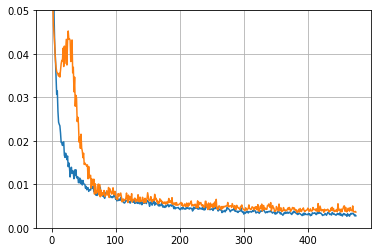

In [32]:
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.grid()
plt.ylim(0, 0.05)

In [33]:
Input_test_conc = np.zeros((Input_test[0].shape[0], Input_test[0].shape[1], 1))

for i in range(Input_test_conc.shape[0]):
    Input_test_conc[i,:,0] = Input_test[0][i,:,0]
    
print(Input_test_conc.shape)

(66, 185, 1)


In [34]:
# Demonstrate recreation
yhat = autoencoder.predict(x=[Input_test[0], mask_test[0], Input_test_conc], verbose=1)
yhat_loss = autoencoder.evaluate(x=[Input_test[0], mask_test[0], Input_test_conc], y=None, verbose=1)

latent_space = [encoder.predict(Input_train[i], verbose=1) for i in range(len(Input))]

2/2 [==============================] - 0s 25ms/step


(263, 12)
11 7


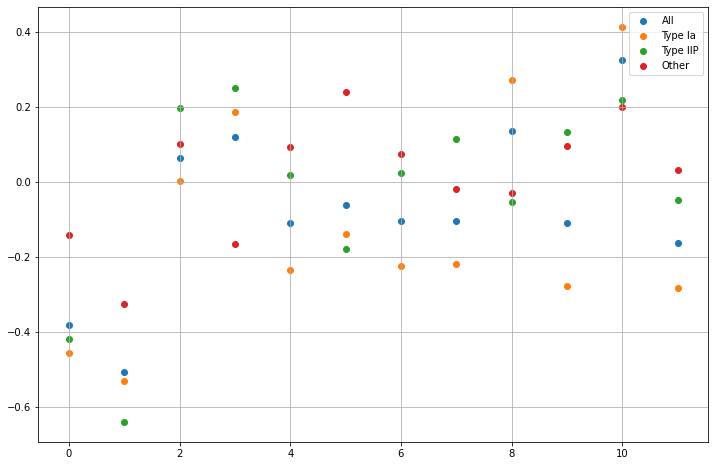

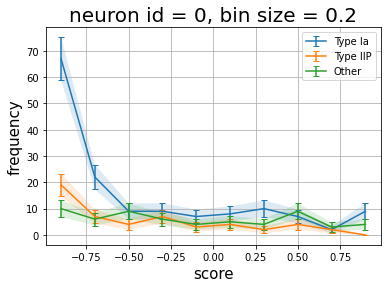

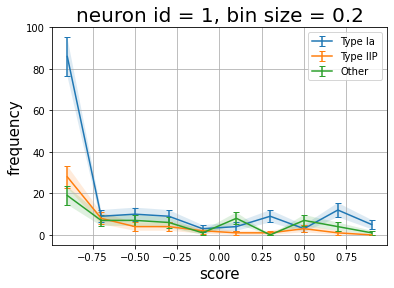

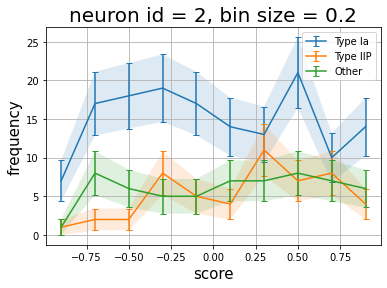

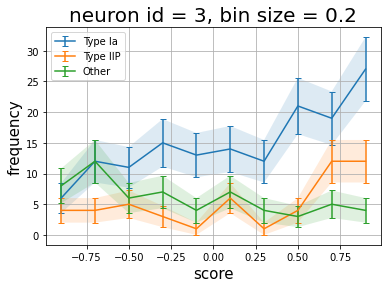

...

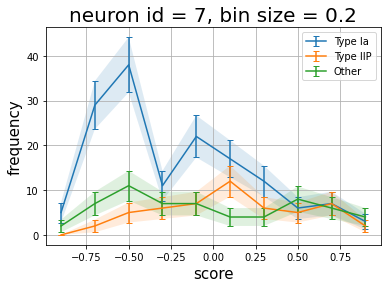

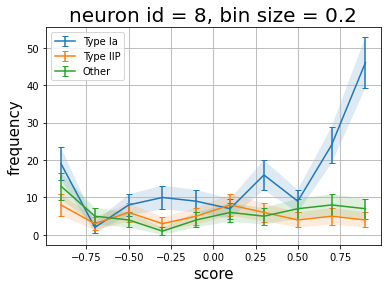

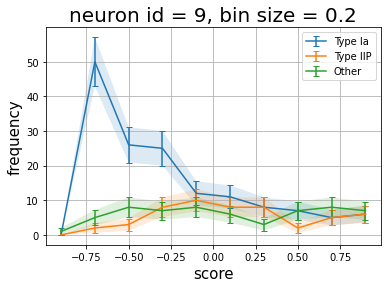

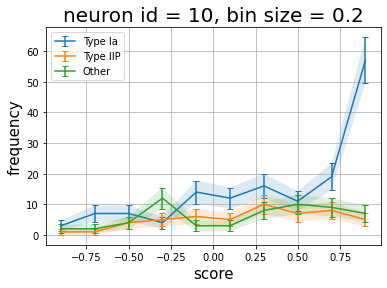

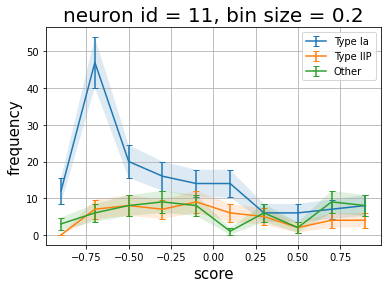

In [35]:
print(latent_space[0].shape)

avgscore = [sum(latent_space[i][:] / latent_space[i].shape[0]) for i in range(len(latent_space))]

diff = abs(avgscore[1] - (avgscore[2]+avgscore[3])/2)
#diff = abs(avgscore[1] - avgscore[2])
living1 = 0
living2 = 0
for i in range(latent_space[0].shape[1]):
    if diff[i] > 0.1:
        living1 += 1
    if diff[i] > 0.2:
        living2 += 1
print(living1, living2)

'''for i in range(latent_space[0].shape[1] - 1):
    plt.grid()
    plt.scatter(latent_space[1][:,i], latent_space[1][:,i+1])
    plt.scatter(latent_space[2][:,i], latent_space[2][:,i+1])
    plt.show()'''

label = ['All', 'Type Ia', 'Type IIP', 'Other']
#label = ['All', 'Type Ia', 'All Other']

plt.figure(figsize=(12,8))
plt.grid()
for i in range(len(Input)):
    x = np.arange(0, latent_space[i].shape[1], 1)
    y = [sum(latent_space[i][:,j]) / latent_space[i].shape[0] for j in range(latent_space[i].shape[1])]
    plt.scatter(x, y, label=label[i])
    plt.legend()
    #plt.savefig('latent_space_sum.jpg', dpi=150)

plt.show()

hist = [0]*(len(Input)-1)

# x-axis score, y-axis frequency
for i in range(latent_space[0].shape[1]):
    for j in range(len(Input)-1):
        hist[j], bin_edges = np.histogram(latent_space[j+1][:,i], bins = np.arange(-1.0001, 1.0001, 0.2), density = False)
        bins_mean = [0.5 * (bin_edges[k] + bin_edges[k+1]) for k in range(len(hist[j]))]
        plt.errorbar(bins_mean, hist[j], yerr=hist[j]**0.5, capsize=3, label=label[j+1])
        plt.fill_between(bins_mean, hist[j]-hist[j]**0.5, hist[j]+hist[j]**0.5, alpha=0.15)
     
    c = []
    for j in range(len(Input)-1):
        #Normalized Chi^2 calculation
        hist[j] = hist[j] / sum(hist[j])
        hist[j-1] = hist[j-1] / sum(hist[j-1])
        a = np.square(np.subtract(hist[j], hist[j-1]))
        b = np.add(hist[j], hist[j-1])
        c.append(np.sum(np.divide(a+1e-8, b+1e-8)))
        #print(hist[j], hist[j-1])
    
    plt.title('neuron id = {}, bin size = 0.2'.format(i), fontsize=20)
    plt.xlabel('score', fontsize=15)
    plt.ylabel('frequency', fontsize=15)
    plt.legend()
    plt.grid()
    #plt.savefig('neuron id = {}.jpg'.format(i), dpi=150)
    plt.show()

In [36]:
# All type
from keras.utils import to_categorical
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay

avg = 0
trial = 20
cm = np.zeros((3,3))
type_predict = []
for i in range(trial):
    Type_train_y = to_categorical(Type_train[0], num_classes=3)
    Type_test_y = to_categorical(Type_test[0], num_classes=3)
    
    x = BatchNormalization()(encoded)
    x = Dense(128, activation='relu')(x)
    x = BatchNormalization()(x)
    classified = Dense(3, activation='softmax')(x)
    classifier = keras.Model(input_seq, classified)

    for l1,l2 in zip(classifier.layers[:], encoder.layers[:]):
        l1.set_weights(l2.get_weights())

    for layer in classifier.layers[:-6]:
        layer.trainable = False
    
    opt = Adam(learning_rate=0.001)
    
    classifier.compile(optimizer=opt, loss='categorical_crossentropy', metrics=['accuracy'])
    callbacks = EarlyStopping(monitor='loss', min_delta=1e-3, patience=20, restore_best_weights=True)
    history = classifier.fit(Input_train[0], Type_train_y, epochs=200, callbacks=[callbacks])
    
    y = classifier.predict(Input_test[0])
    type_predict.append(y)
    score = classifier.evaluate(Input_test[0], Type_test_y)
    avg += score[1]
    
    Type_test_y_cm = np.argmax(Type_test_y, axis=1)
    y_pred = np.argmax(y, axis=1)
    cm += confusion_matrix(Type_test_y_cm, y_pred, normalize='true')

cm = cm/trial
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=['Ia', 'IIP', 'other'])
disp.plot()
plt.savefig('Encoder Classifier Confusion Matrix.jpg', dpi=300)

classifier.summary()
type_predict = np.mean(np.array(type_predict), axis=0)
print(type_predict)
print(avg/trial)

Epoch 1/200
9/9 [==============================] - 5s 34ms/step - loss: 1.2027 - accuracy: 0.4271
Epoch 2/200
9/9 [==============================] - 0s 29ms/step - loss: 0.8943 - accuracy: 0.6494
Epoch 3/200
9/9 [==============================] - 0s 30ms/step - loss: 0.7402 - accuracy: 0.7243
Epoch 4/200
9/9 [==============================] - 0s 32ms/step - loss: 0.7306 - accuracy: 0.6901
Epoch 5/200
9/9 [==============================] - 0s 34ms/step - loss: 0.6398 - accuracy: 0.7542
Epoch 6/200
9/9 [==============================] - 0s 33ms/step - loss: 0.5811 - accuracy: 0.7421
Epoch 7/200
9/9 [==============================] - 0s 33ms/step - loss: 0.5684 - accuracy: 0.7780
Epoch 8/200
9/9 [==============================] - 0s 34ms/step - loss: 0.5438 - accuracy: 0.8074
Epoch 9/200
9/9 [==============================] - 0s 33ms/step - loss: 0.4887 - accuracy: 0.8071
Epoch 10/200
9/9 [==============================] - 0s 34ms/step - loss: 0.4671 - accuracy: 0.8632
Epoch 11/200
9/9 [=

Epoch 1/200
9/9 [==============================] - 0s 3ms/step - loss: 1.2670 - accuracy: 0.5577
Epoch 2/200
9/9 [==============================] - 0s 2ms/step - loss: 0.8653 - accuracy: 0.6908
Epoch 3/200
9/9 [==============================] - 0s 2ms/step - loss: 0.5300 - accuracy: 0.7685
Epoch 4/200
9/9 [==============================] - 0s 2ms/step - loss: 0.4148 - accuracy: 0.8596
Epoch 5/200
9/9 [==============================] - 0s 3ms/step - loss: 0.3969 - accuracy: 0.8288
Epoch 6/200
9/9 [==============================] - 0s 3ms/step - loss: 0.3637 - accuracy: 0.8723
Epoch 7/200
9/9 [==============================] - 0s 3ms/step - loss: 0.3302 - accuracy: 0.9037
Epoch 8/200
9/9 [==============================] - 0s 3ms/step - loss: 0.3289 - accuracy: 0.8824
Epoch 9/200
9/9 [==============================] - 0s 3ms/step - loss: 0.2935 - accuracy: 0.8777
Epoch 10/200
9/9 [==============================] - 0s 3ms/step - loss: 0.2581 - accuracy: 0.9137
Epoch 11/200
9/9 [===========

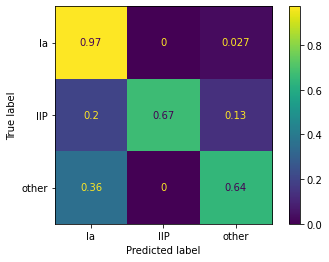

In [ ]:
avg = 0
trial = 50
cm = np.zeros((3,3))
type_predict1 = []
for i in range(trial):
    x = Flatten()(input_seq)
    x = BatchNormalization()(x)
    x = Dense(128, activation='relu')(x)
    x = BatchNormalization()(x)
    classified = Dense(3, activation='softmax')(x)
    classifier1 = keras.Model(input_seq, classified)
    
    opt = Adam(learning_rate=0.001)
    
    classifier1.compile(optimizer=opt, loss='categorical_crossentropy', metrics=['accuracy'])
    callbacks = EarlyStopping(monitor='loss', min_delta=1e-3, patience=20, restore_best_weights=True)
    history = classifier1.fit(Input_train[0], Type_train_y, epochs=200, callbacks=[callbacks])
    
    y = classifier.predict(Input_test[0])
    type_predict1.append(y)
    score = classifier1.evaluate(Input_test[0], Type_test_y)
    avg += score[1]
    
    Type_test_y_cm = np.argmax(Type_test_y, axis=1)
    y_pred = np.argmax(y, axis=1)
    
    Type_test_y_cm = np.argmax(Type_test_y, axis=1)
    y_pred = np.argmax(y, axis=1)
    cm += confusion_matrix(Type_test_y_cm, y_pred, normalize='true')

cm = cm/trial
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=['Ia', 'IIP', 'other'])
disp.plot()
plt.savefig('Bare-boned Classifier Confusion Matrix.jpg', dpi=300)

classifier1.summary()
type_predict1 = np.mean(np.array(type_predict1), axis=0)
print(type_predict1)
print(avg/trial)

II


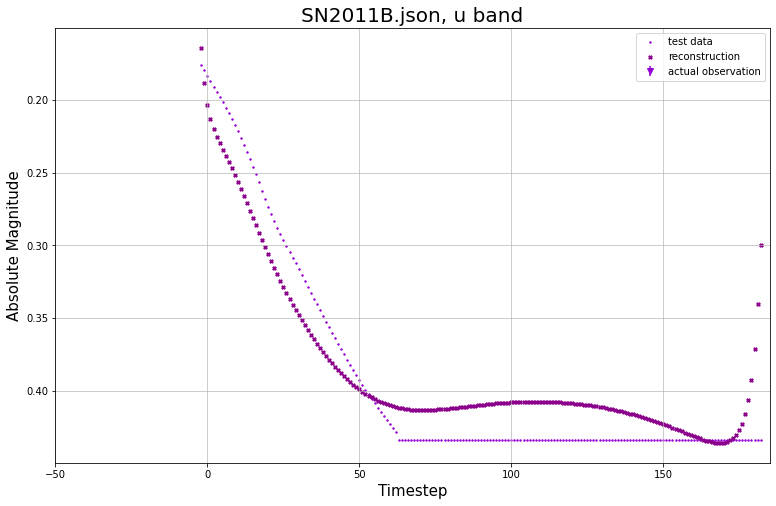

II


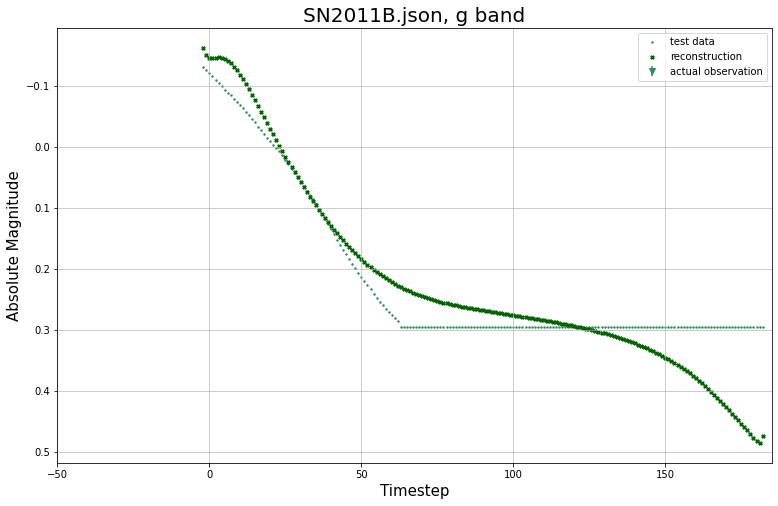

II


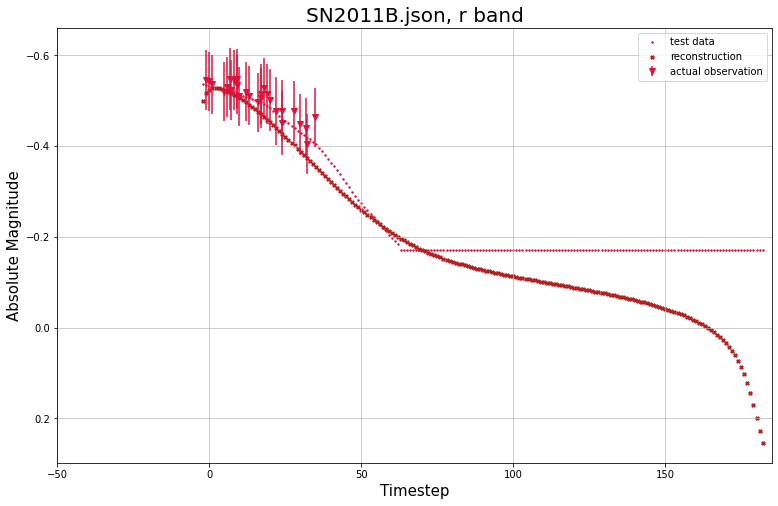

II


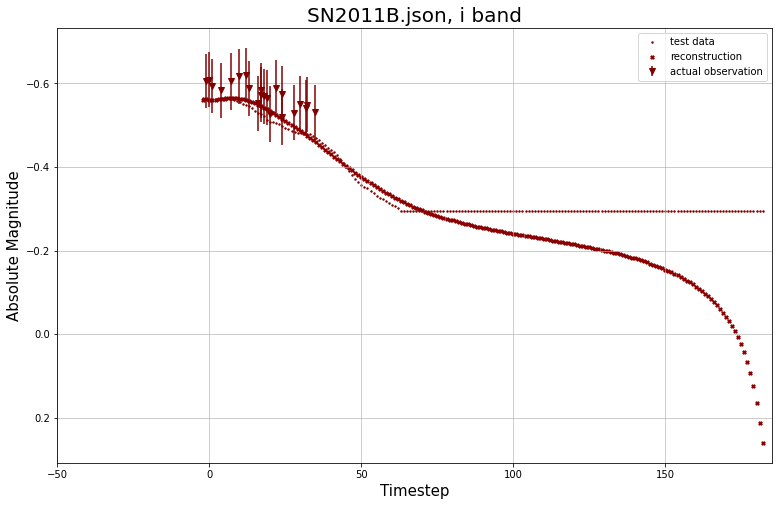

Ic BL


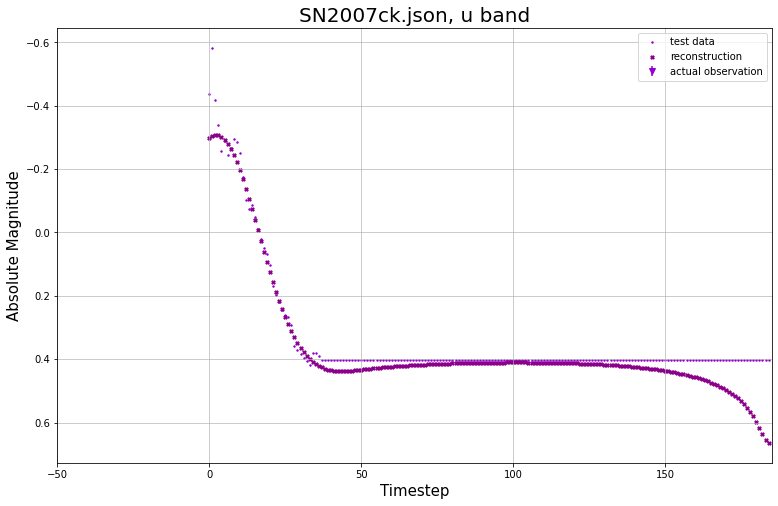

Ic BL


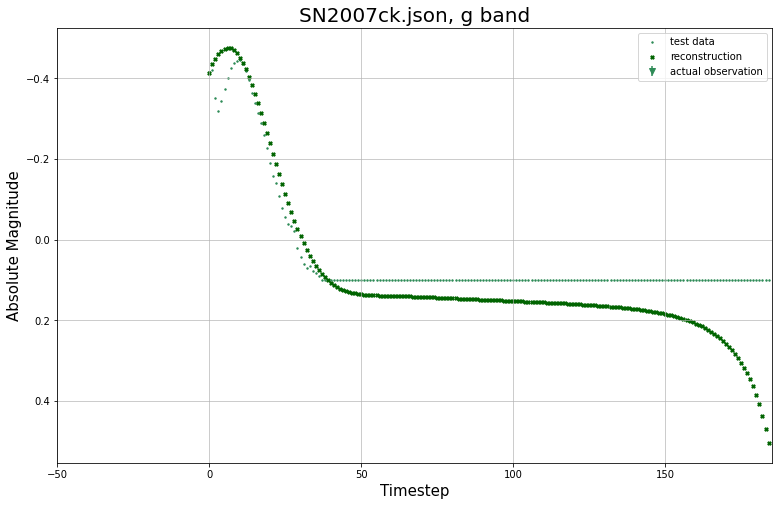

Ic BL


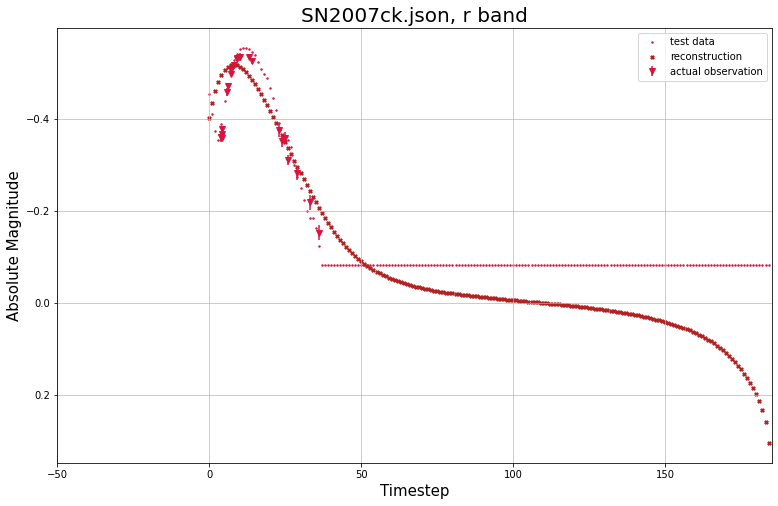

Ic BL


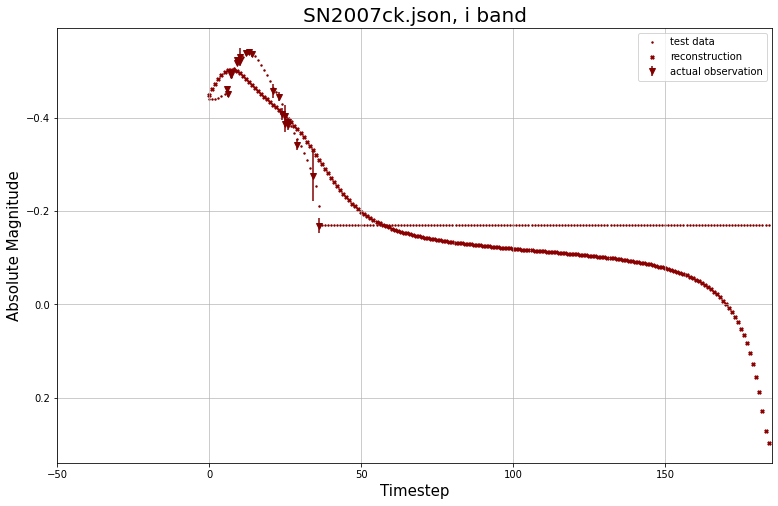

II P


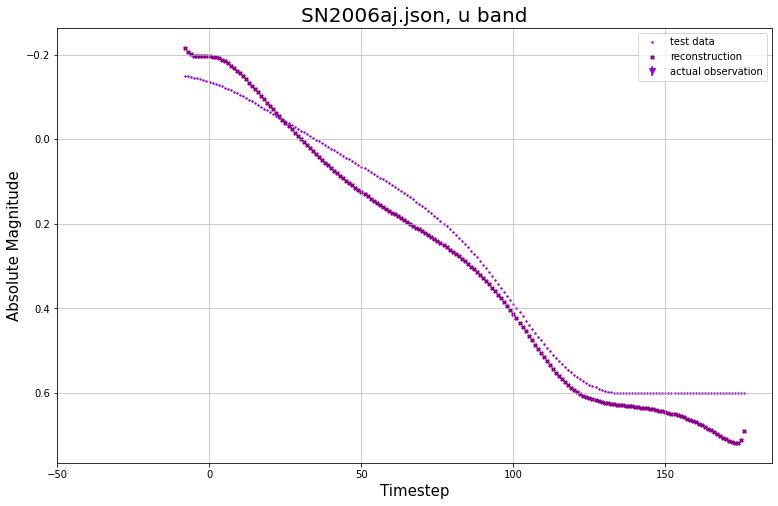

II P


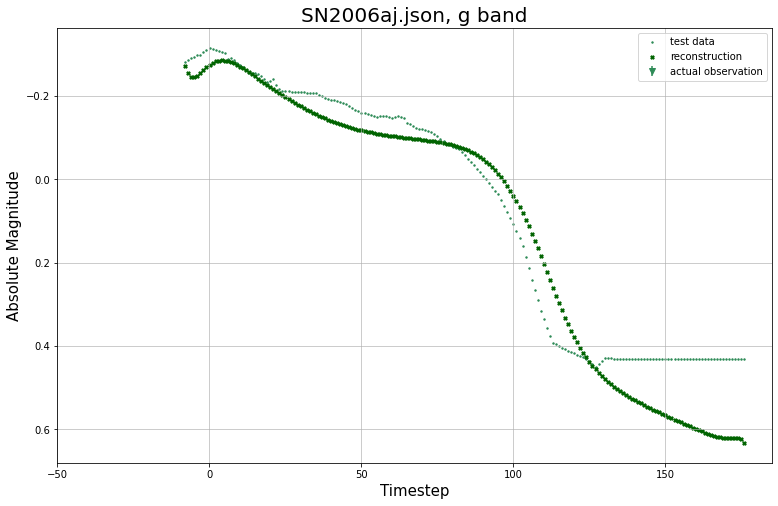

II P


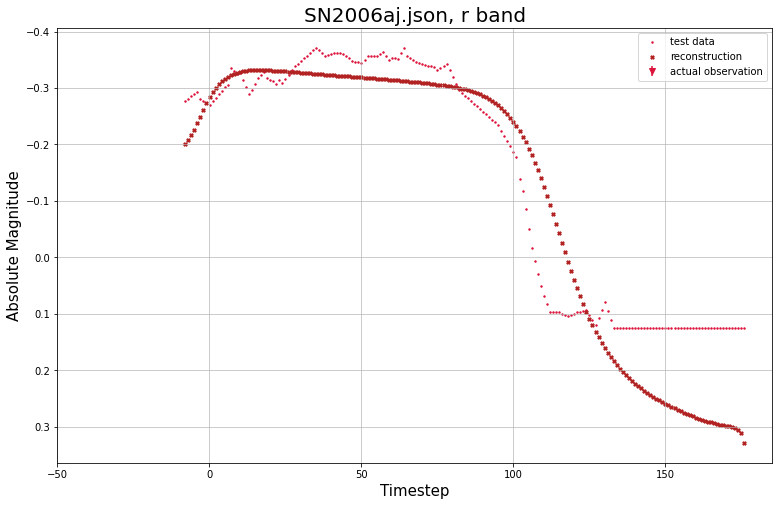

II P


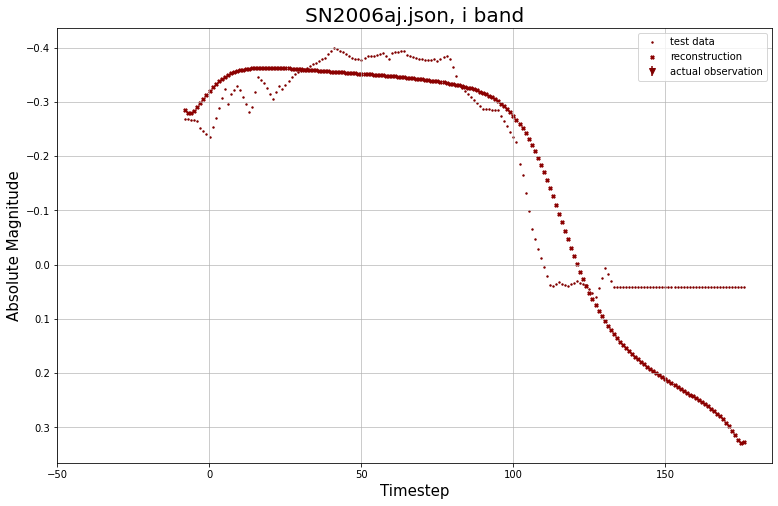

Ia


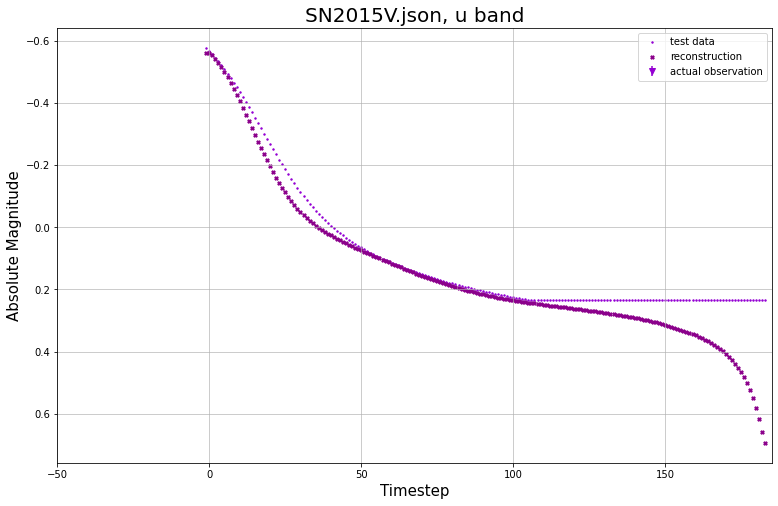

Ia


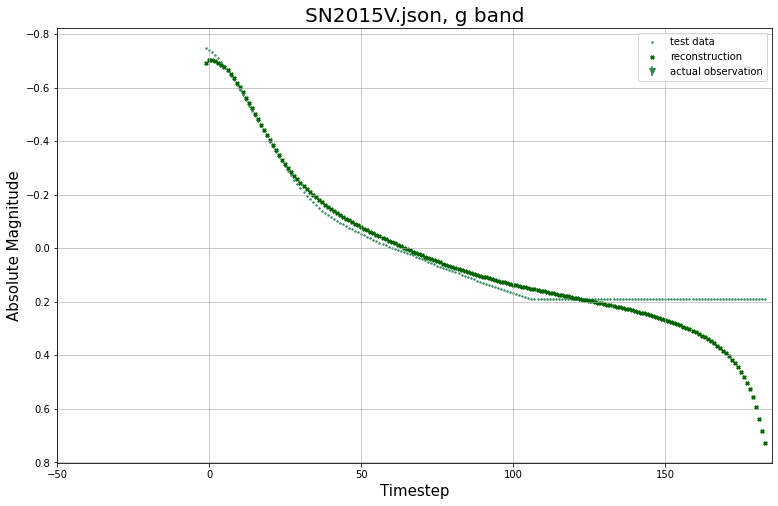

Ia


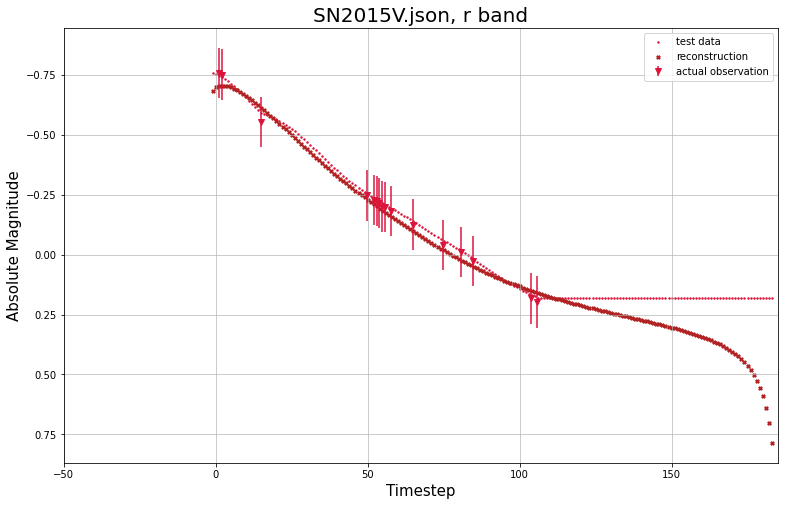

Ia


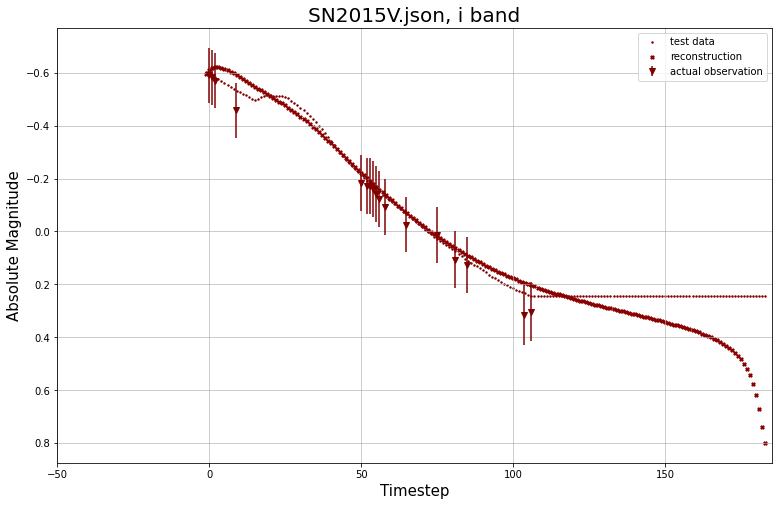

Ia


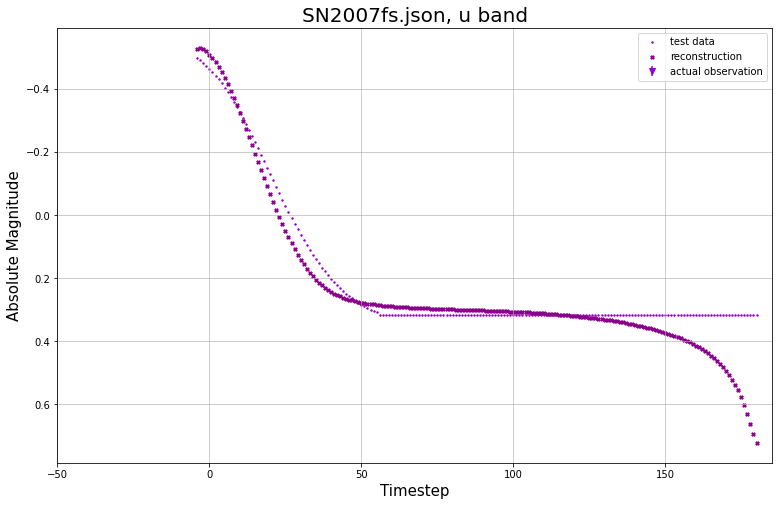

Ia


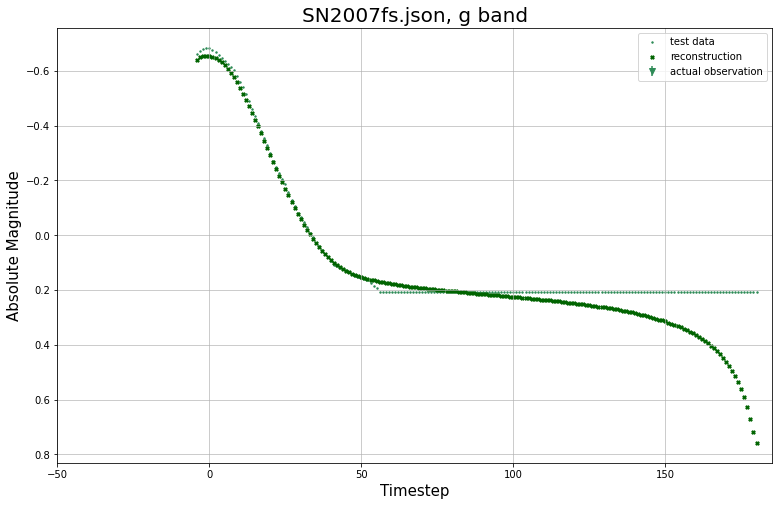

Ia


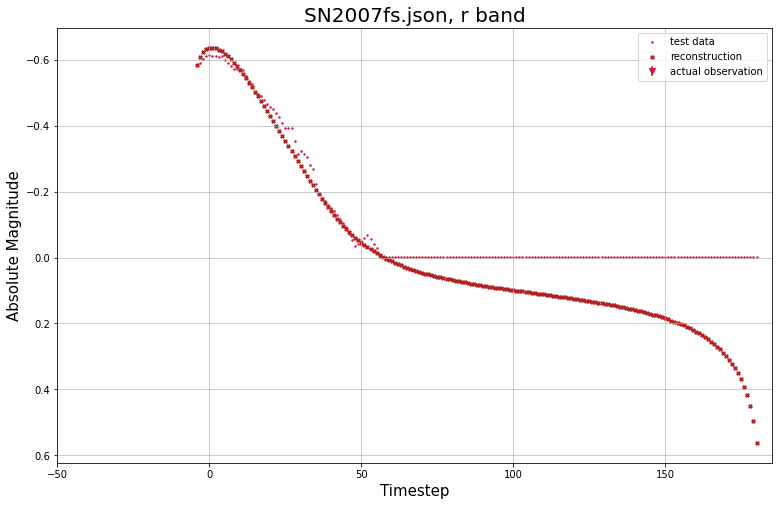

Ia


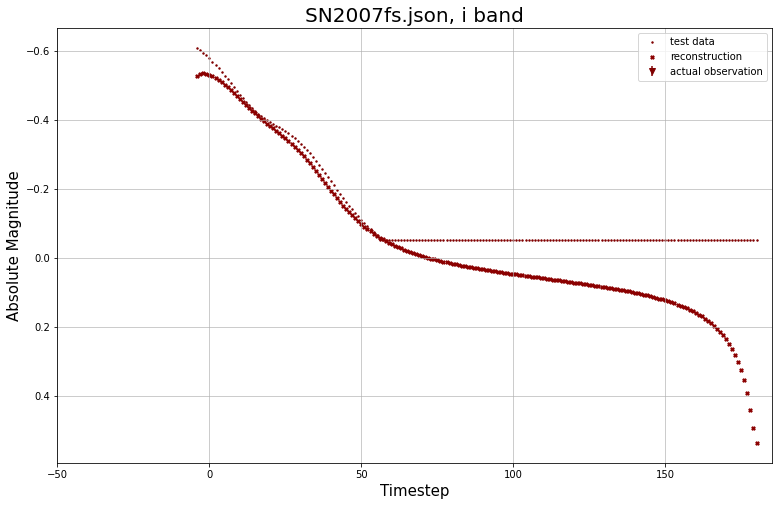

II


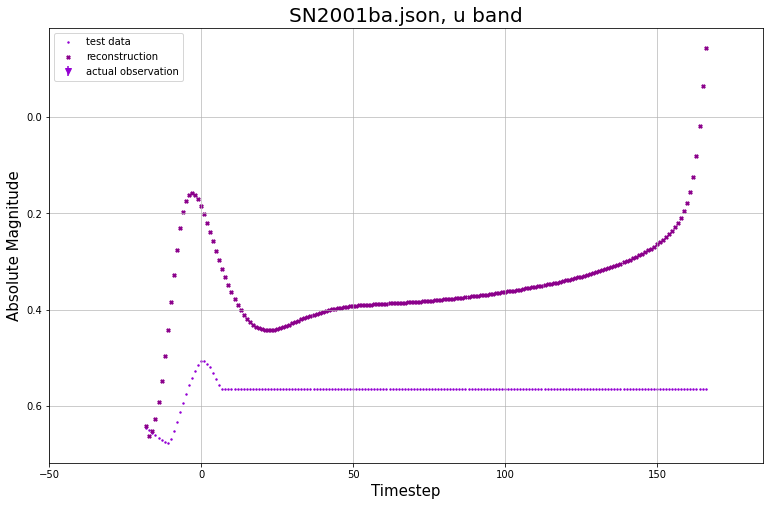

II


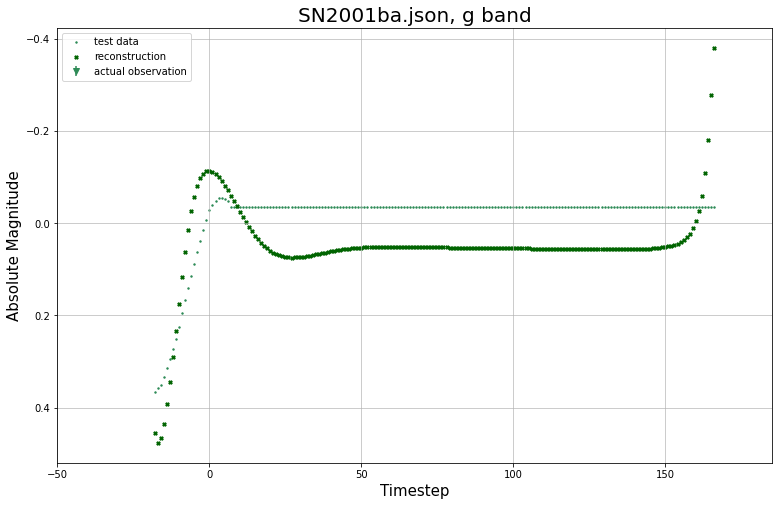

II


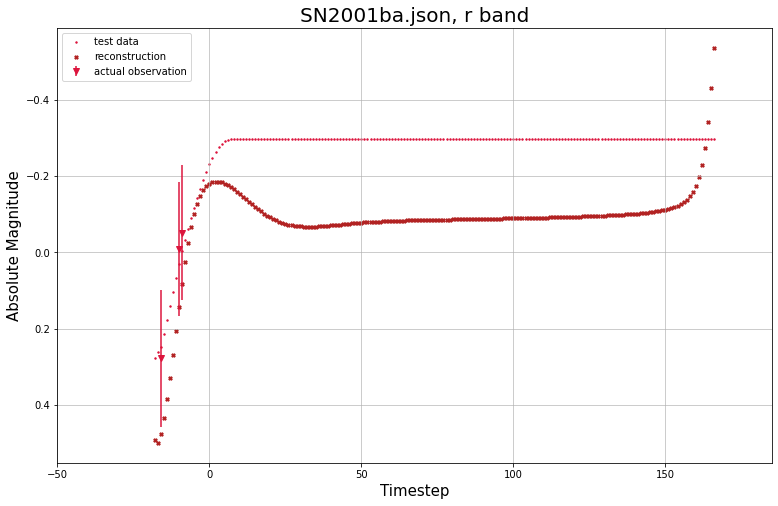

II


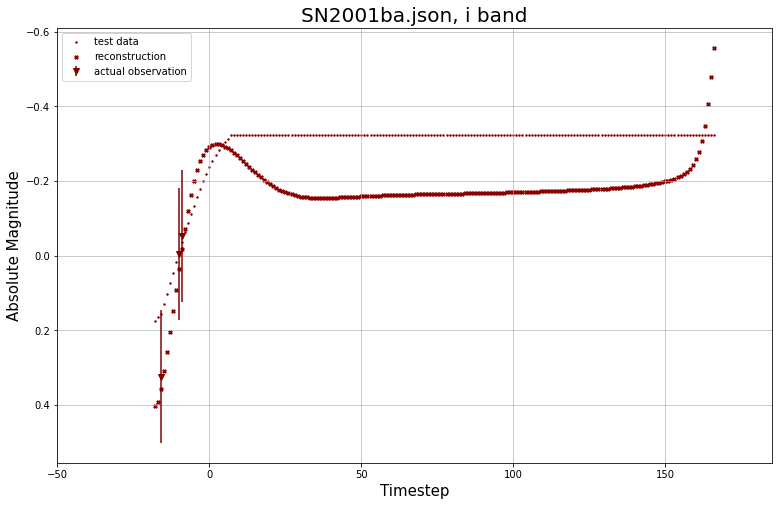

Ia


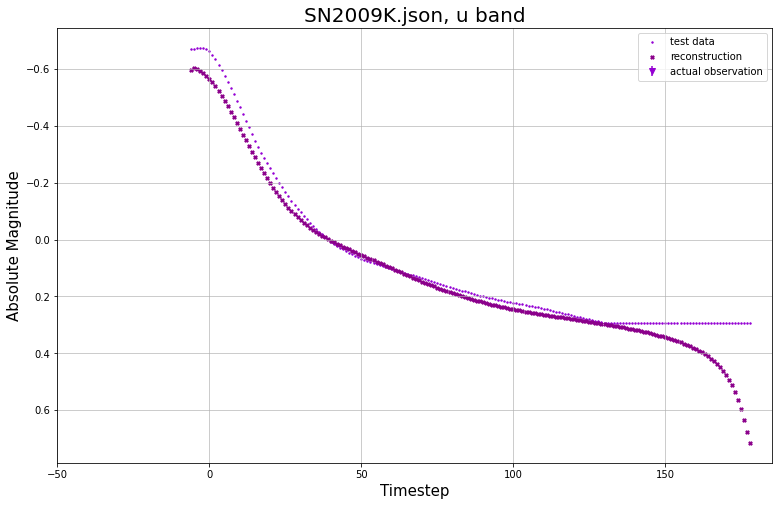

Ia


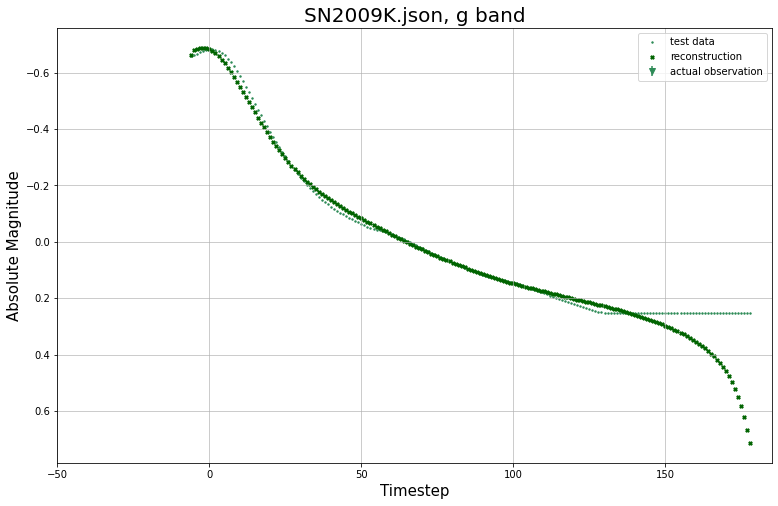

Ia


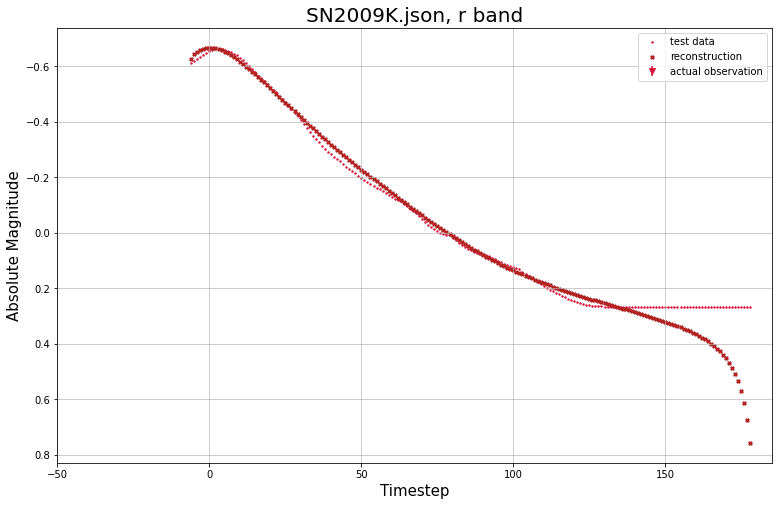

Ia


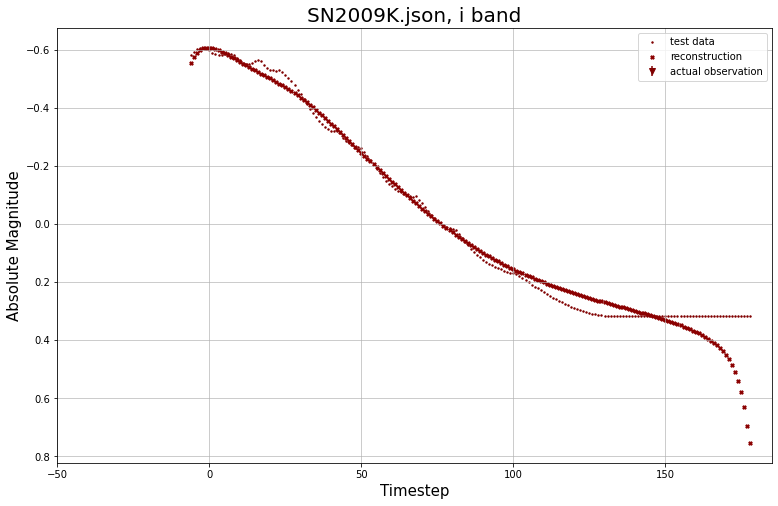

Ib


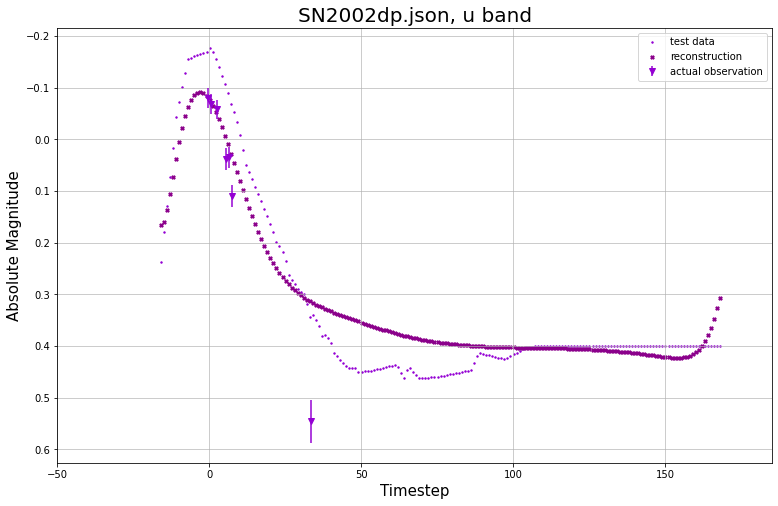

Ib


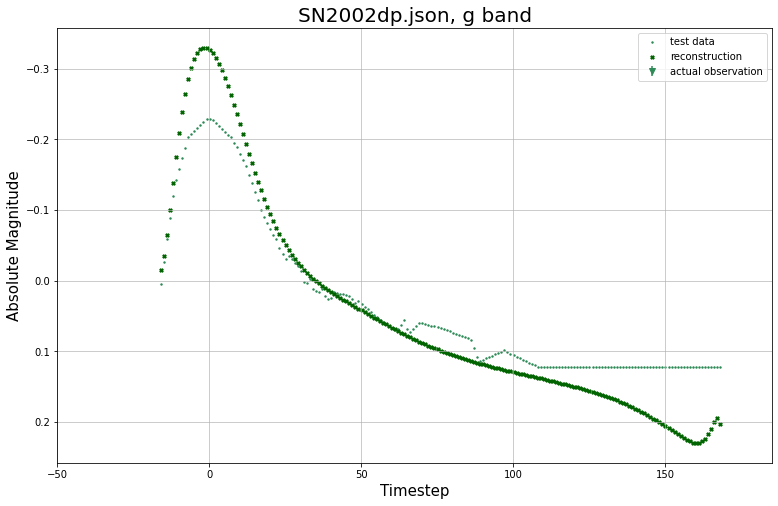

Ib


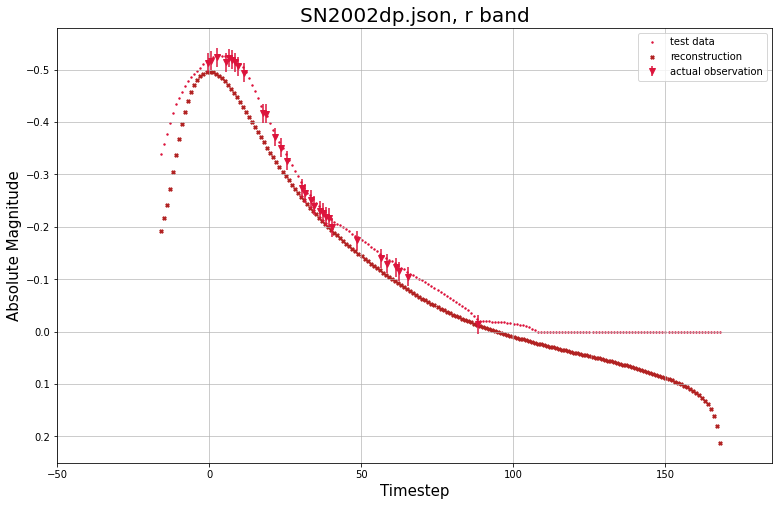

Ib


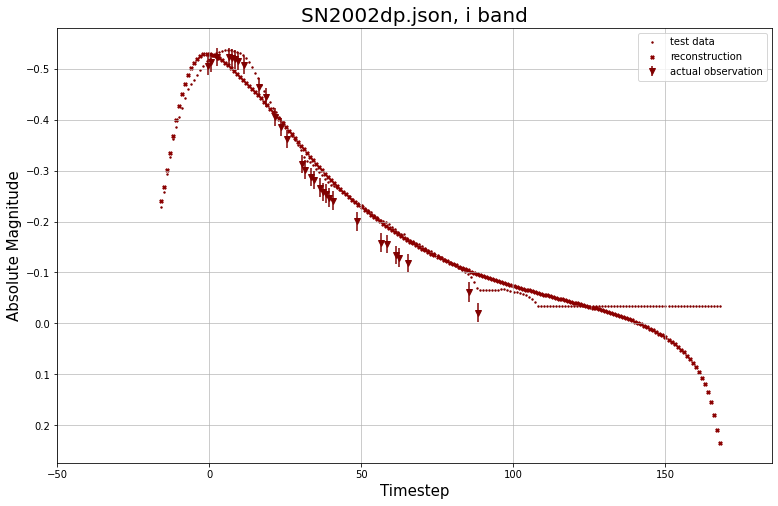

IIn


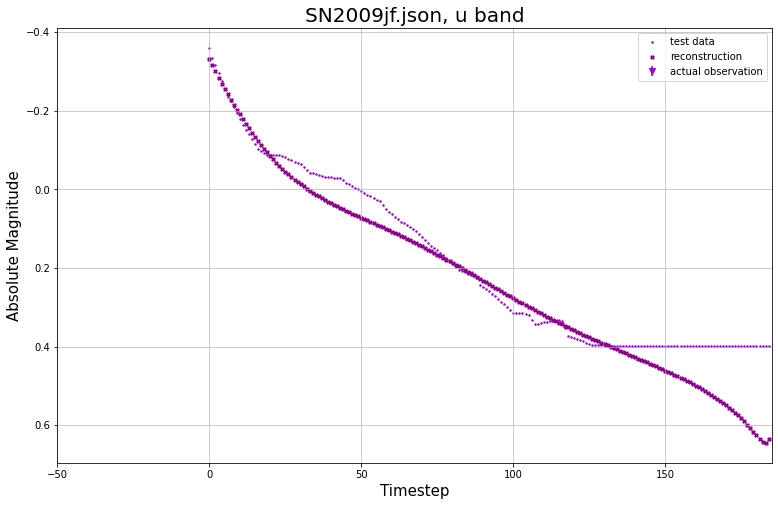

IIn


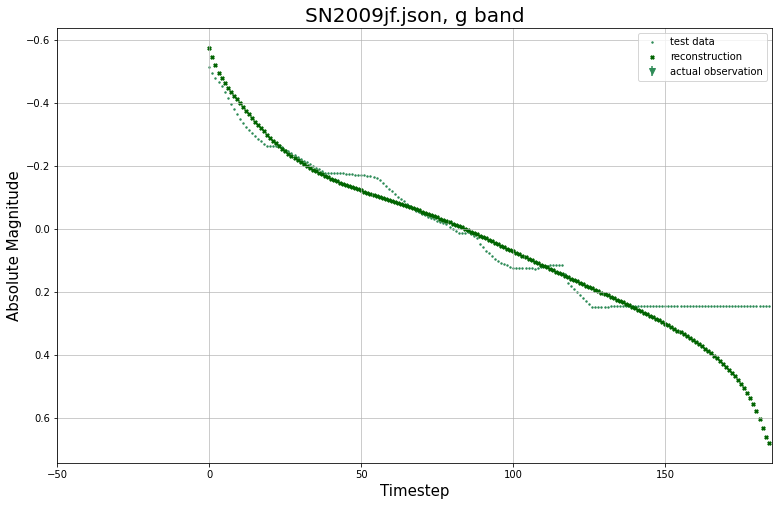

IIn


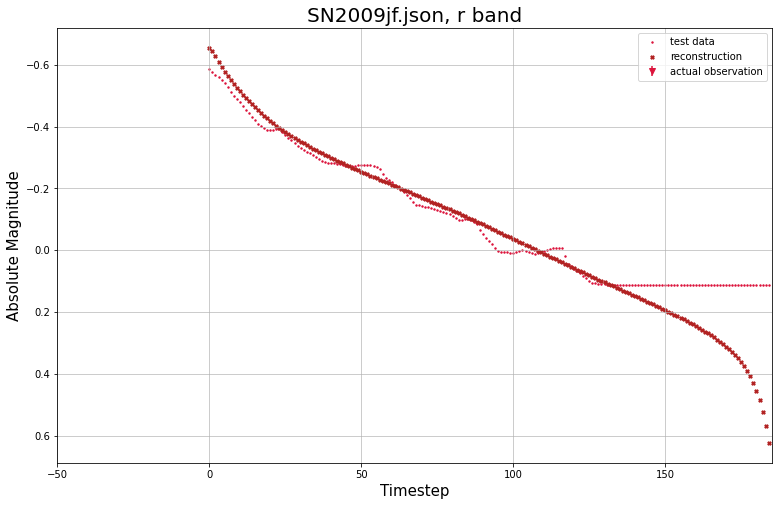

IIn


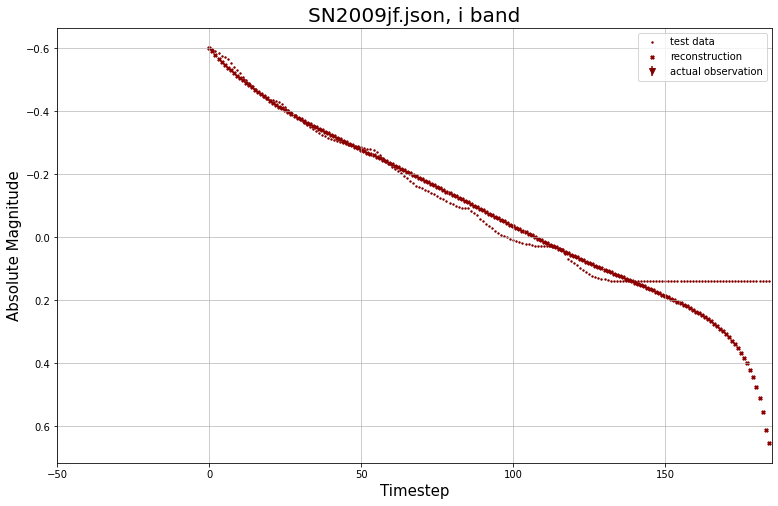

IIb


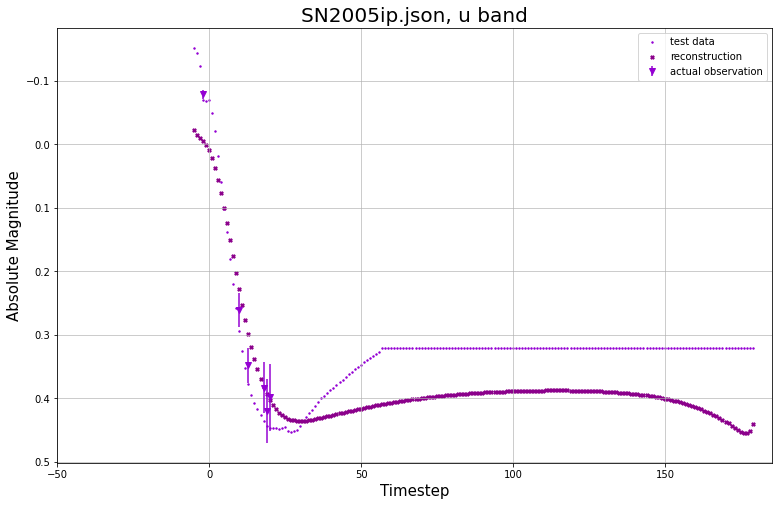

IIb


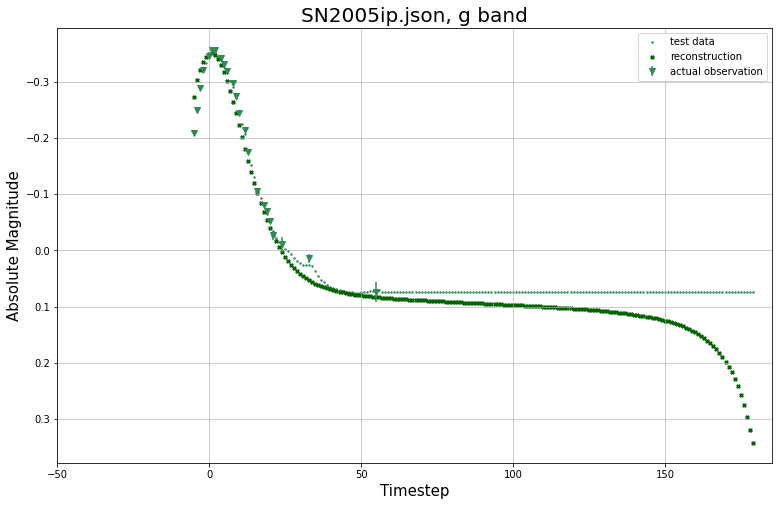

IIb


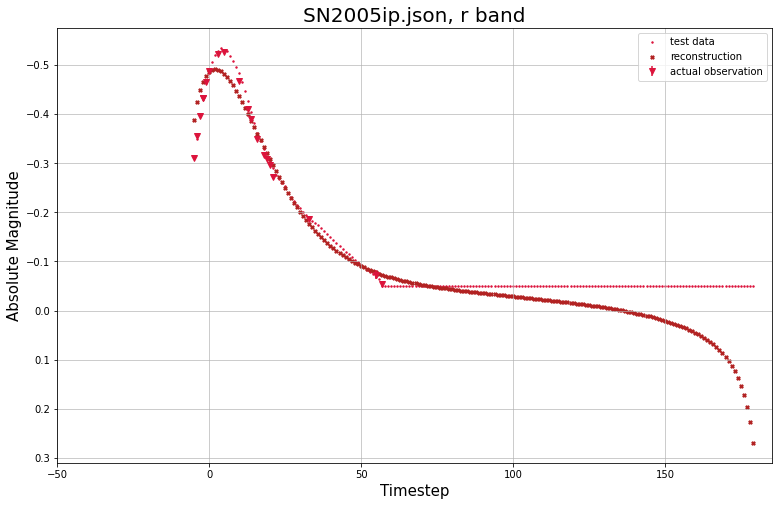

IIb


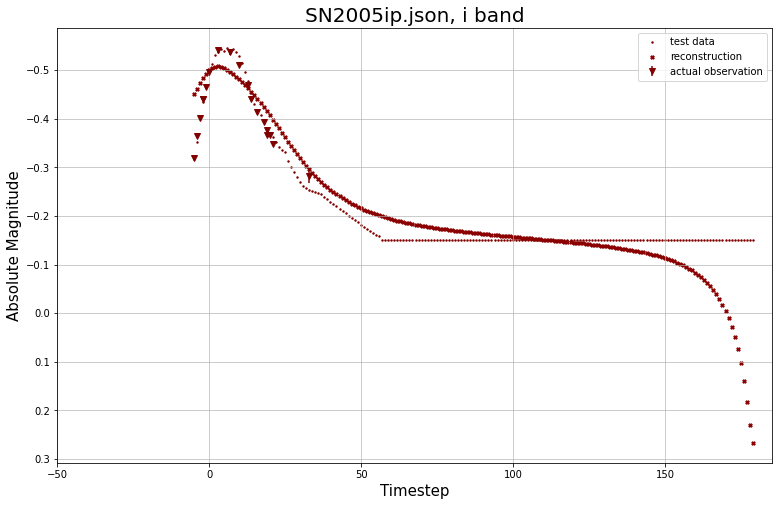

Ib


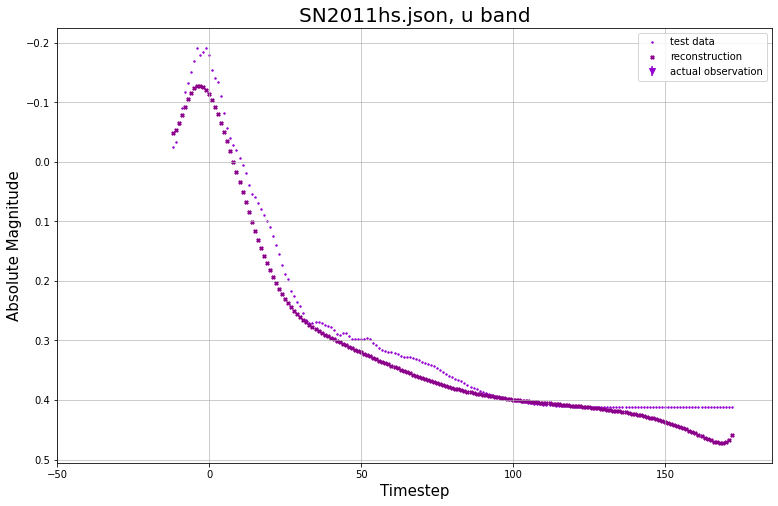

Ib


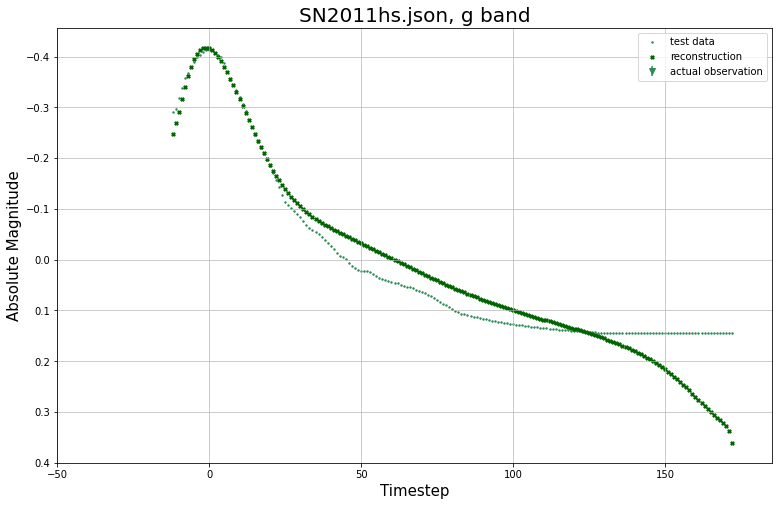

Ib


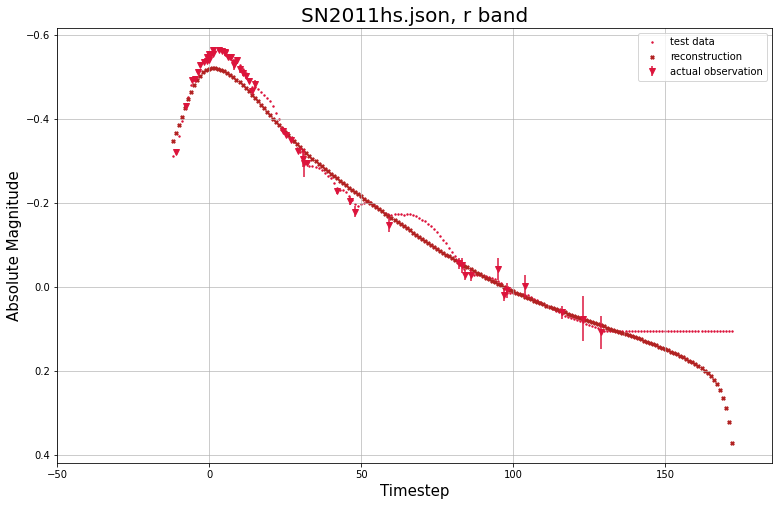

Ib


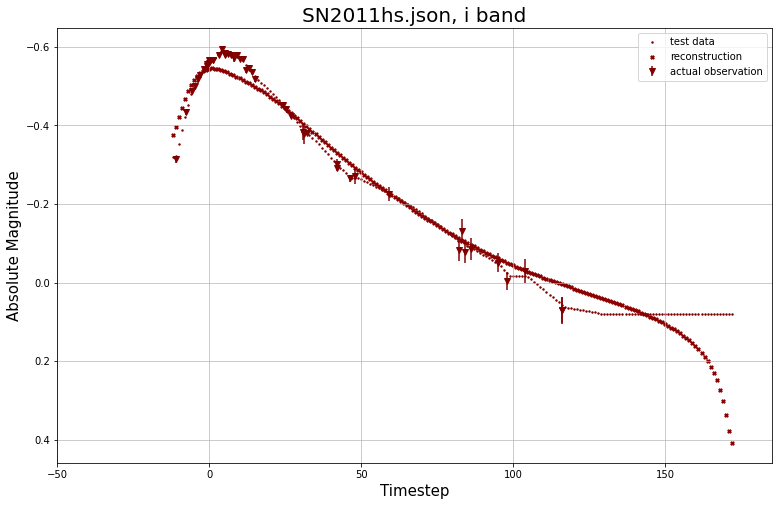

II


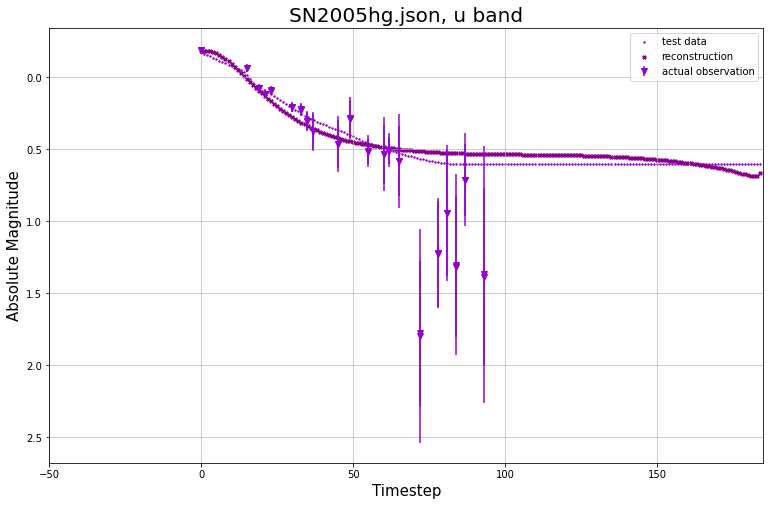

II


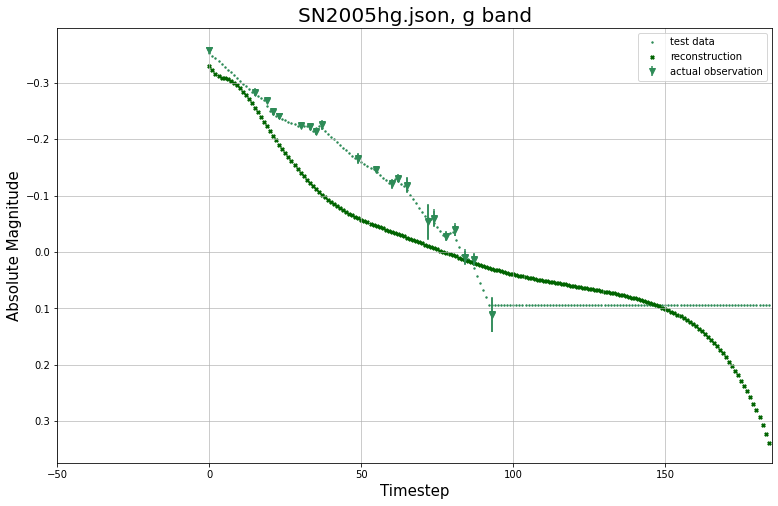

II


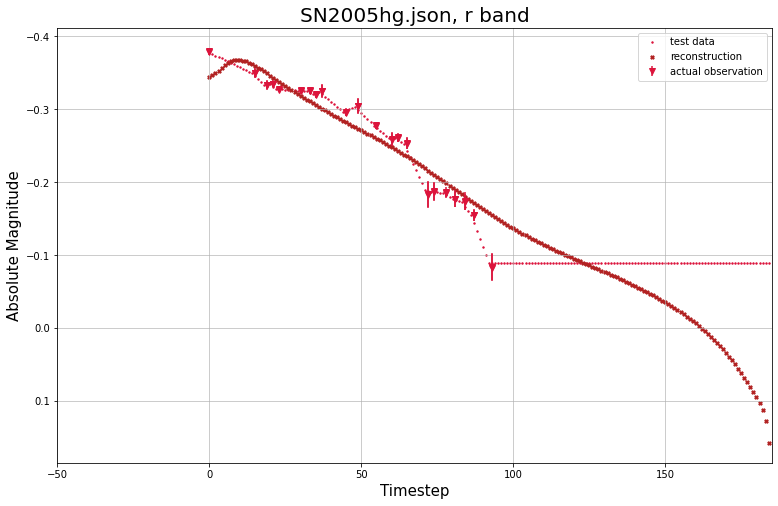

II


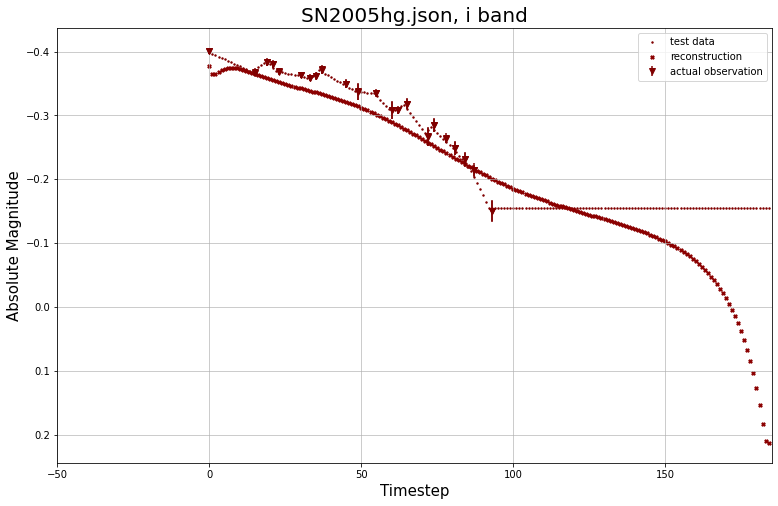

Ia


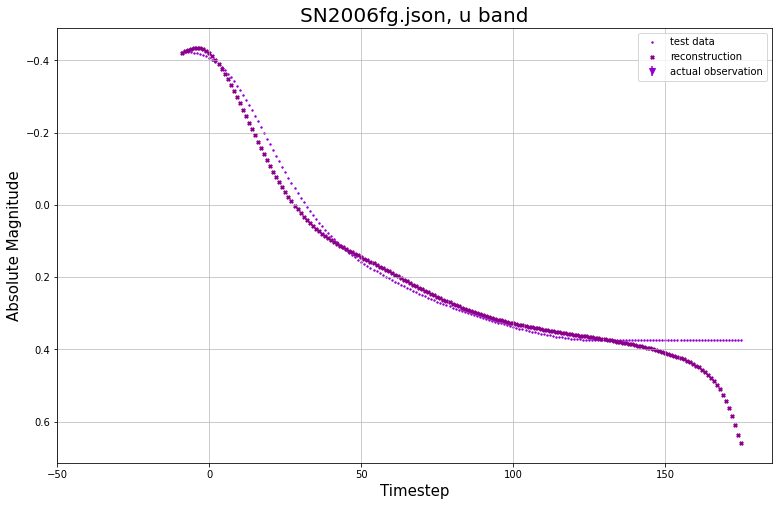

Ia


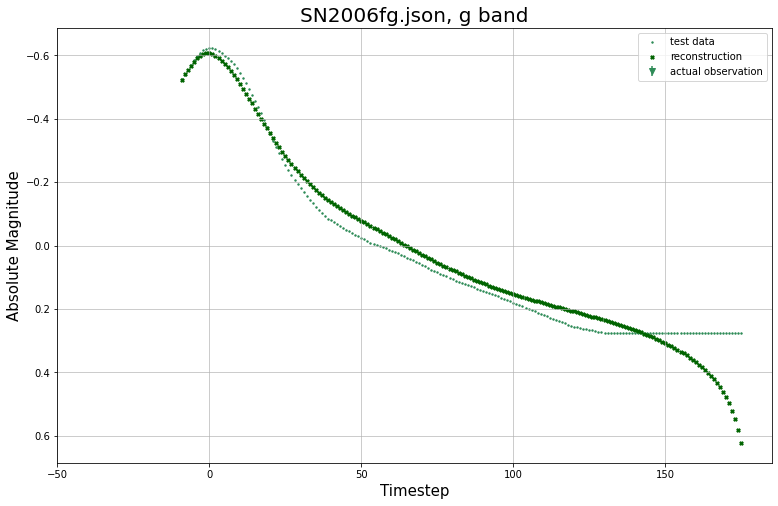

Ia


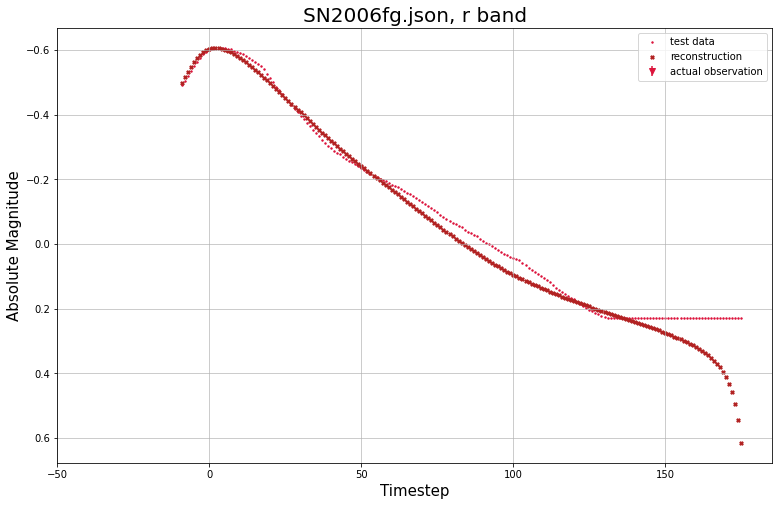

Ia


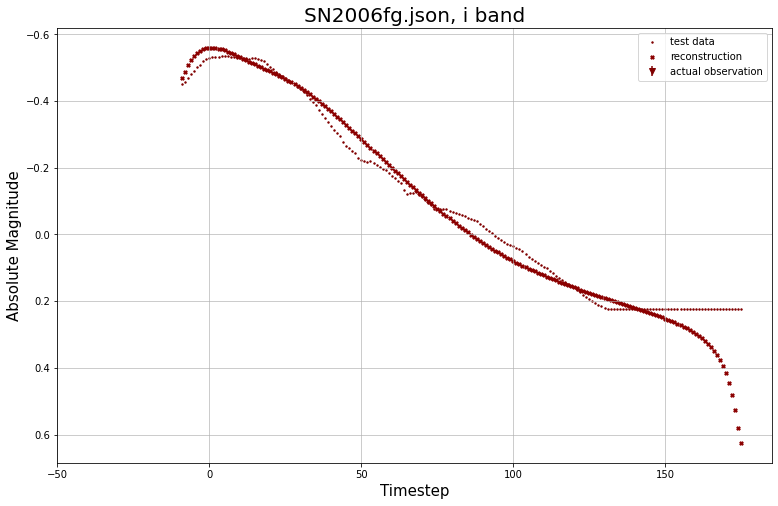

Ia


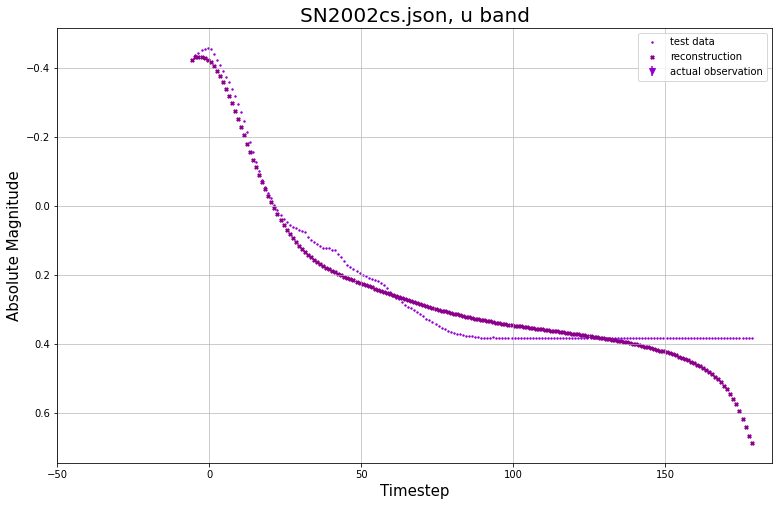

Ia


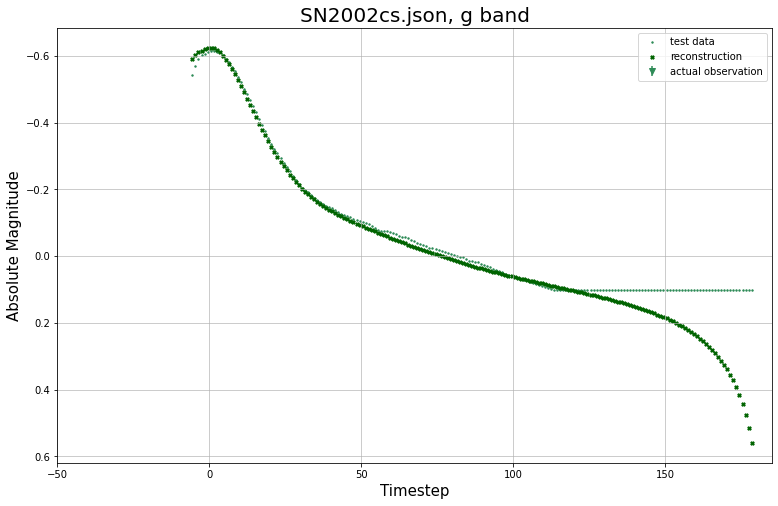

Ia


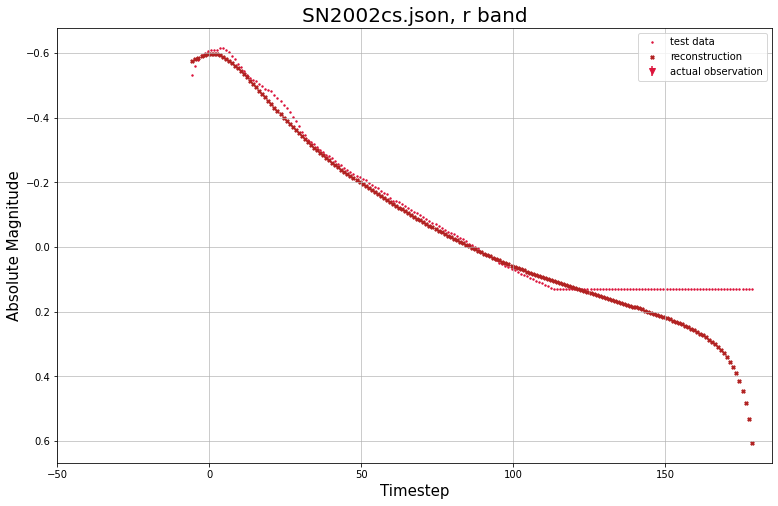

Ia


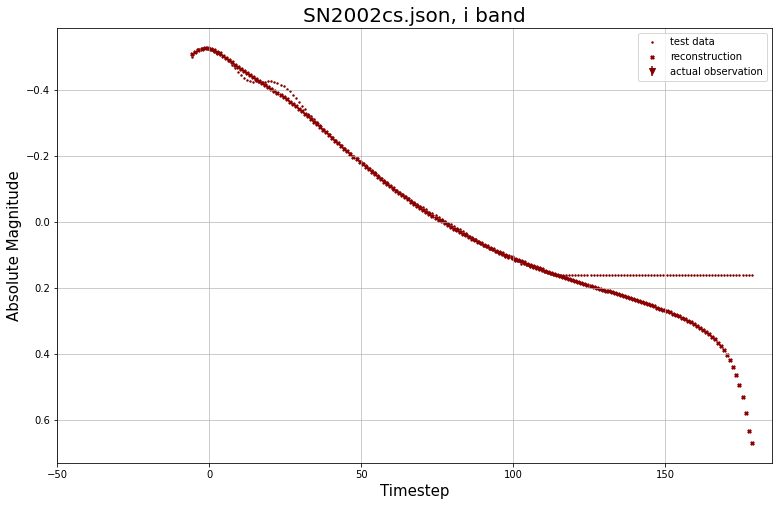

Ia


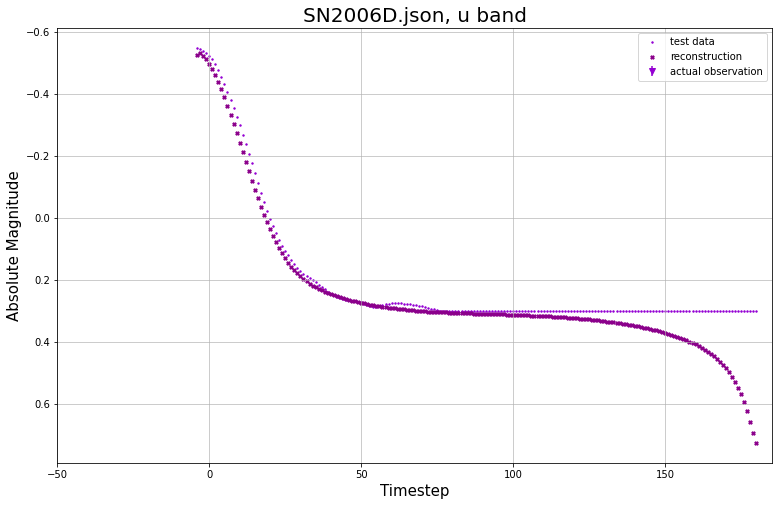

Ia


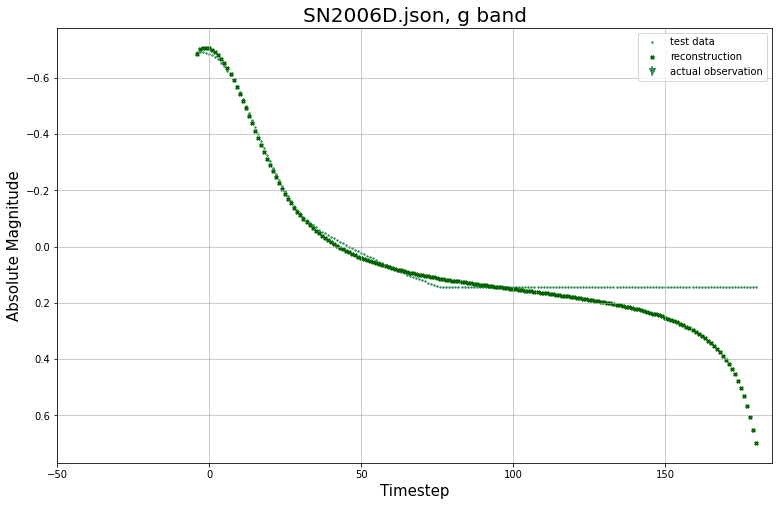

Ia


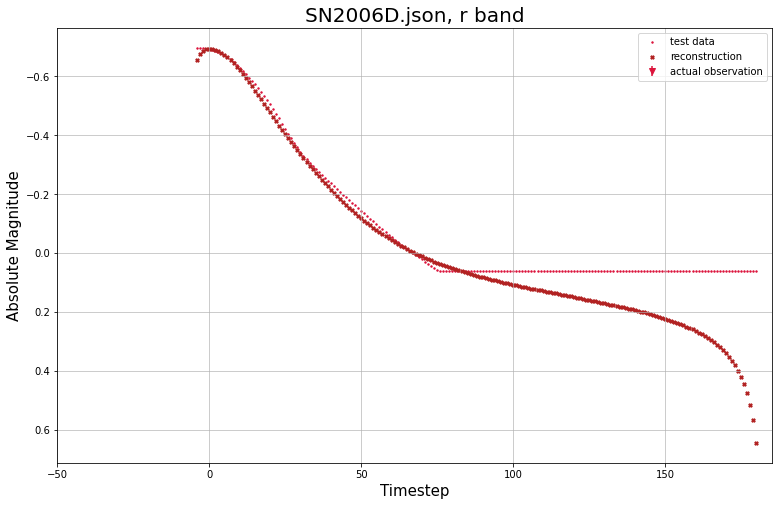

Ia


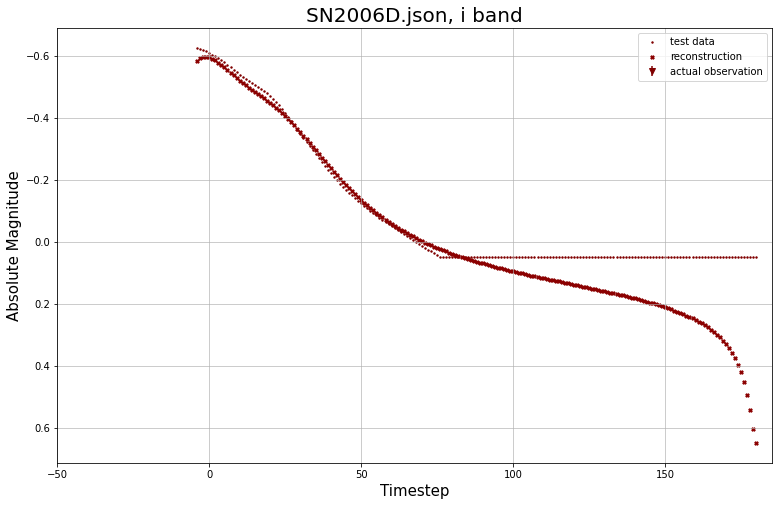

Ia


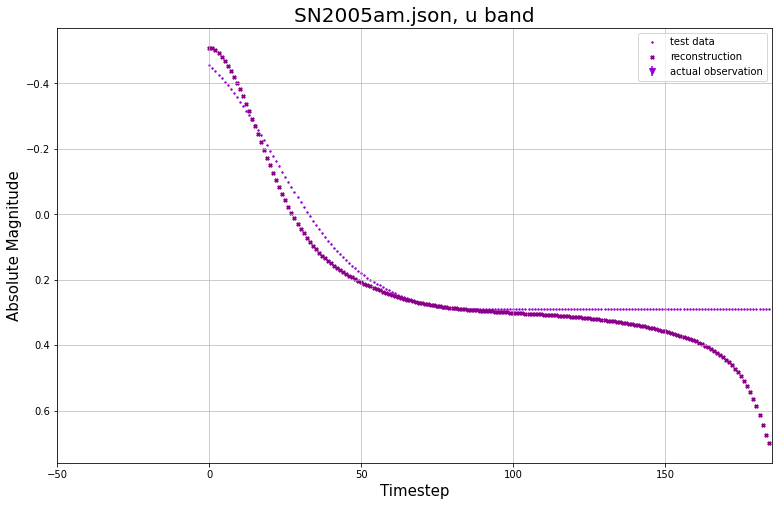

Ia


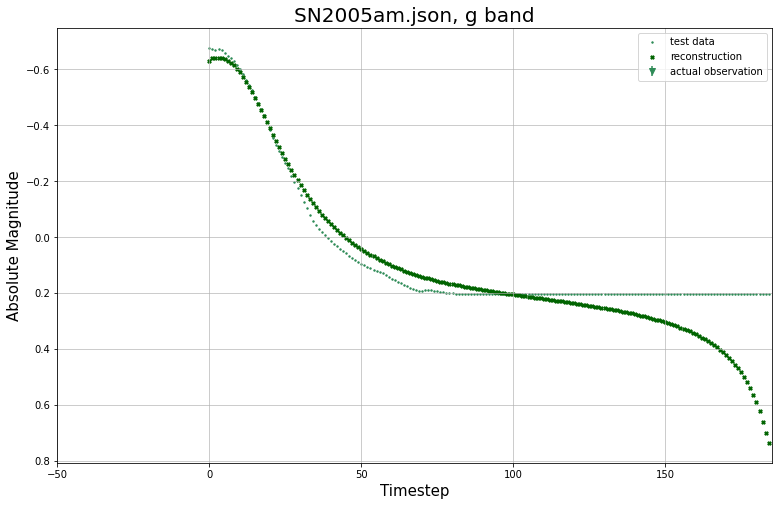

Ia


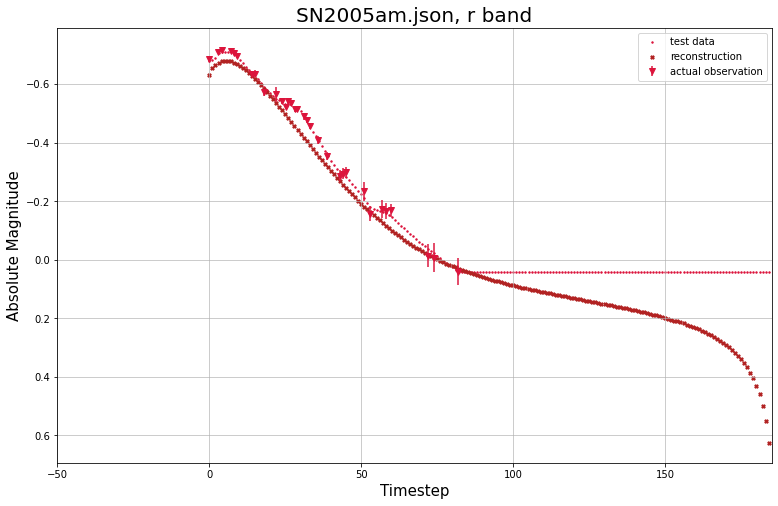

Ia


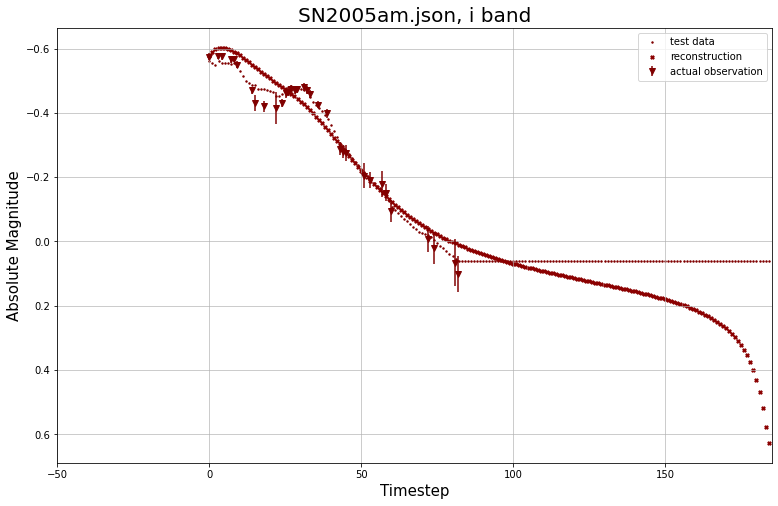

.IaPec


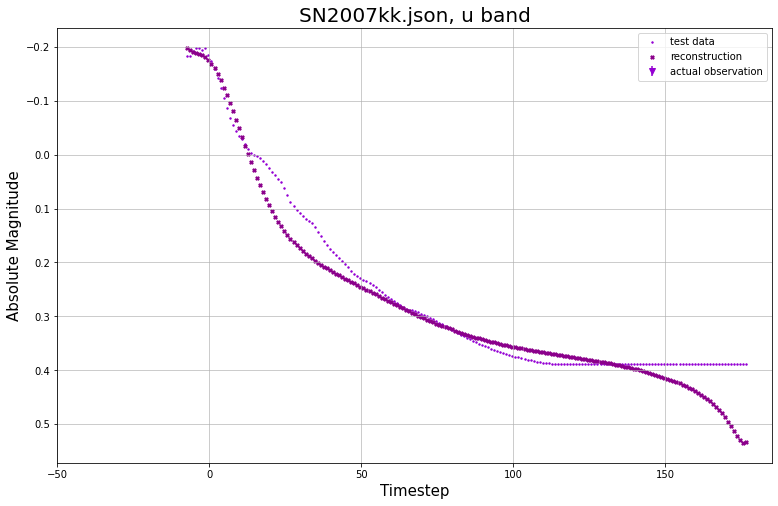

.IaPec


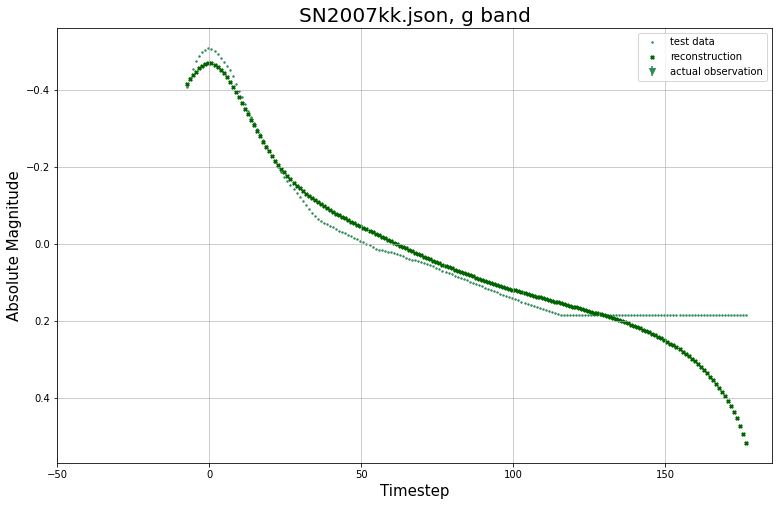

.IaPec


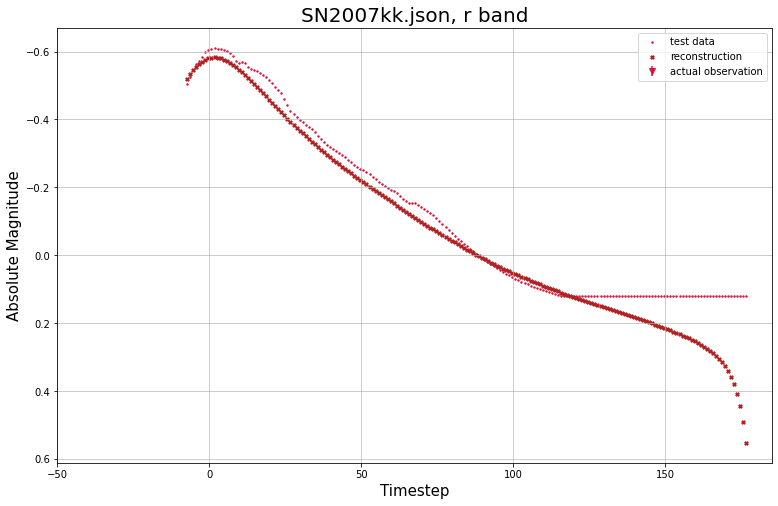

.IaPec


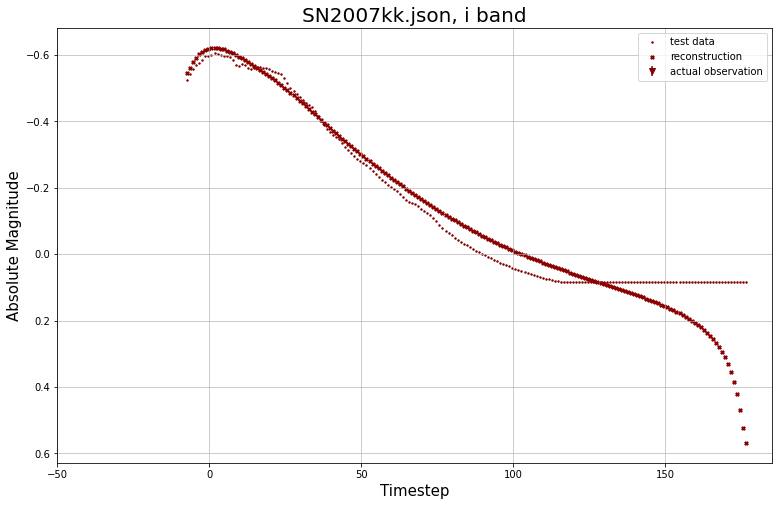

Ia


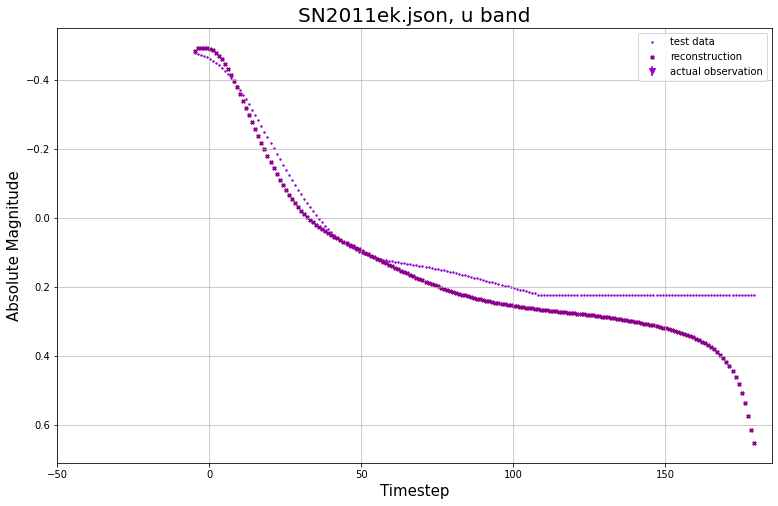

Ia


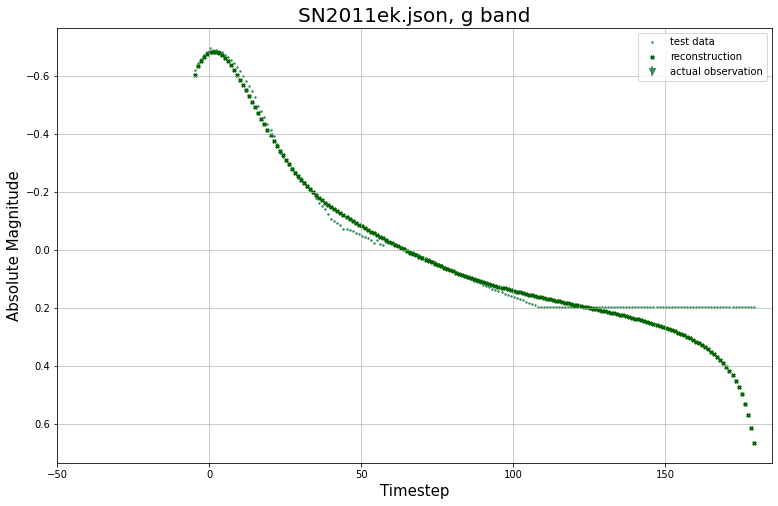

Ia


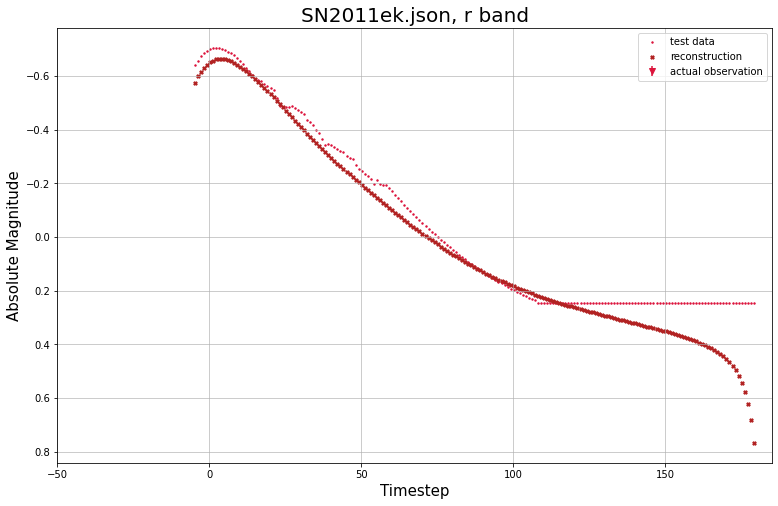

Ia


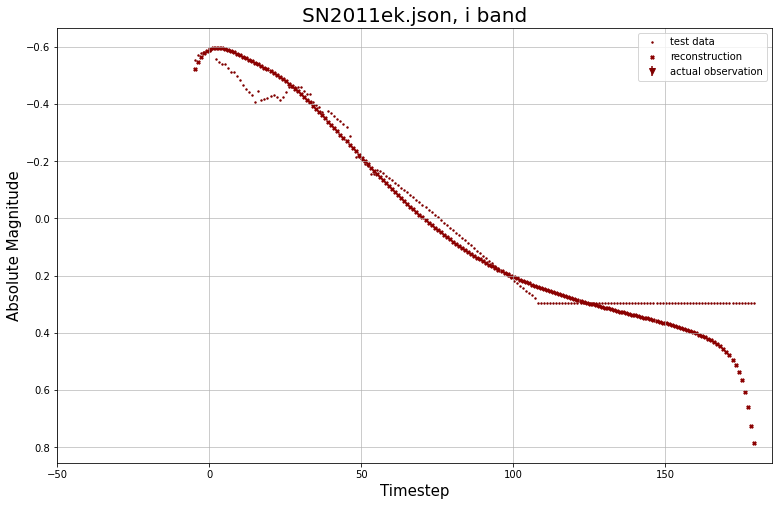

Ia


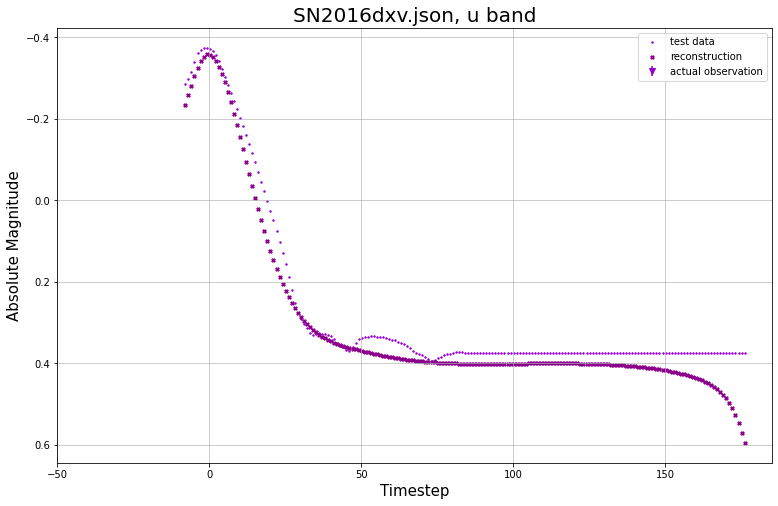

Ia


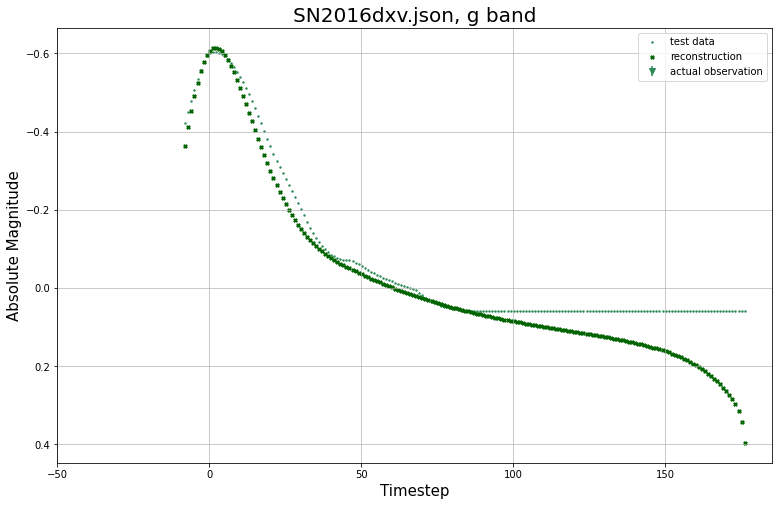

Ia


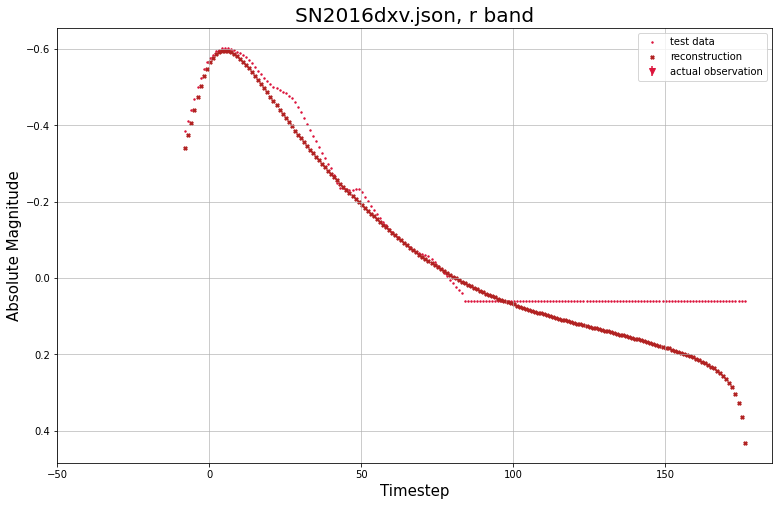

Ia


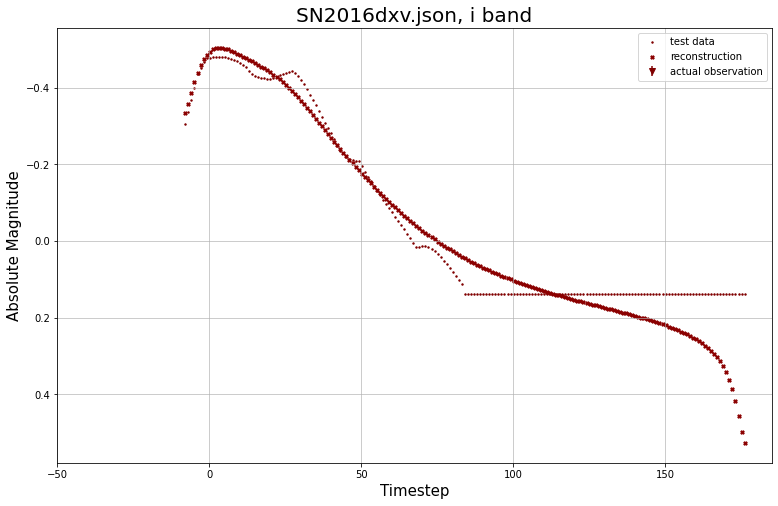

Ia


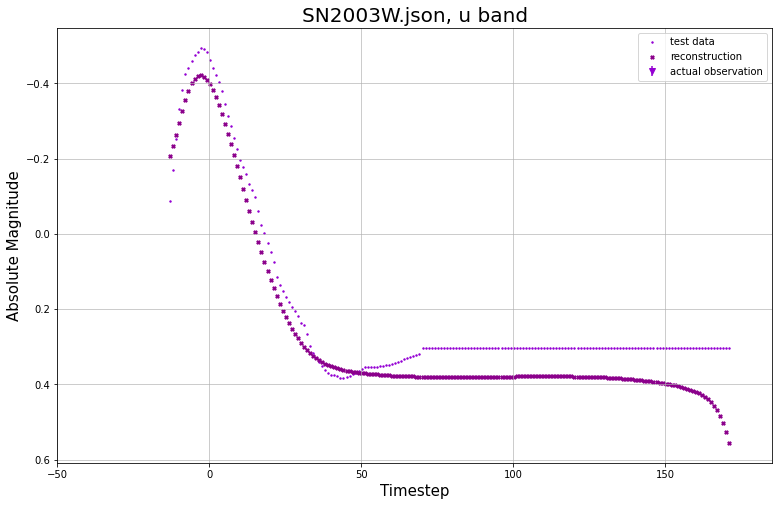

Ia


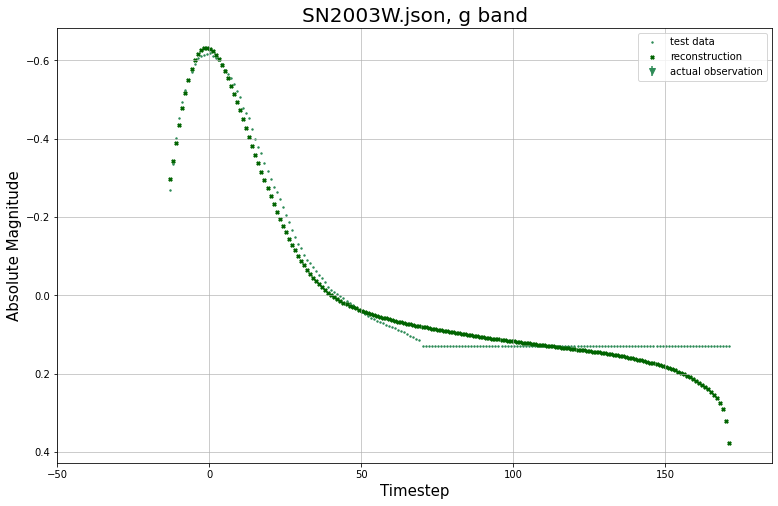

Ia


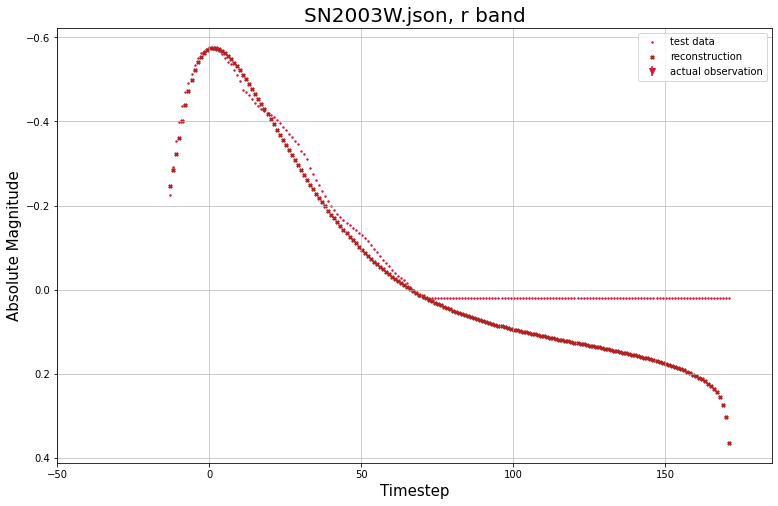

Ia


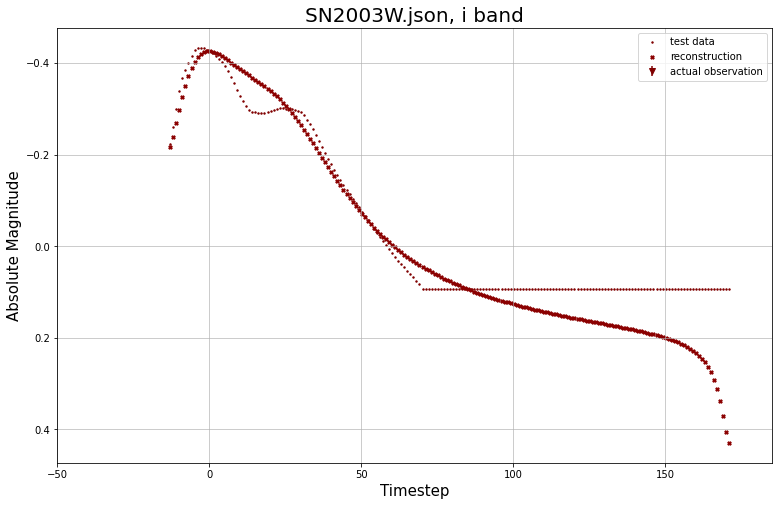

II


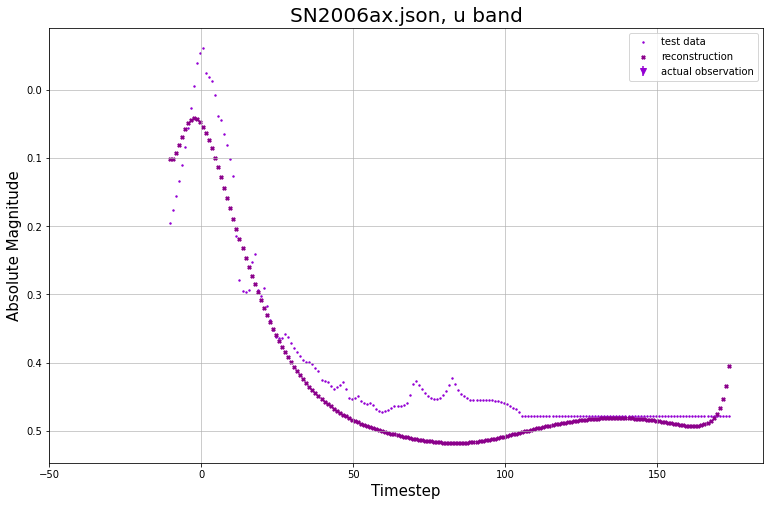

II


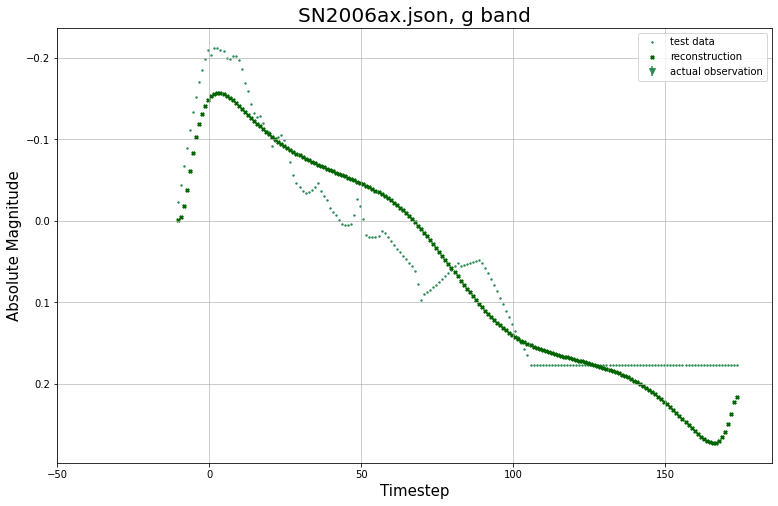

II


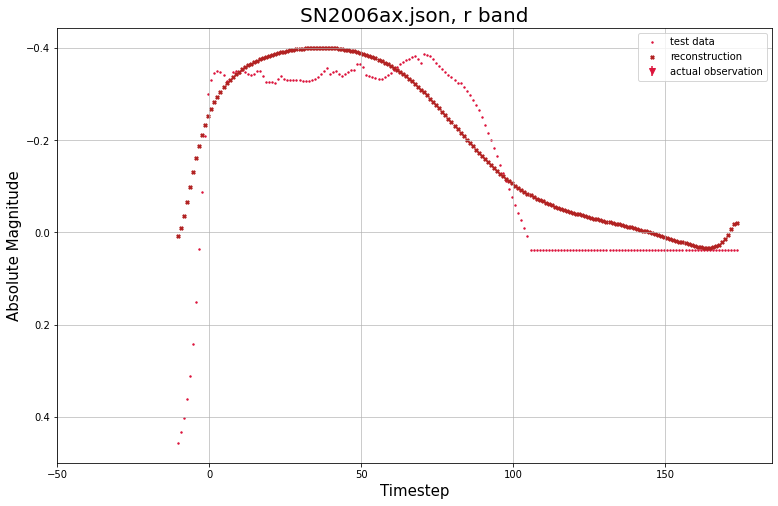

II


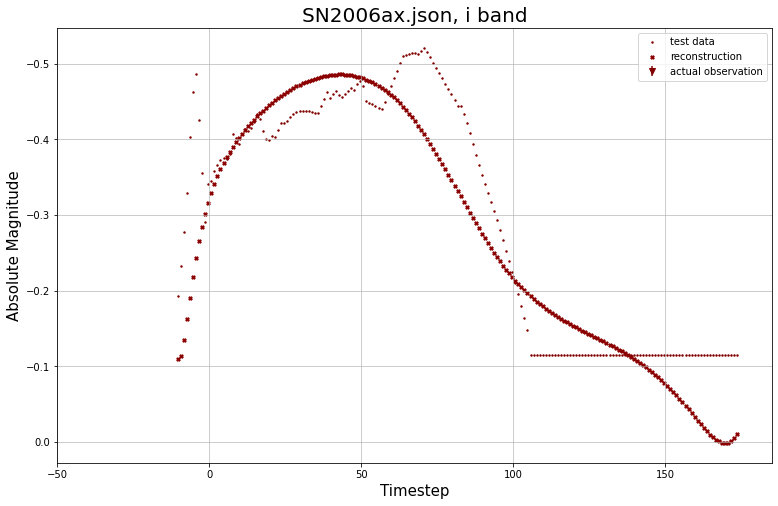

Ia


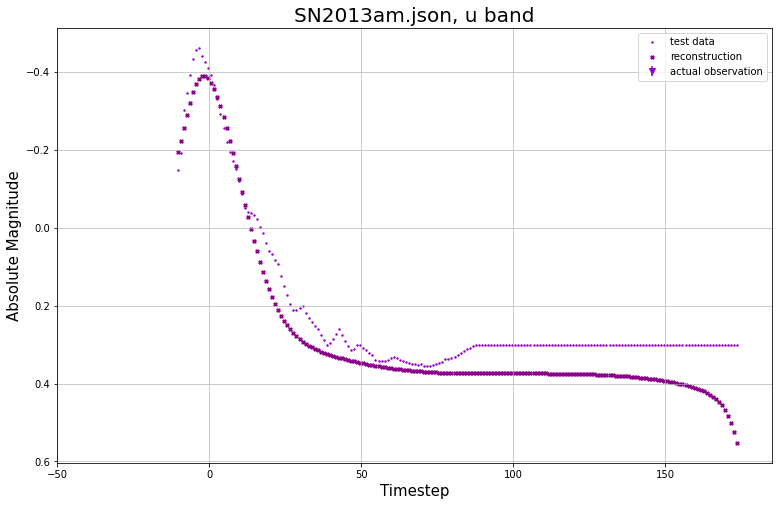

Ia


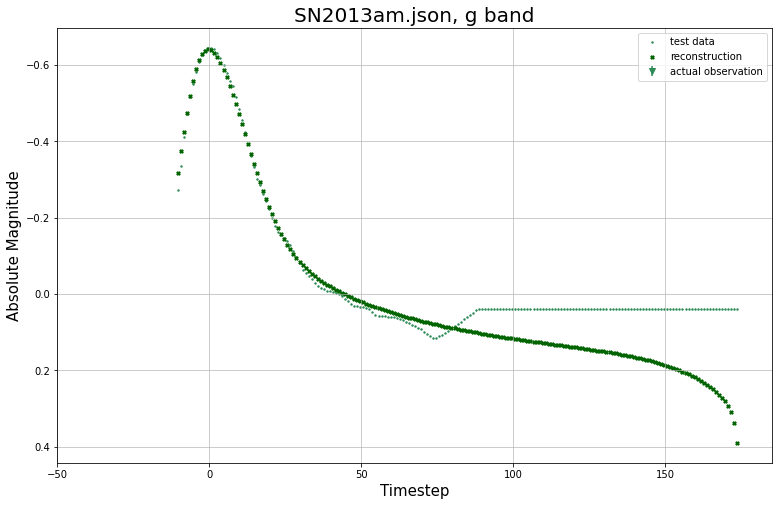

Ia


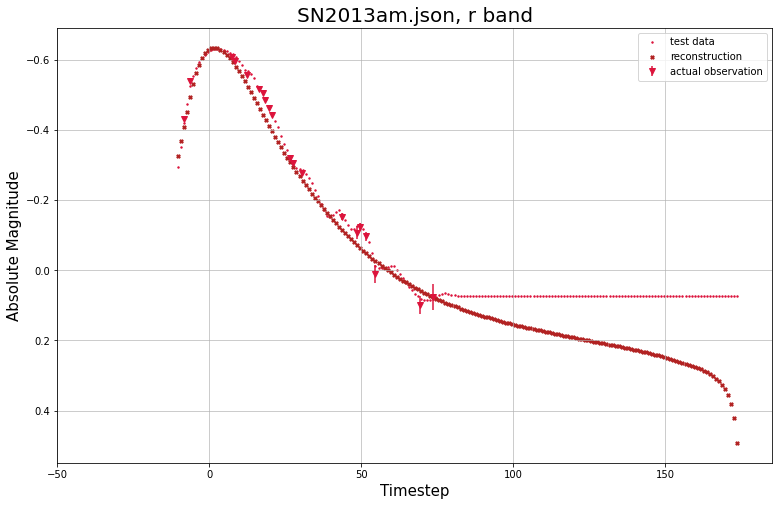

Ia


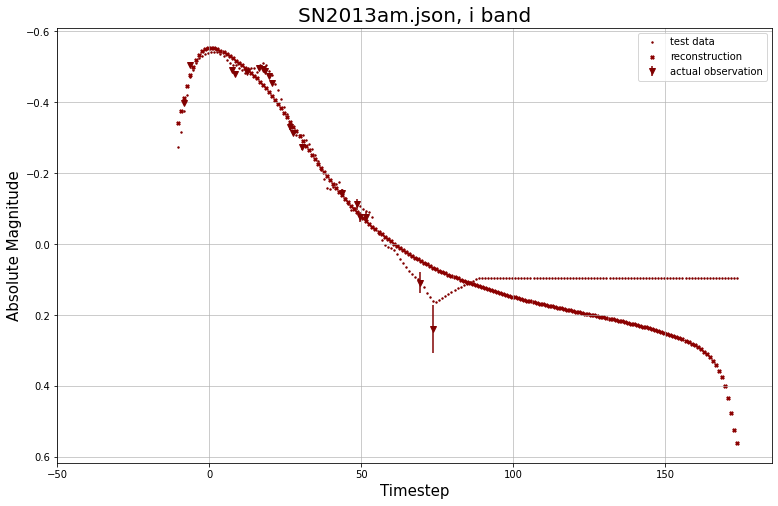

Ia


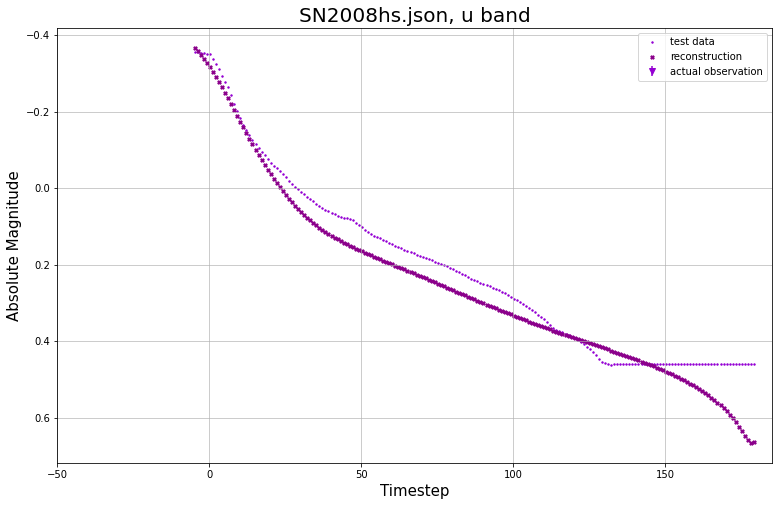

Ia


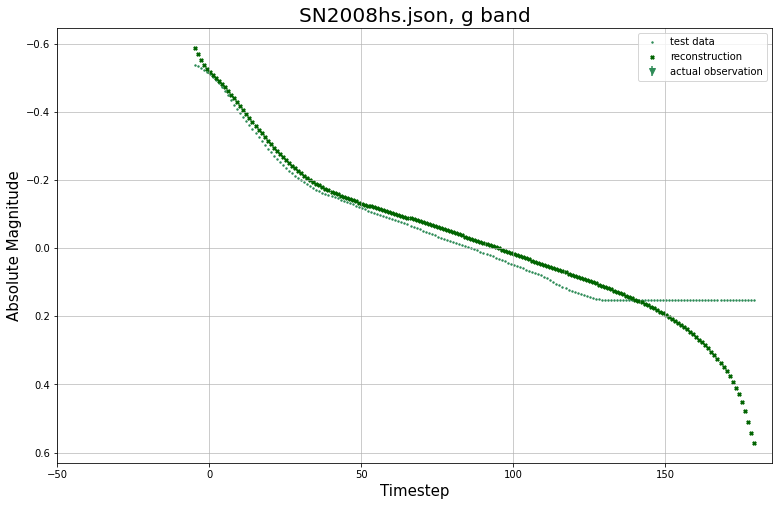

Ia


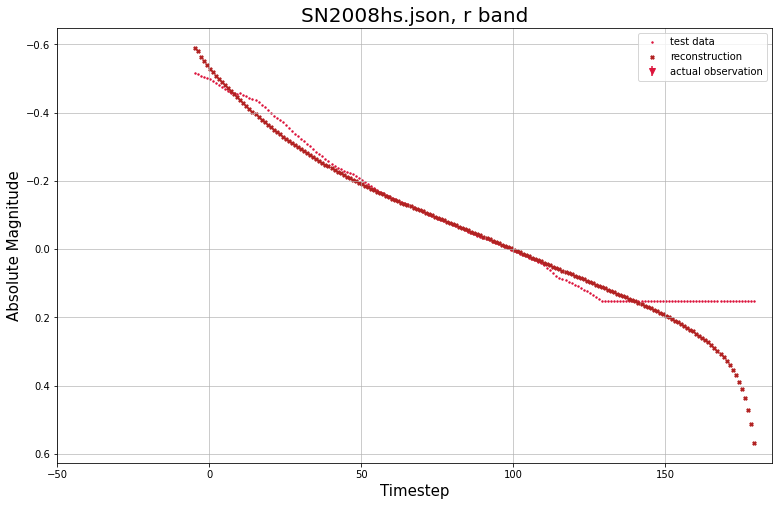

Ia


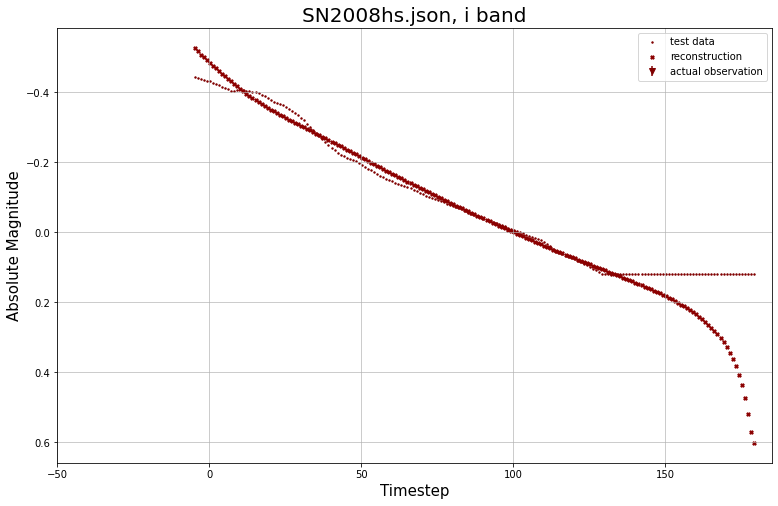

II


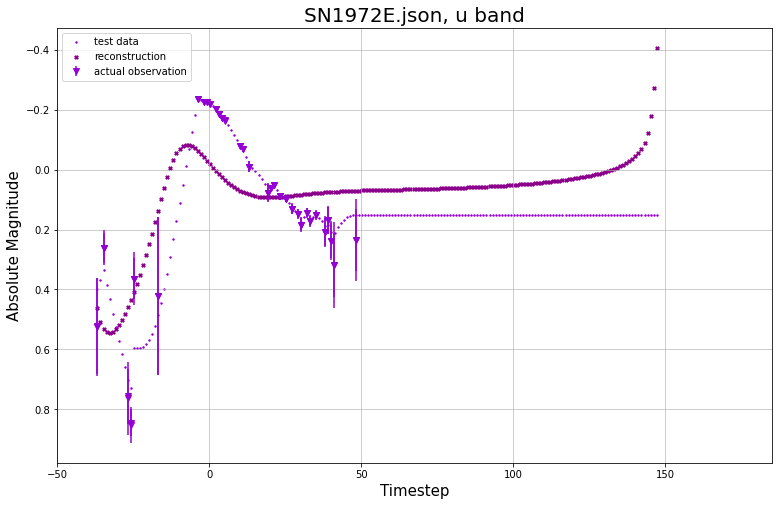

II


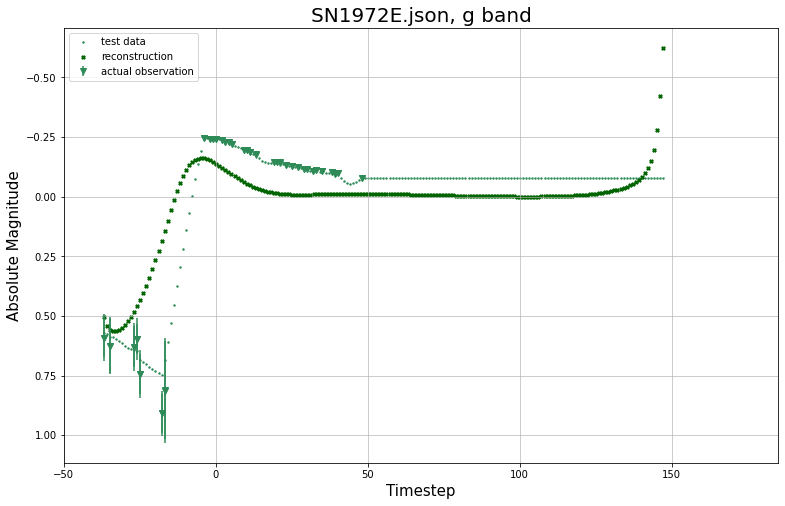

II


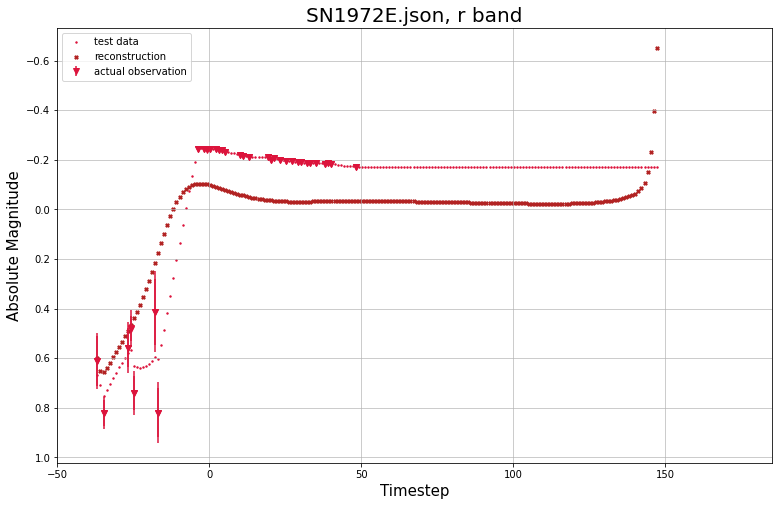

II


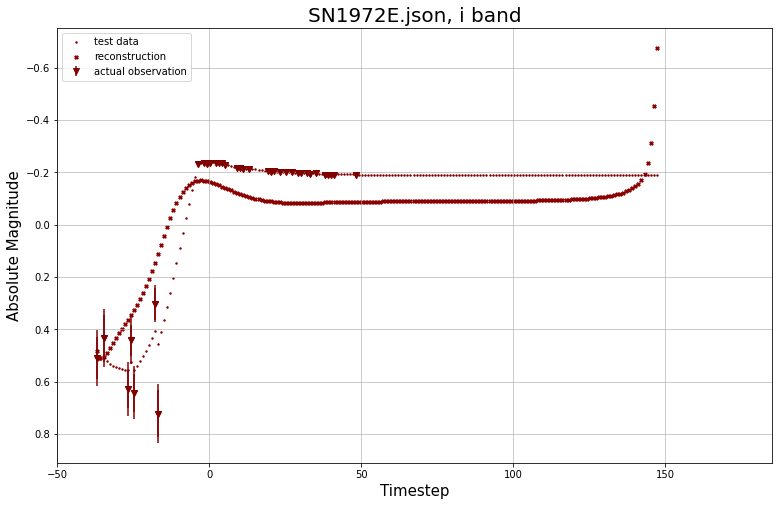

II P Pec


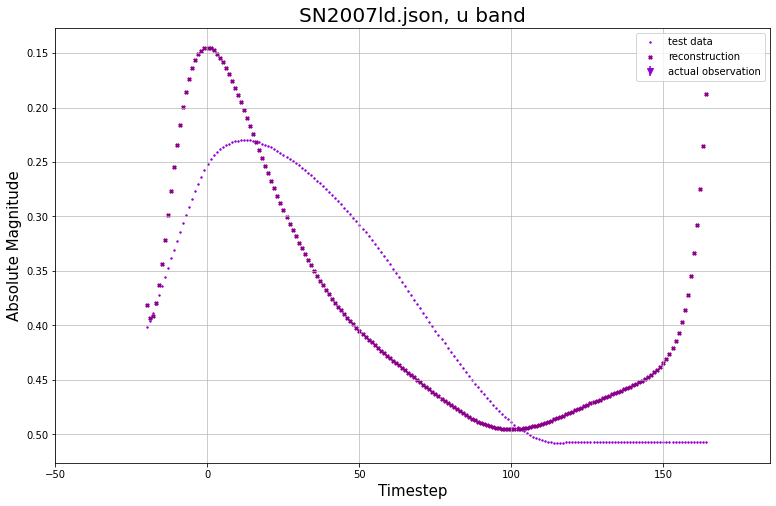

II P Pec


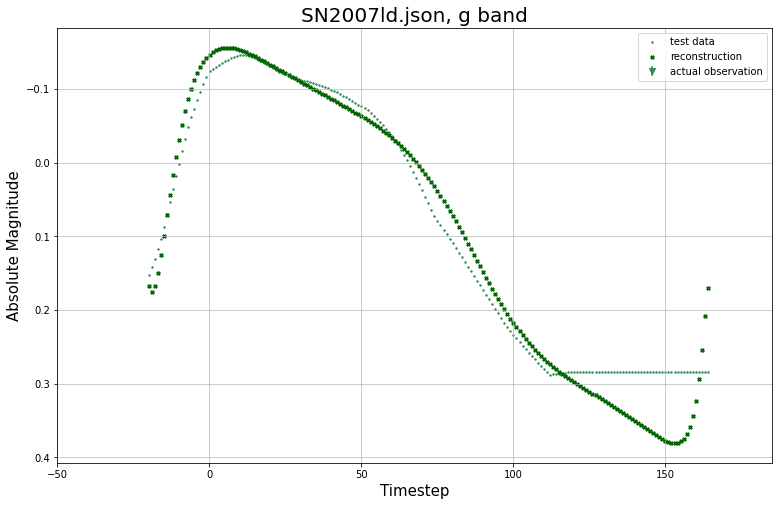

II P Pec


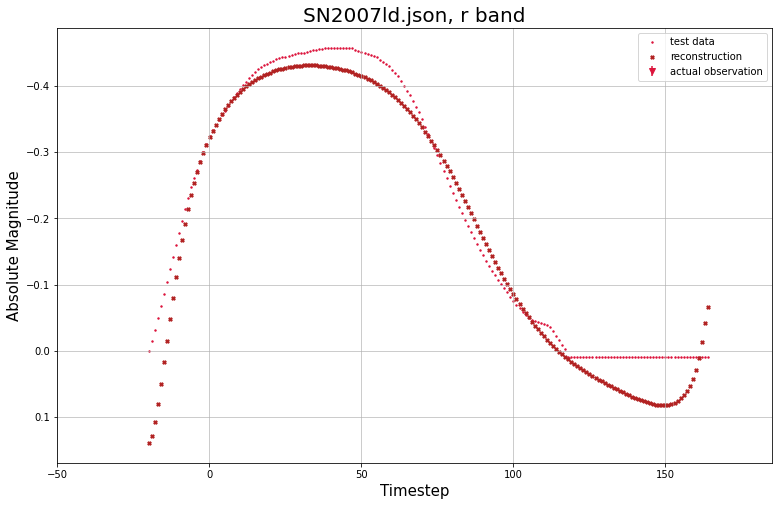

II P Pec


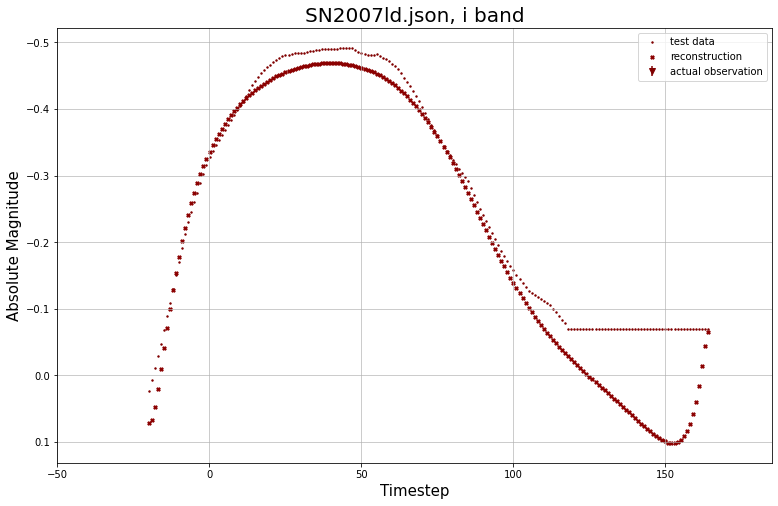

Ia


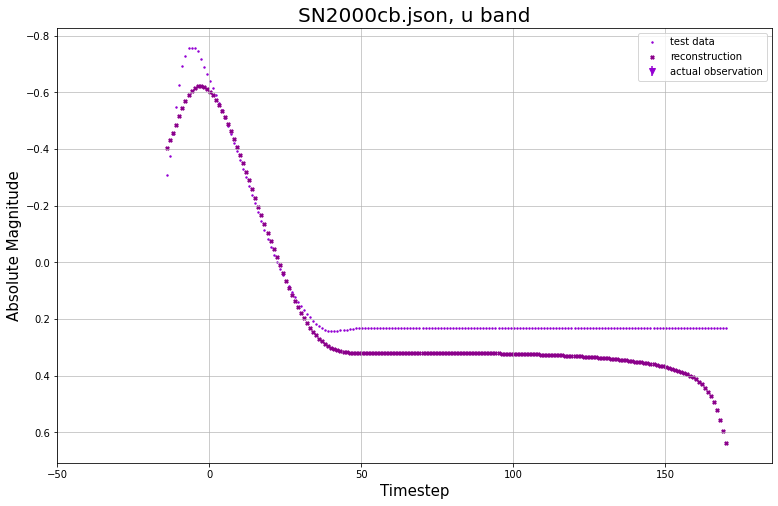

Ia


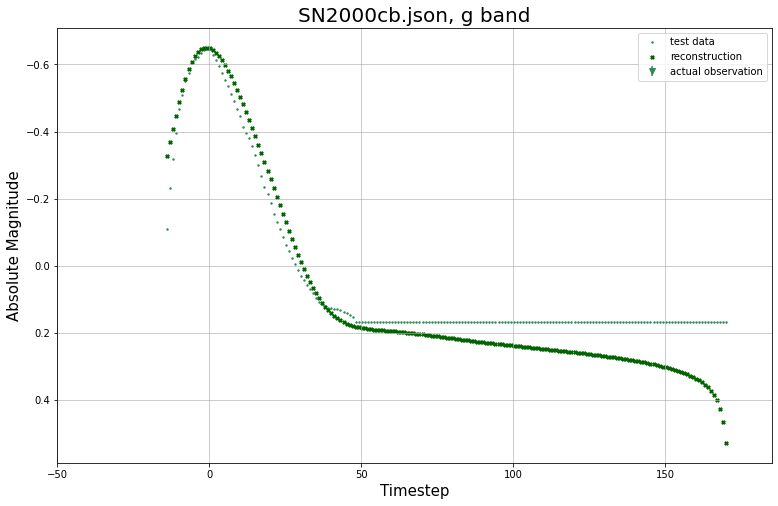

Ia


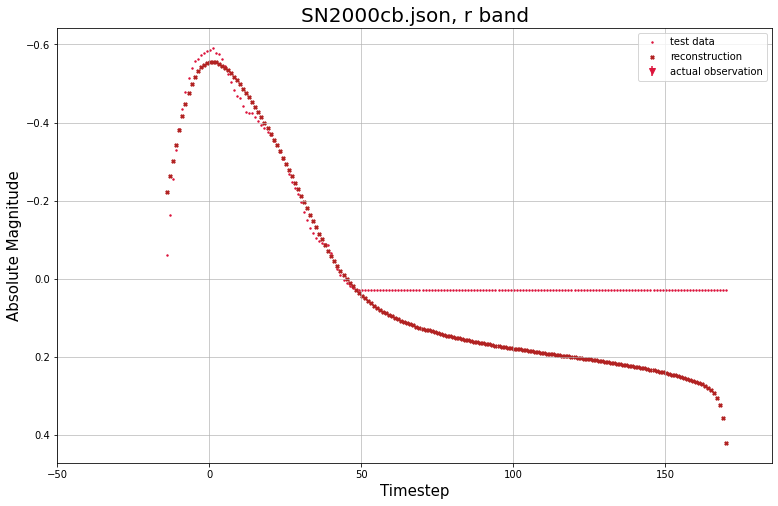

Ia


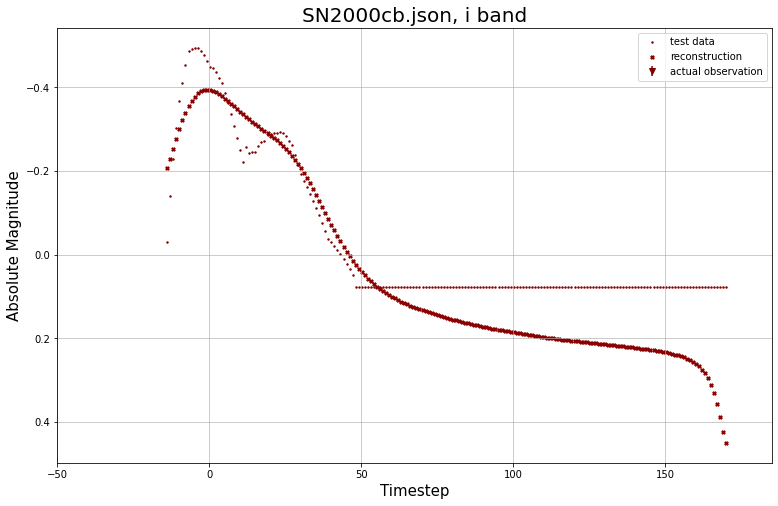

Ia


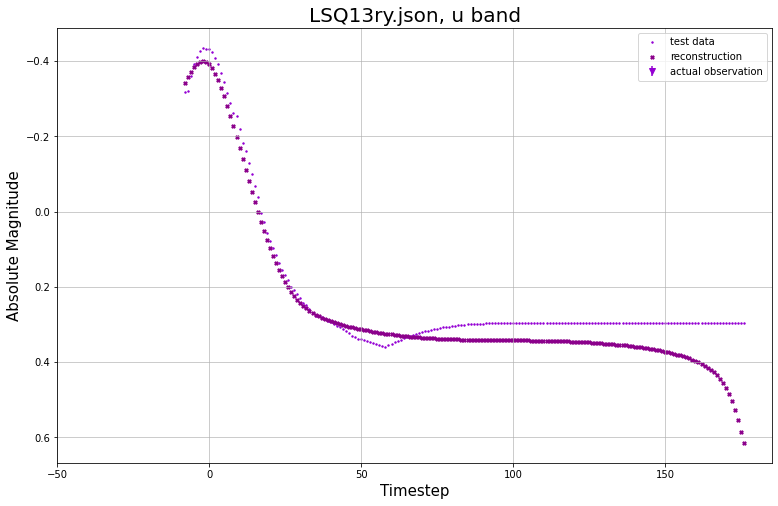

Ia


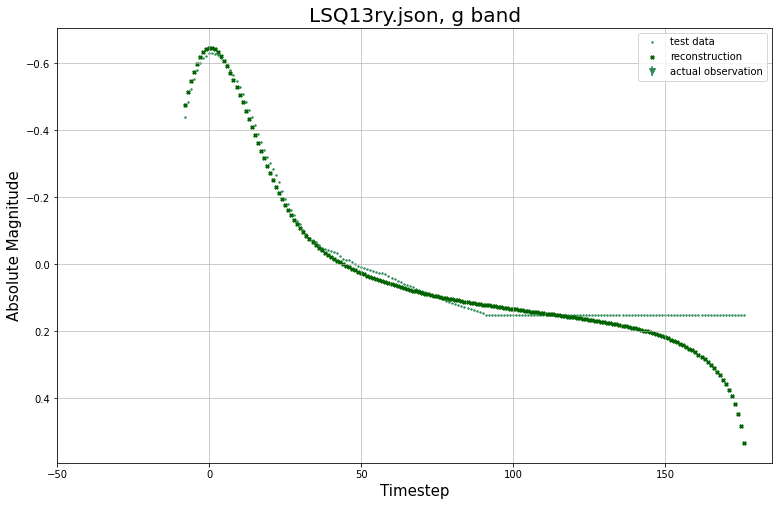

Ia


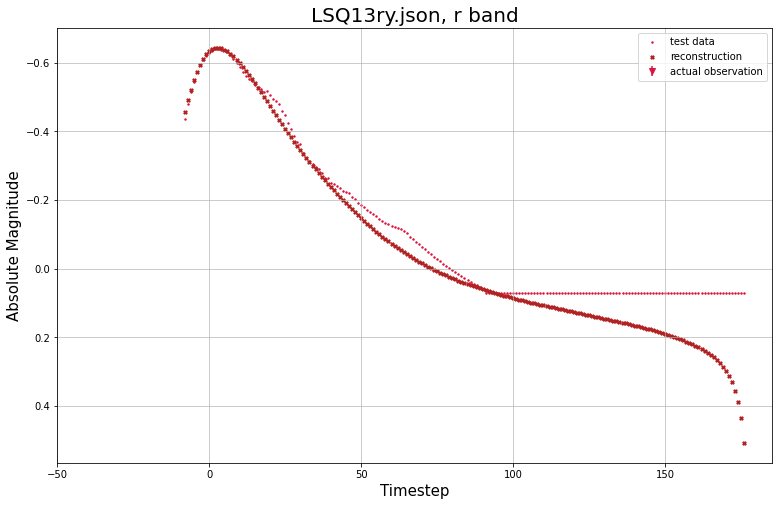

Ia


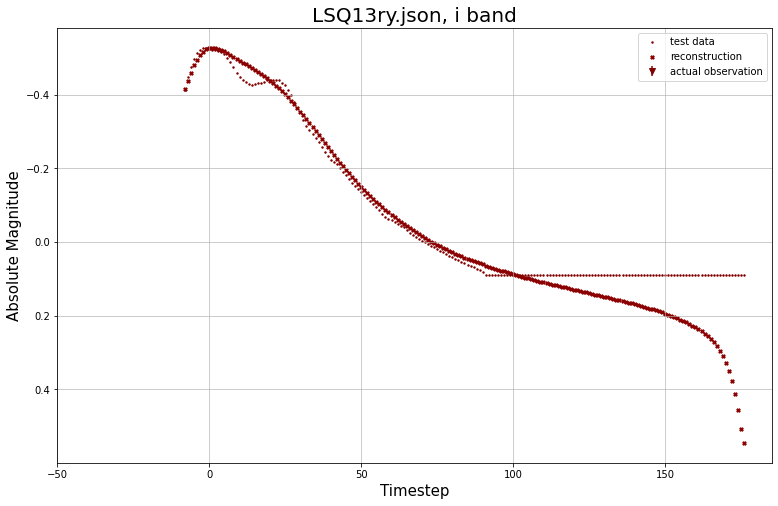

Ia


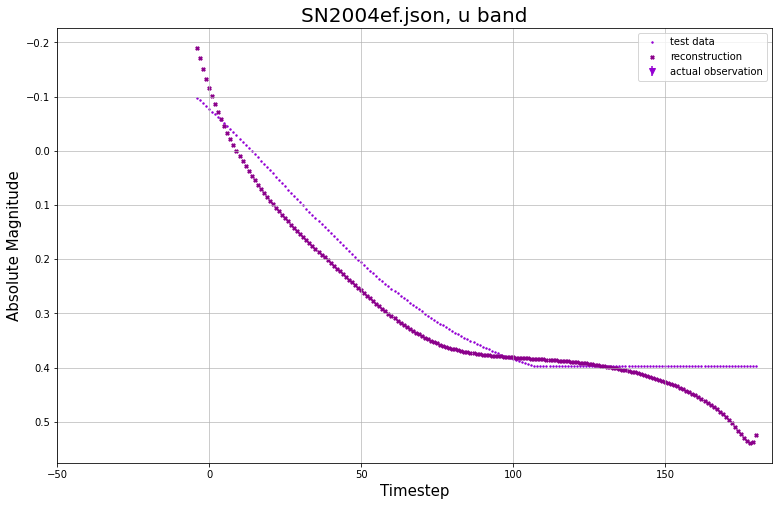

Ia


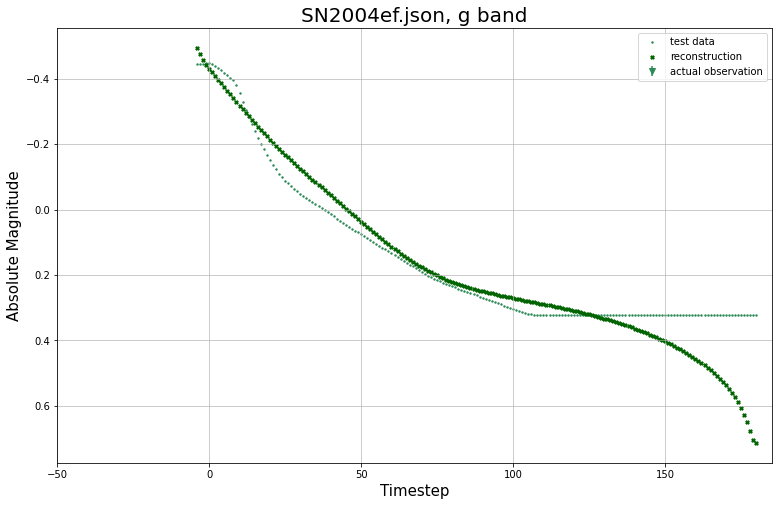

Ia


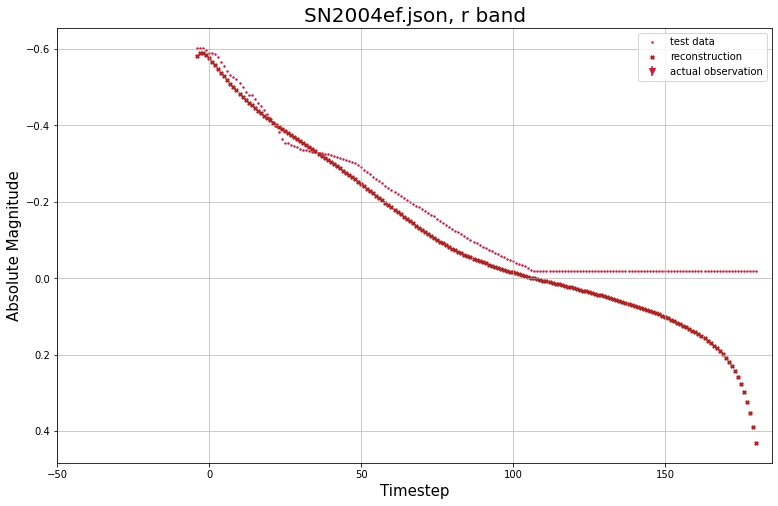

Ia


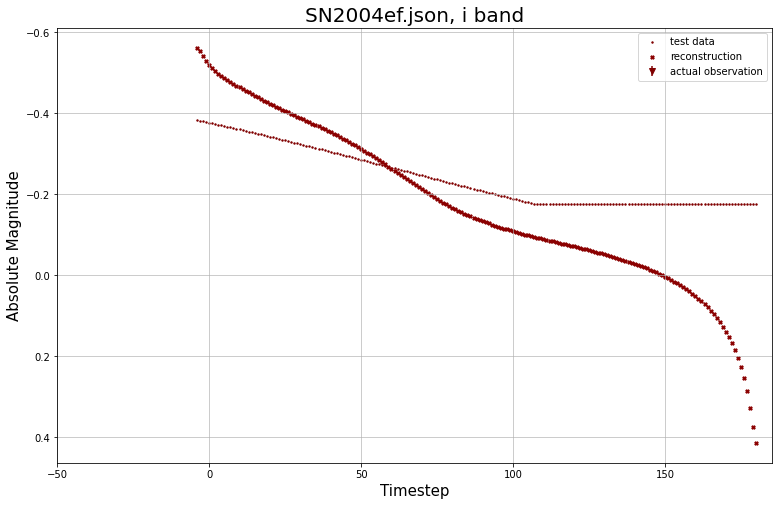

Ia


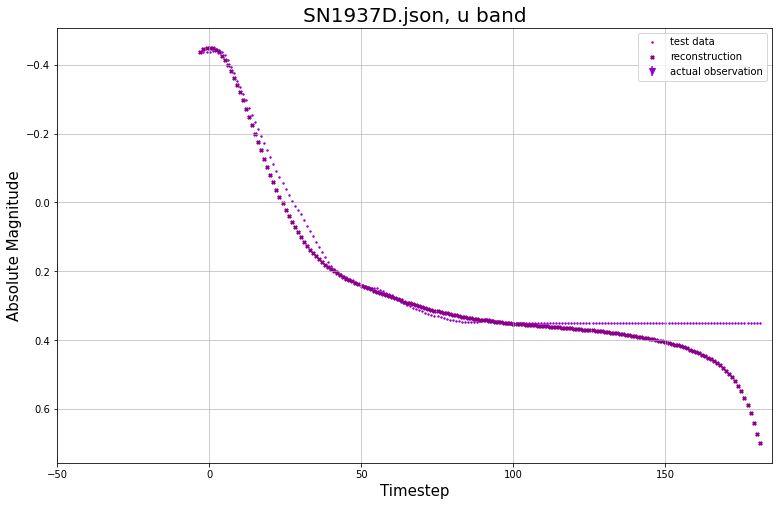

Ia


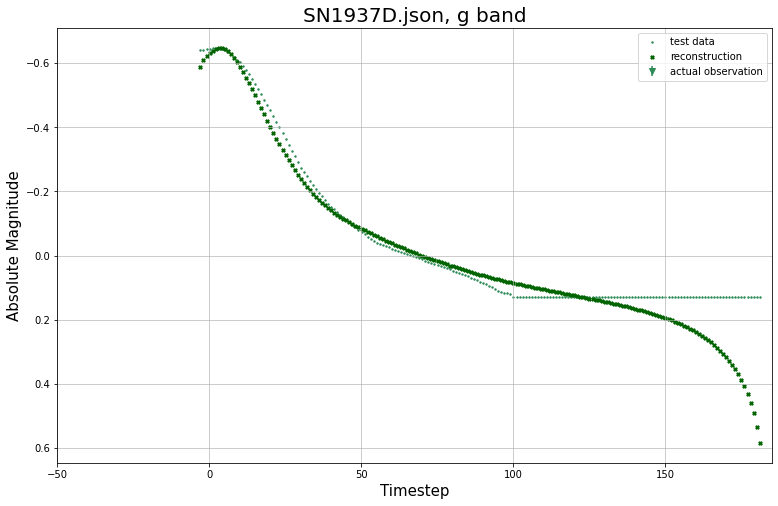

Ia


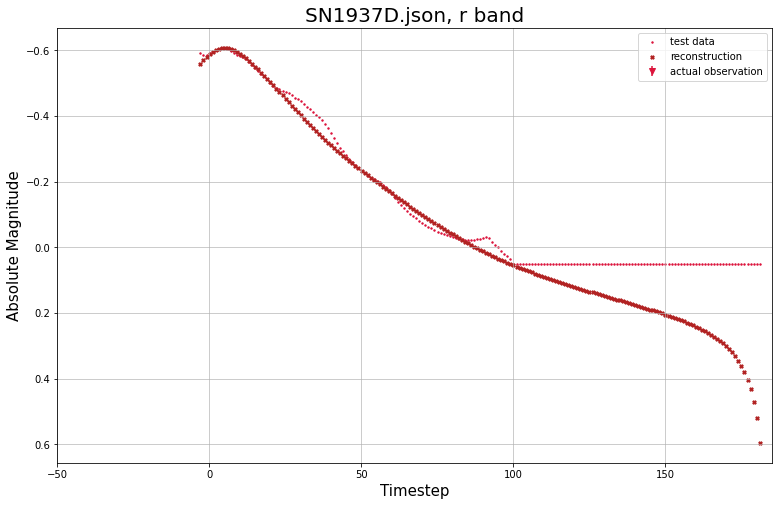

Ia


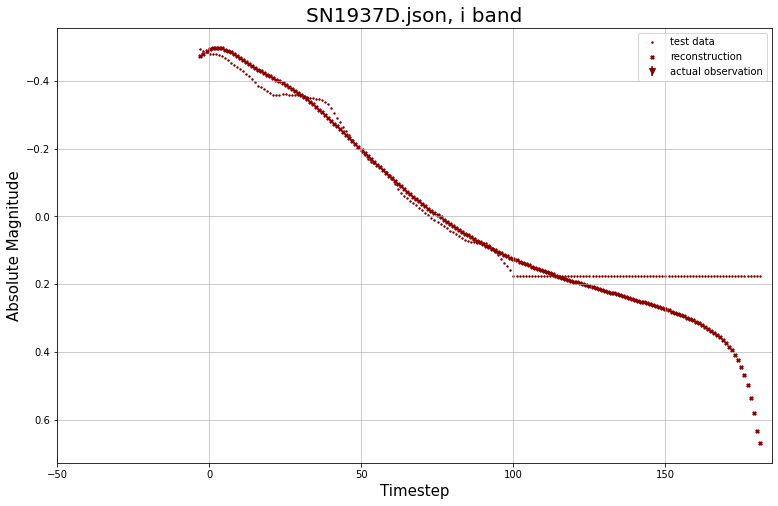

Ia


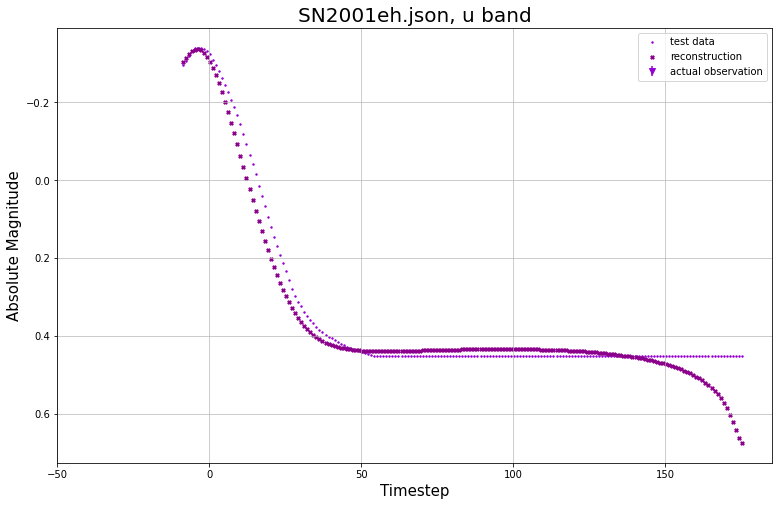

Ia


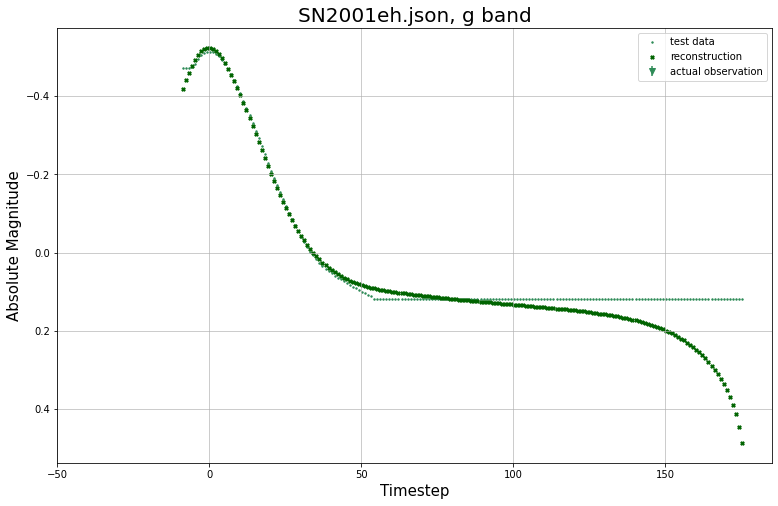

Ia


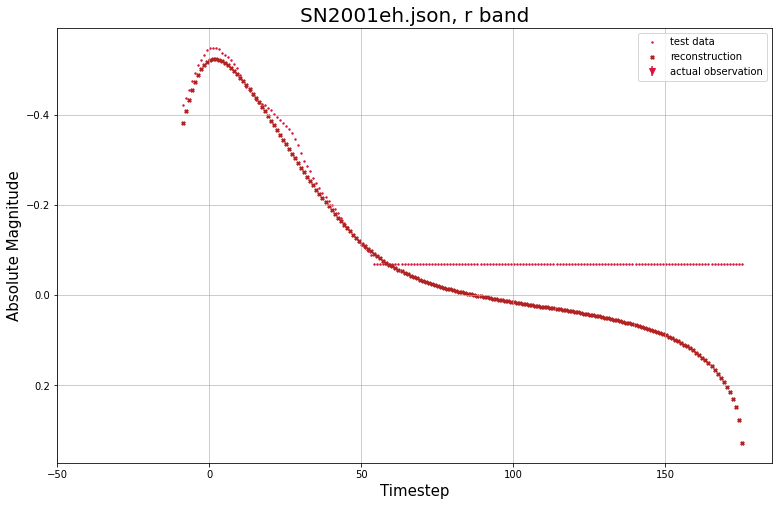

Ia


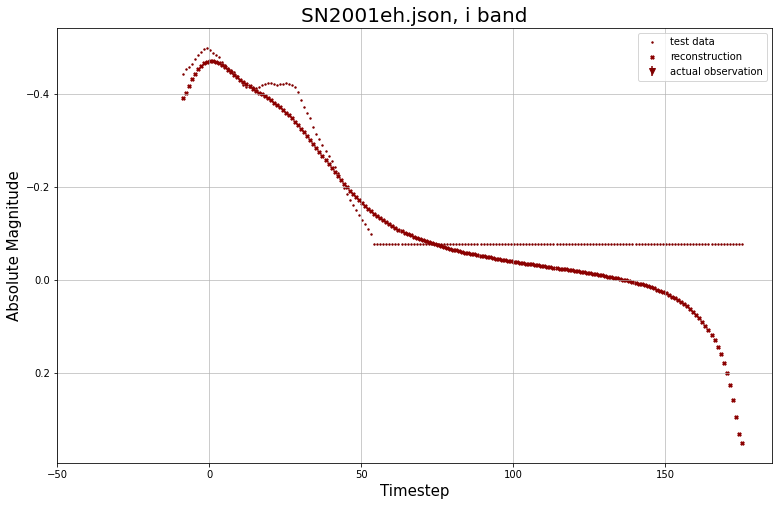

IIb


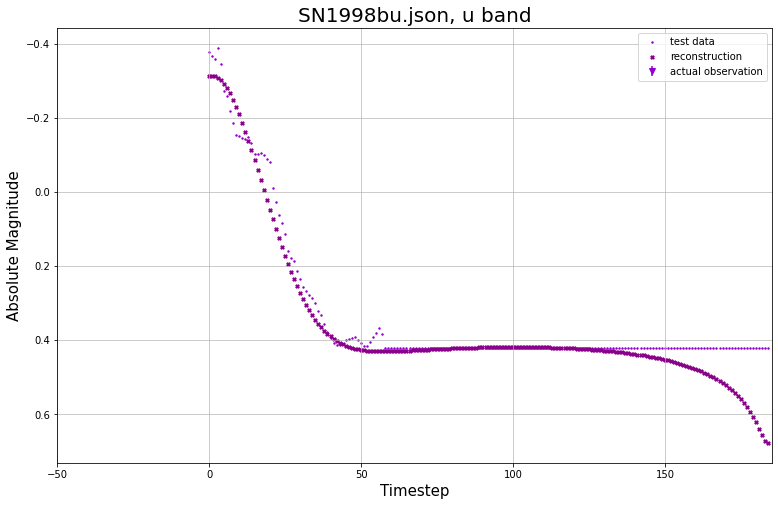

IIb


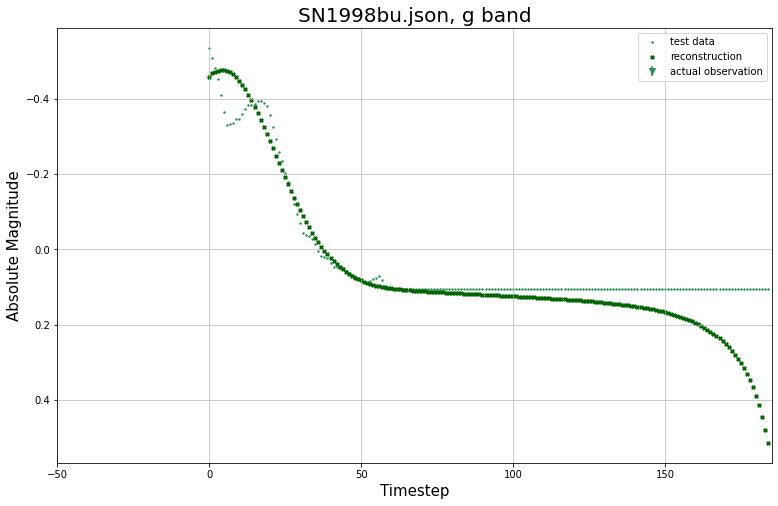

IIb


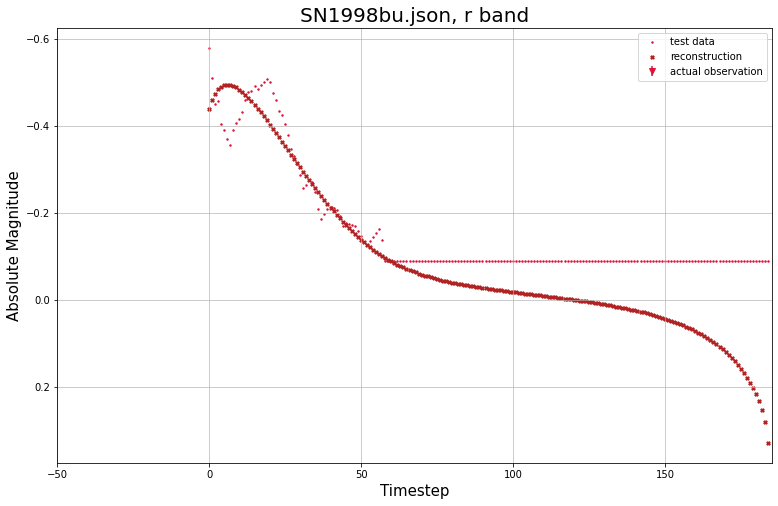

IIb


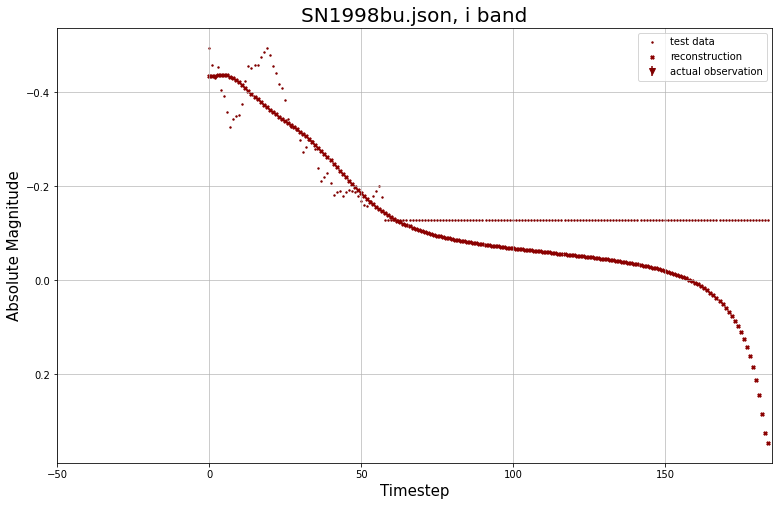

II


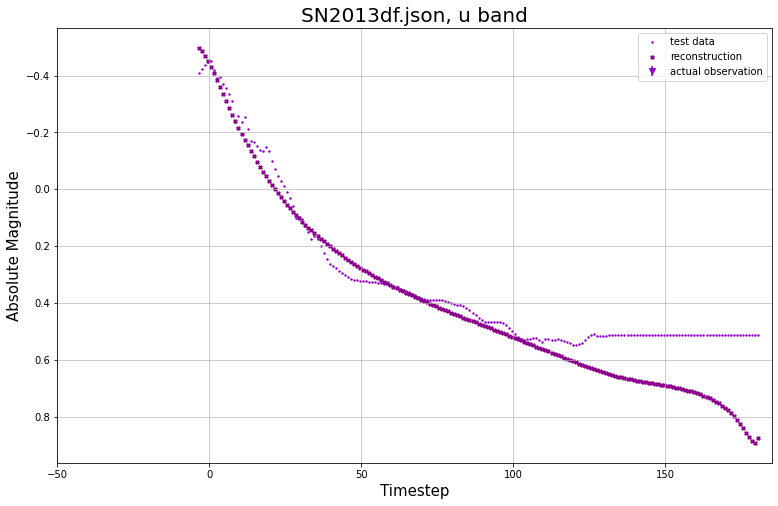

II


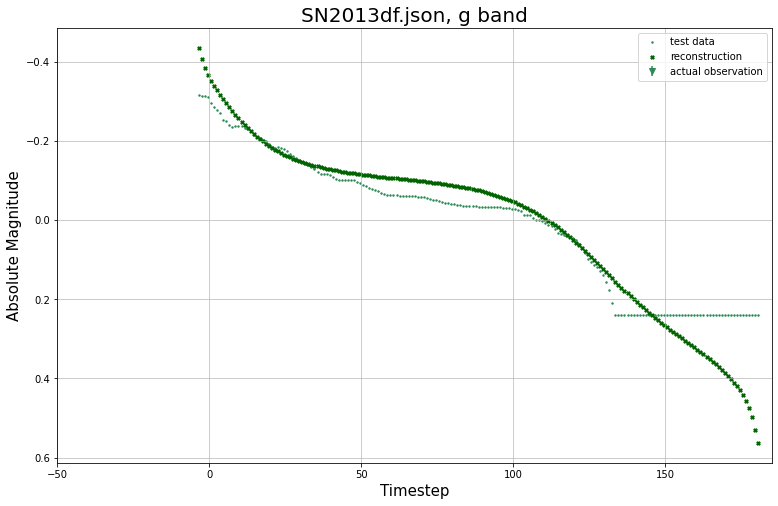

II


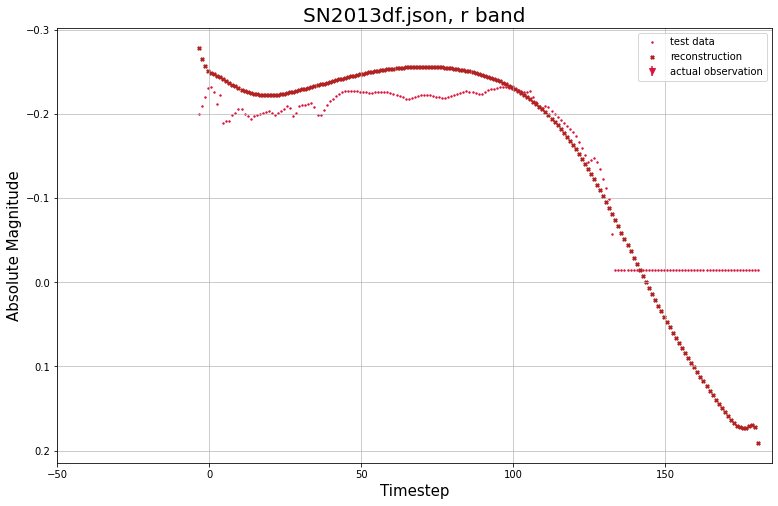

II


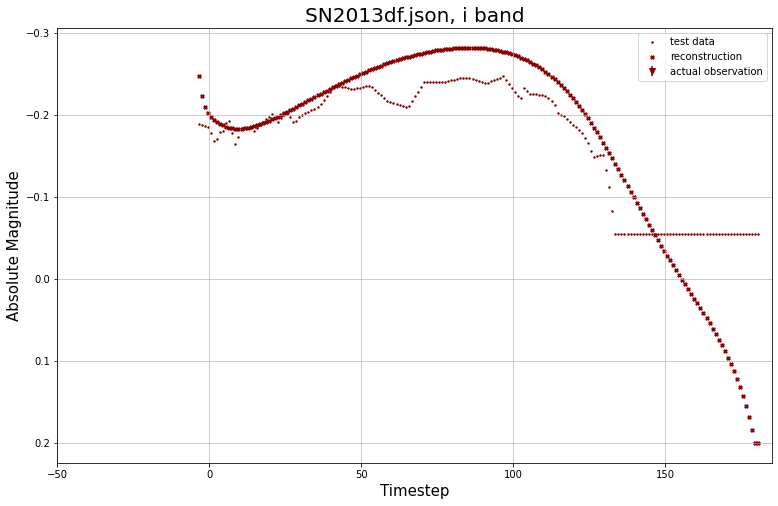

IIn


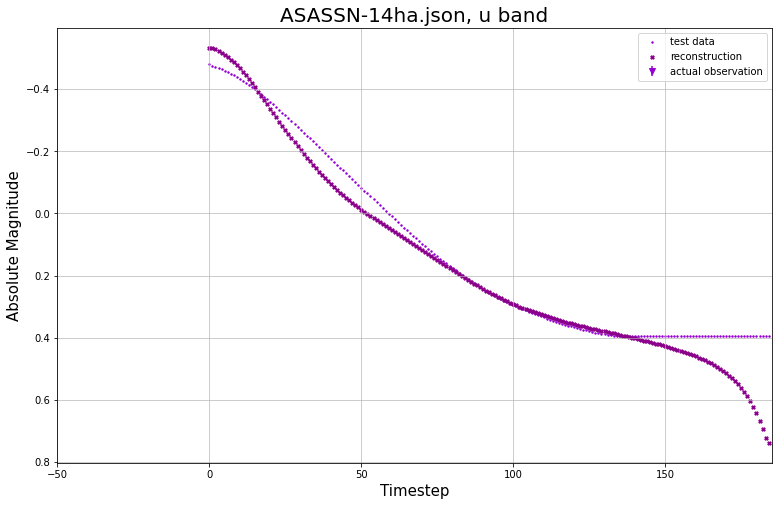

IIn


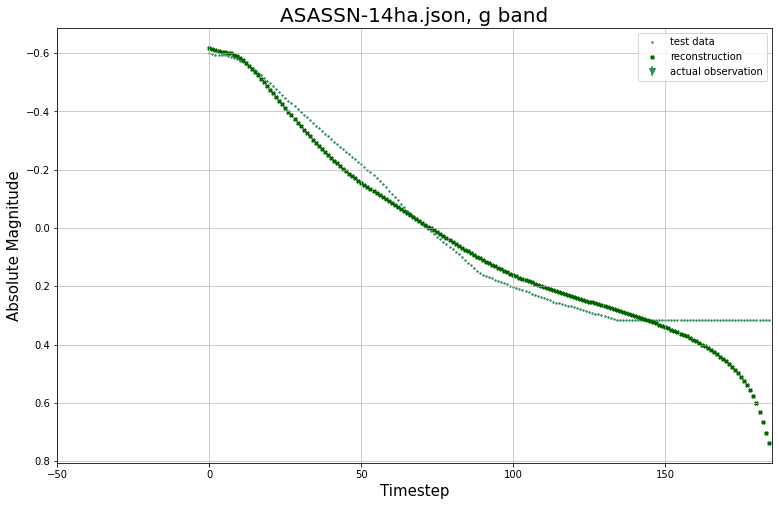

IIn


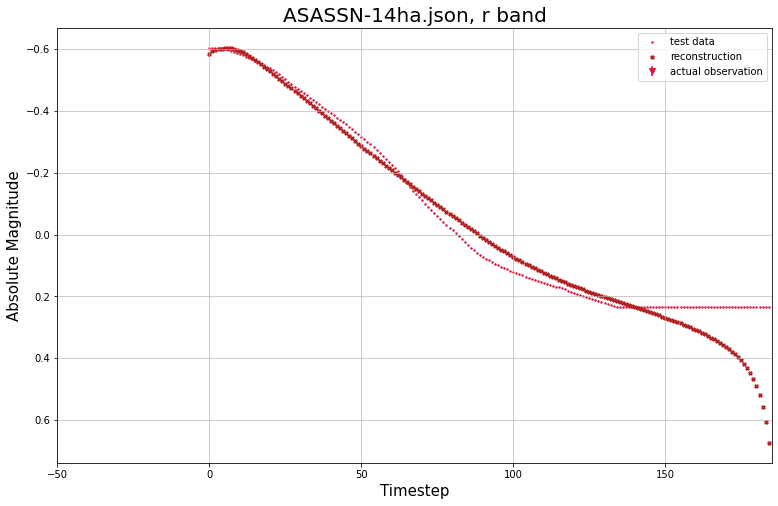

IIn


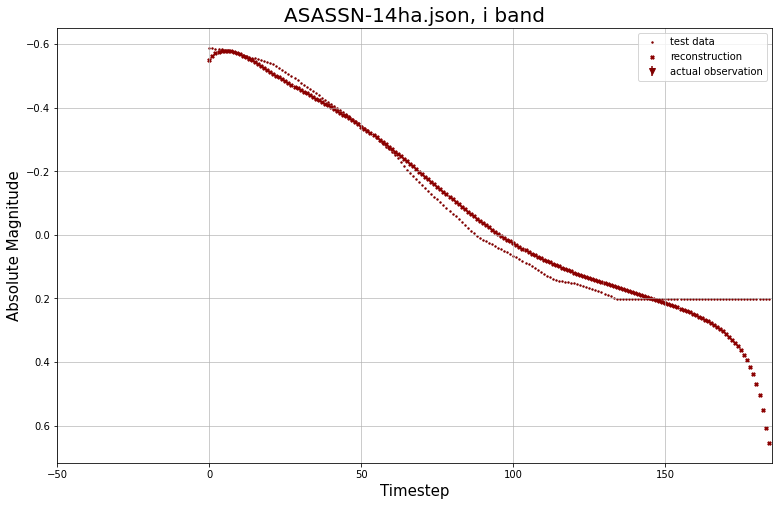

II


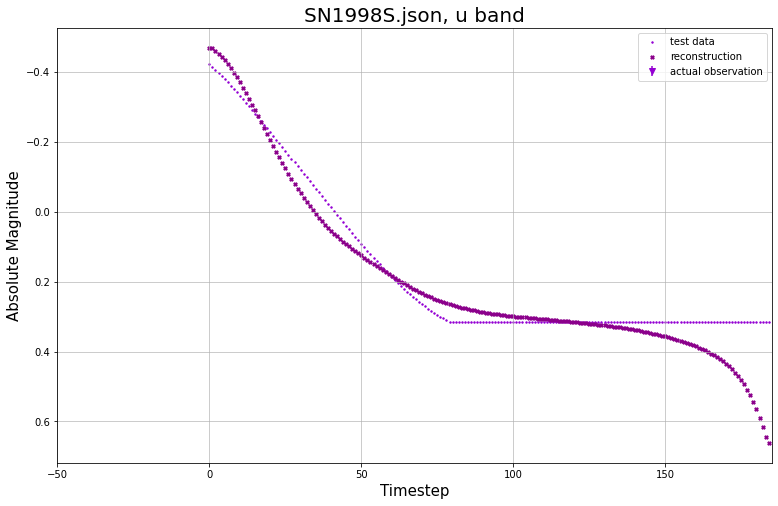

II


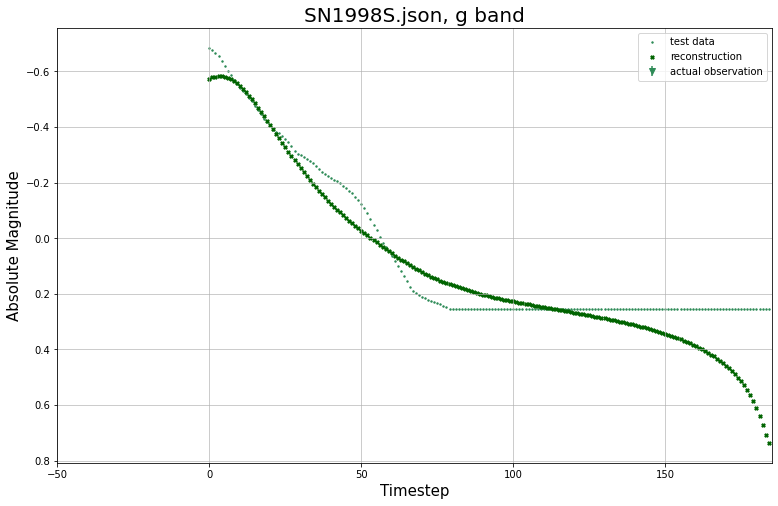

II


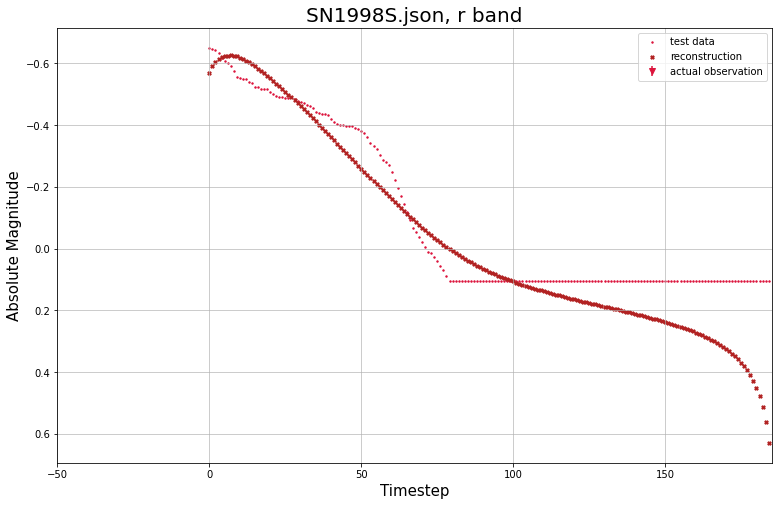

II


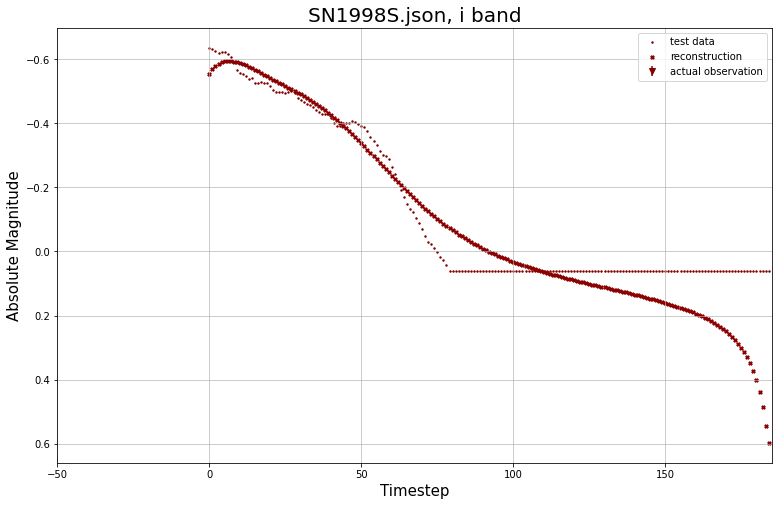

Ia


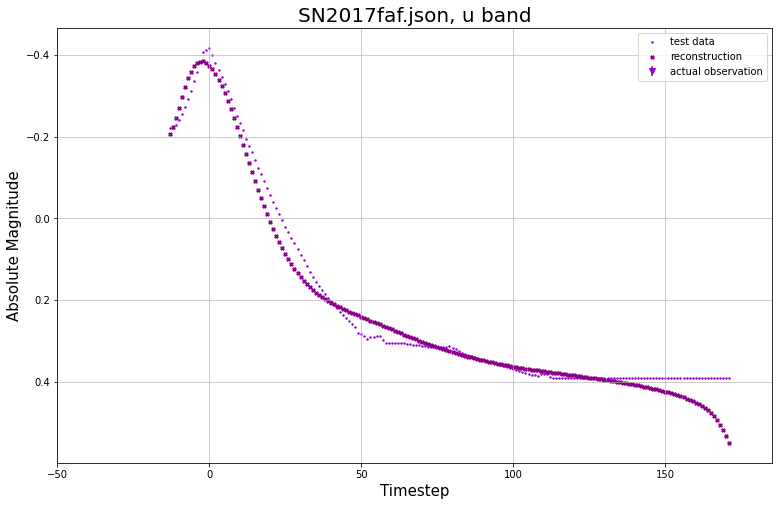

Ia


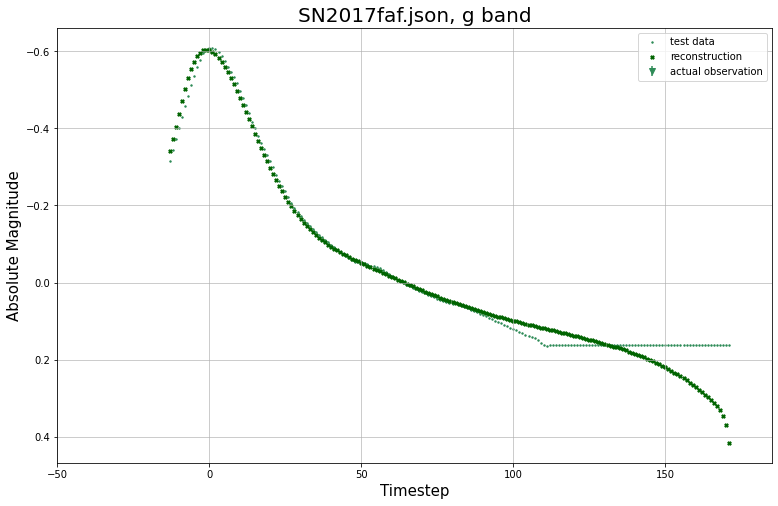

Ia


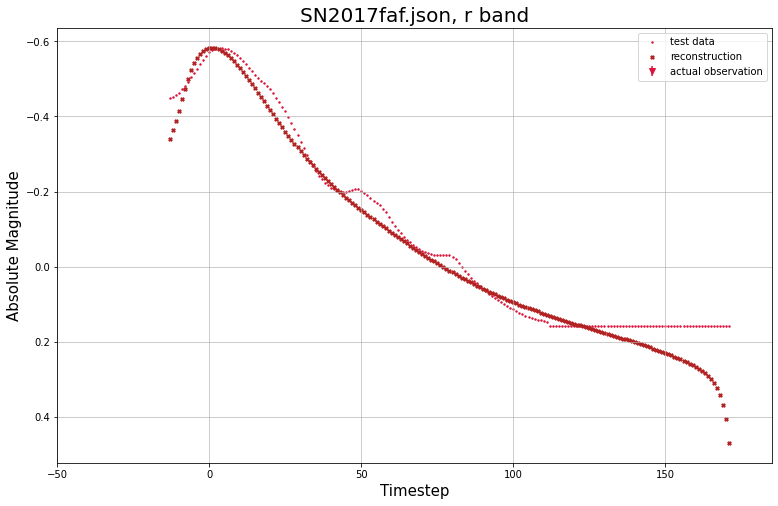

Ia


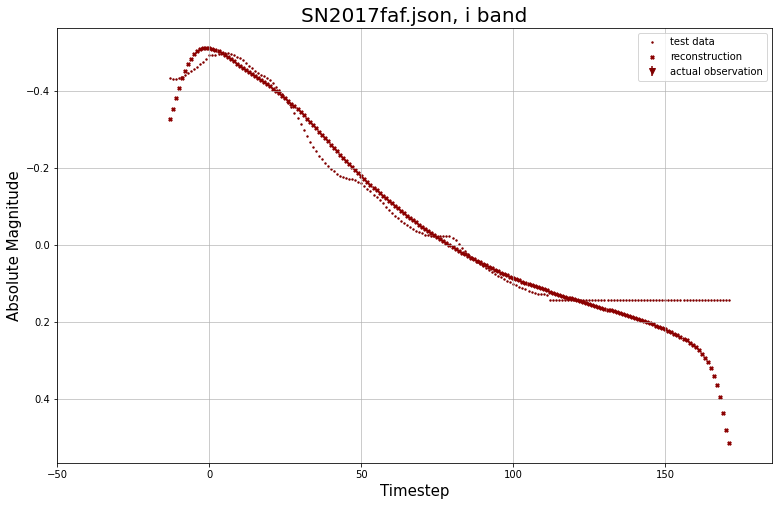

Ia


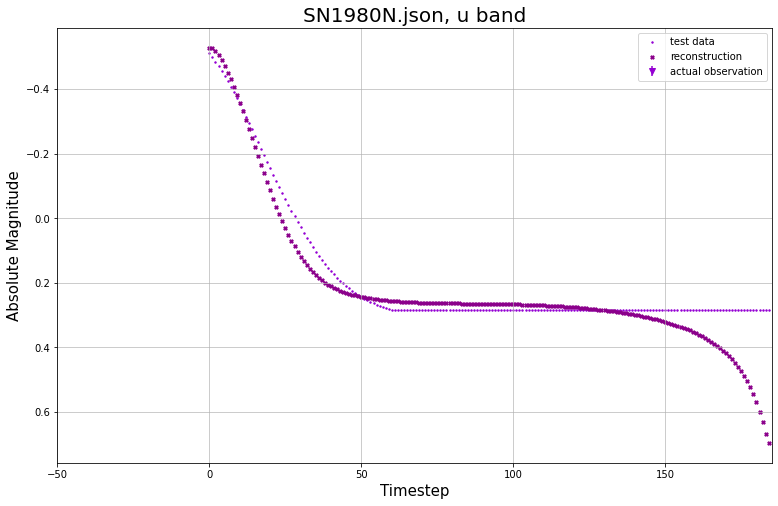

Ia


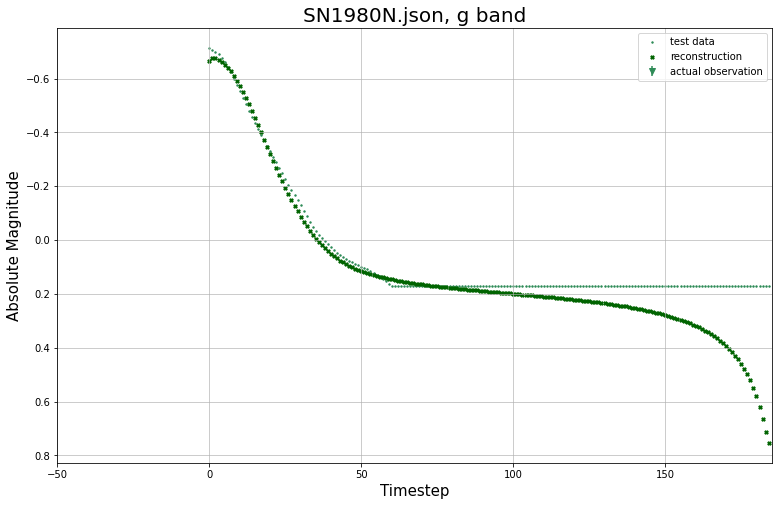

Ia


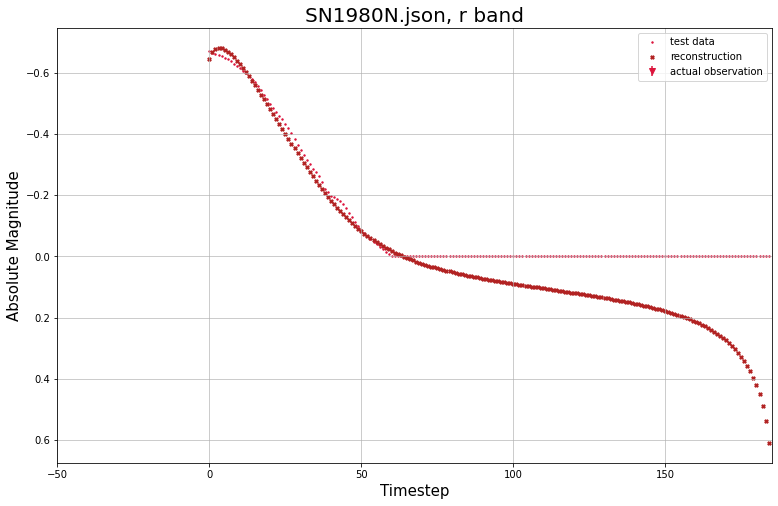

Ia


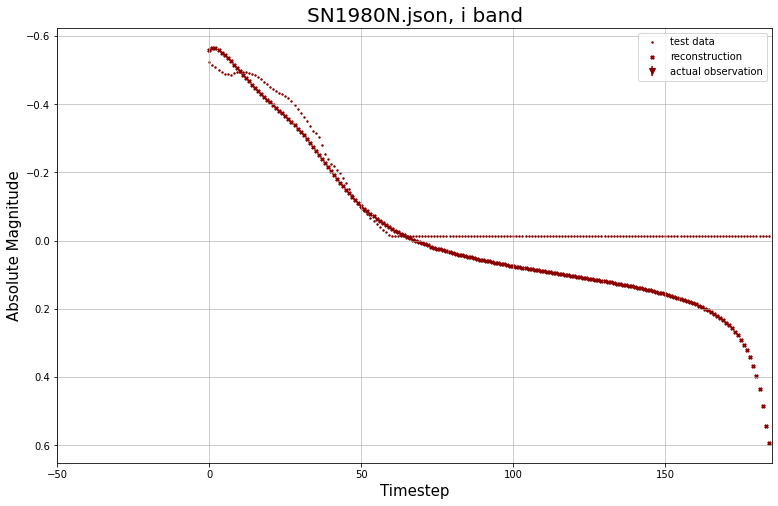

Ib


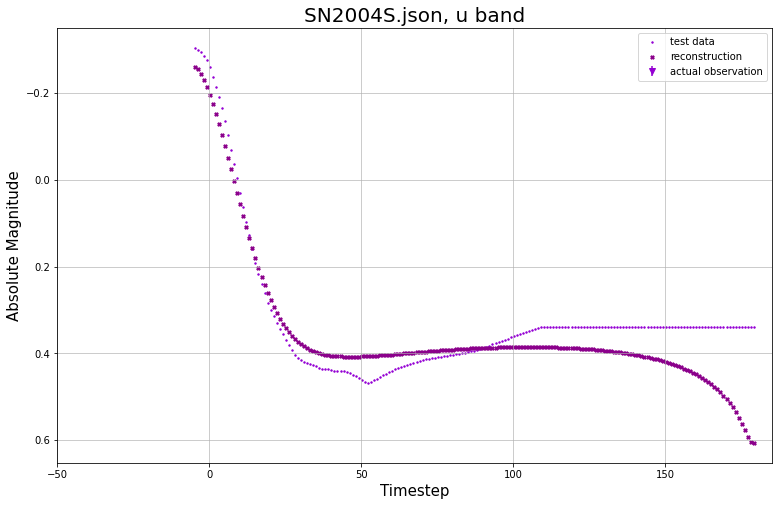

Ib


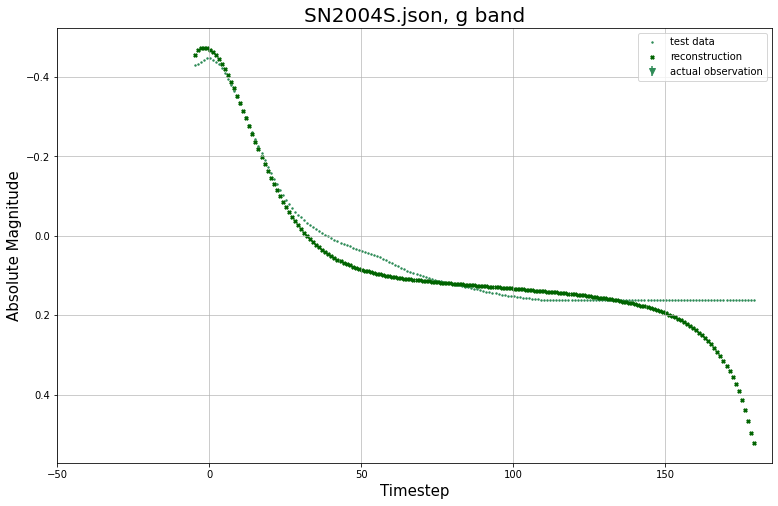

Ib


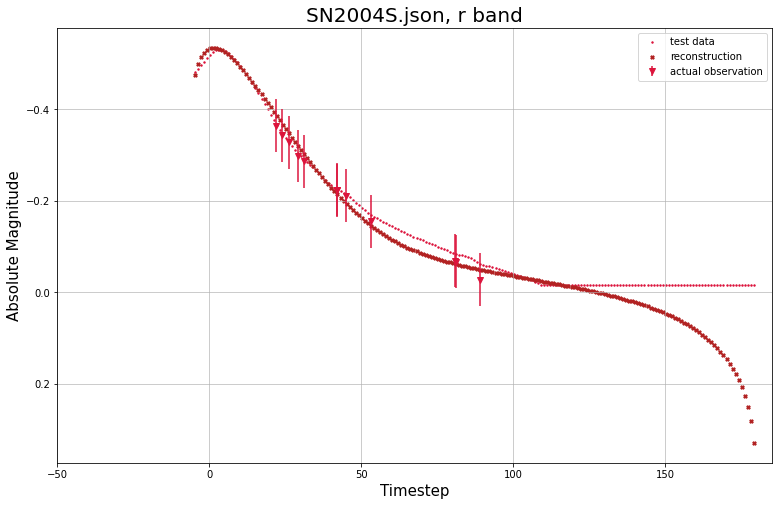

Ib


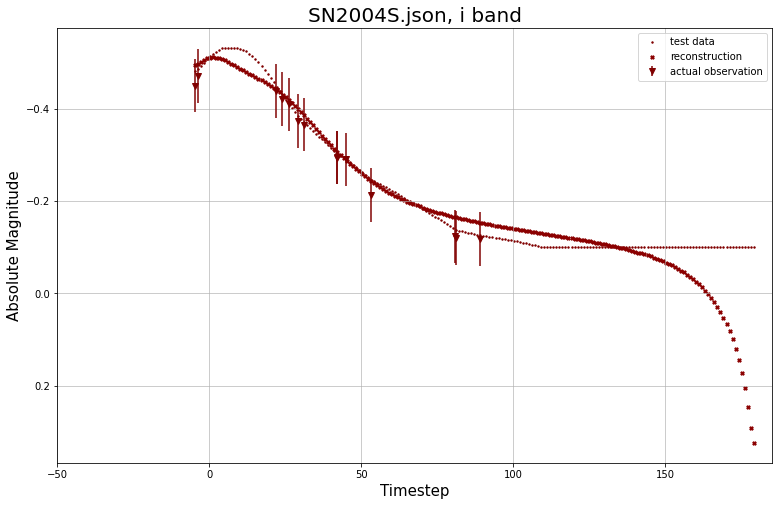

Ia


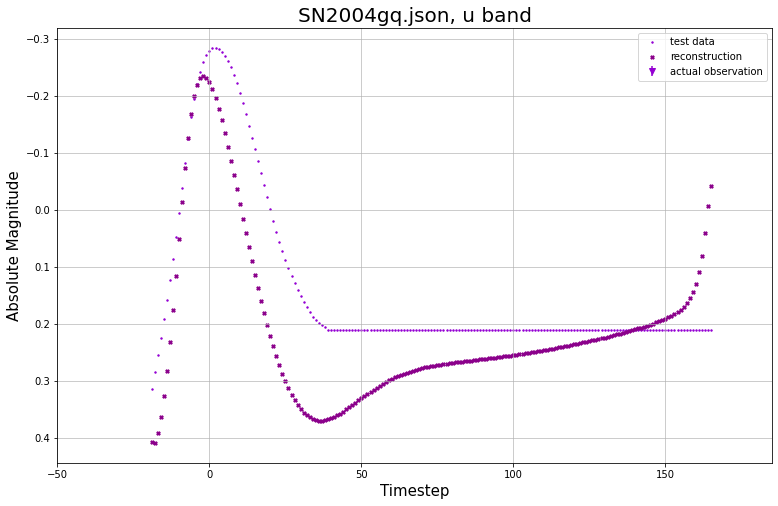

Ia


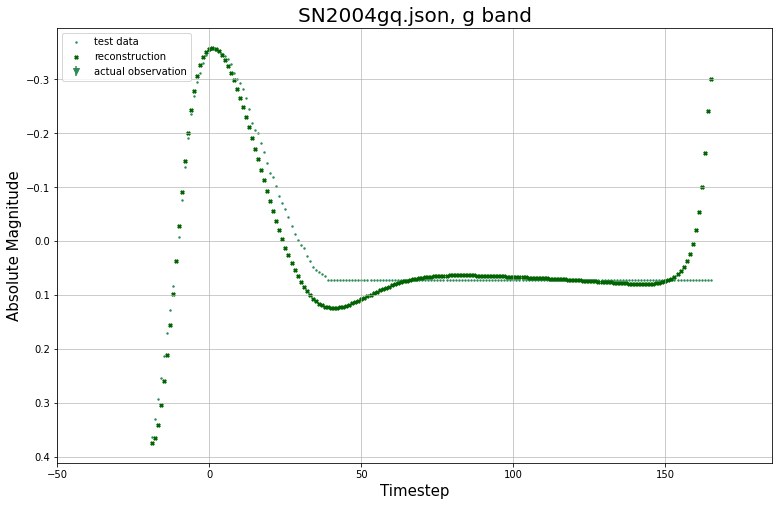

Ia


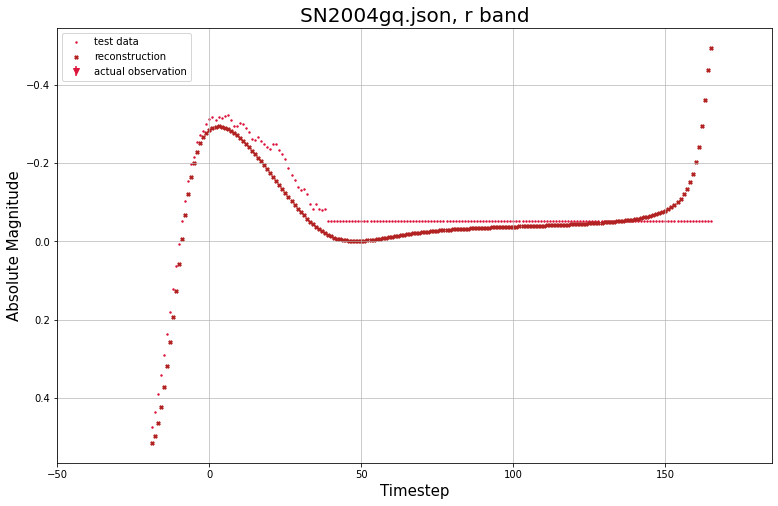

Ia


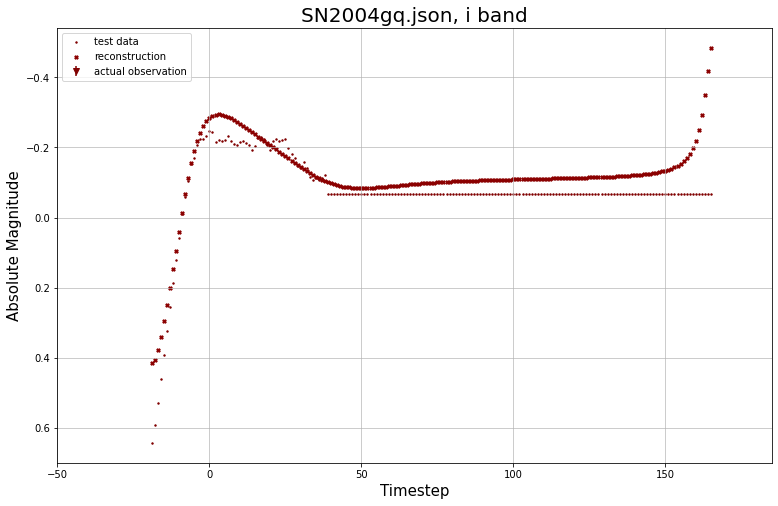

Ia


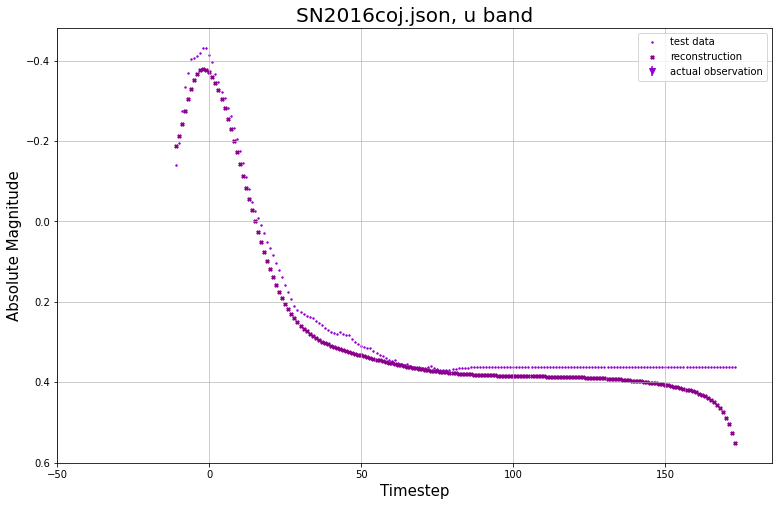

Ia


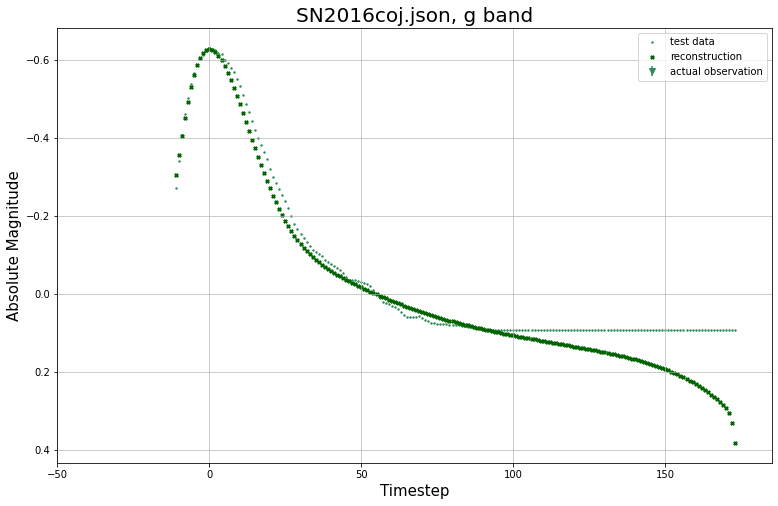

Ia


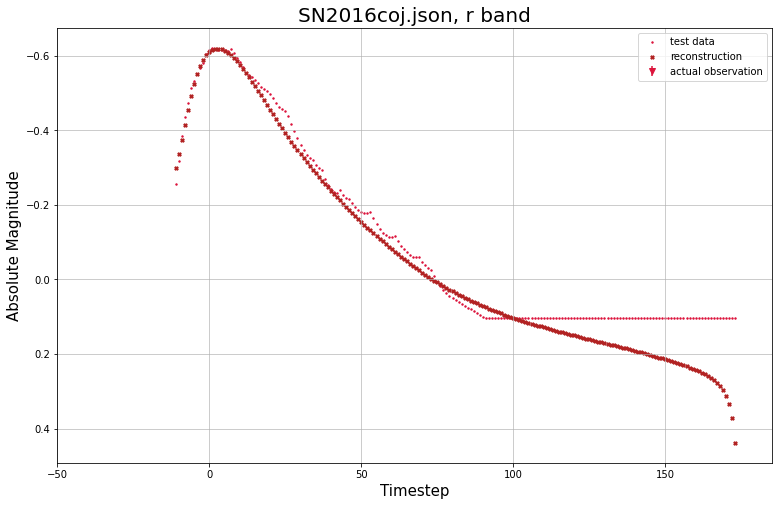

Ia


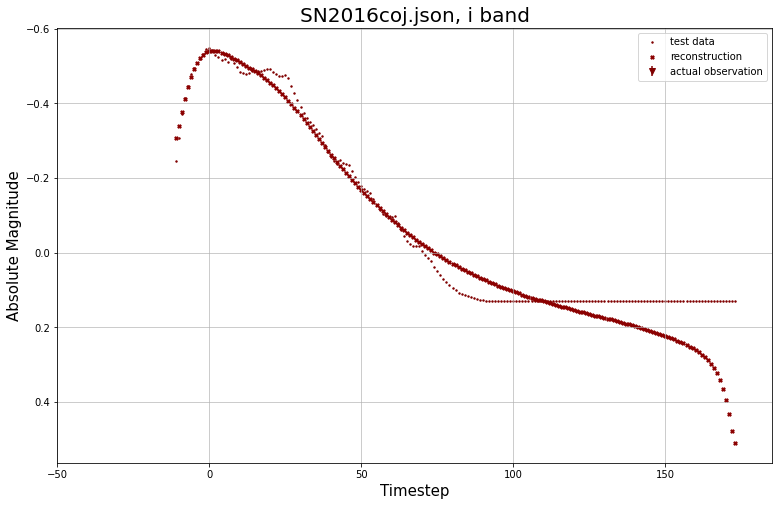

IIb


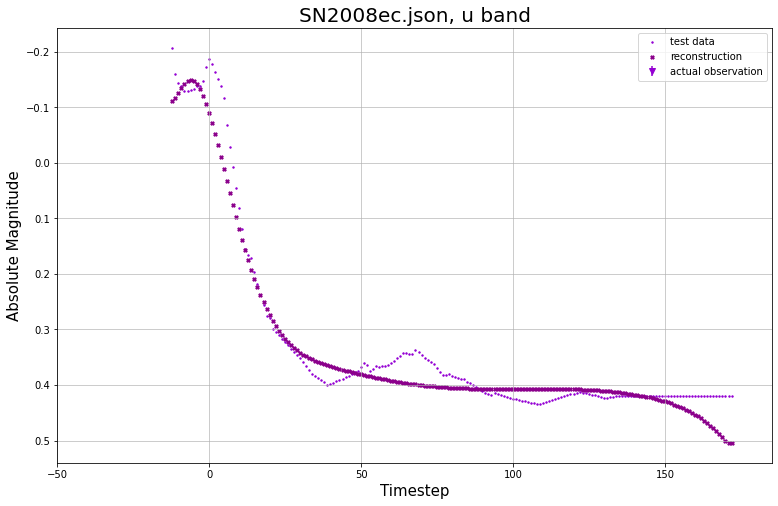

IIb


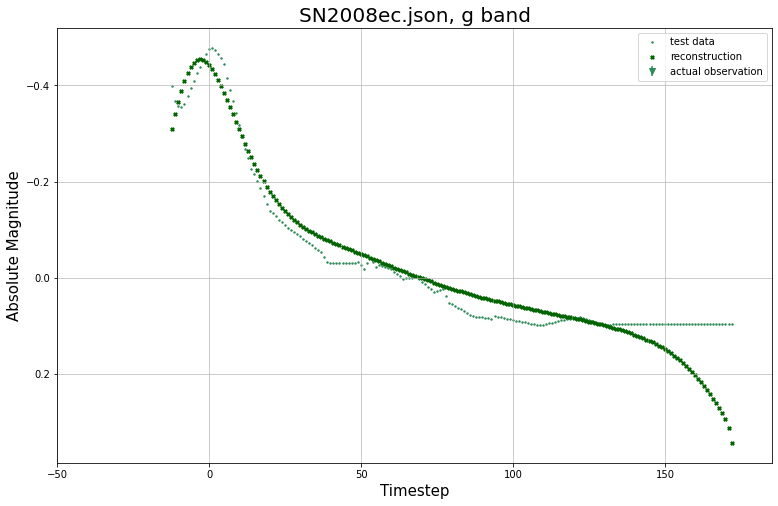

IIb


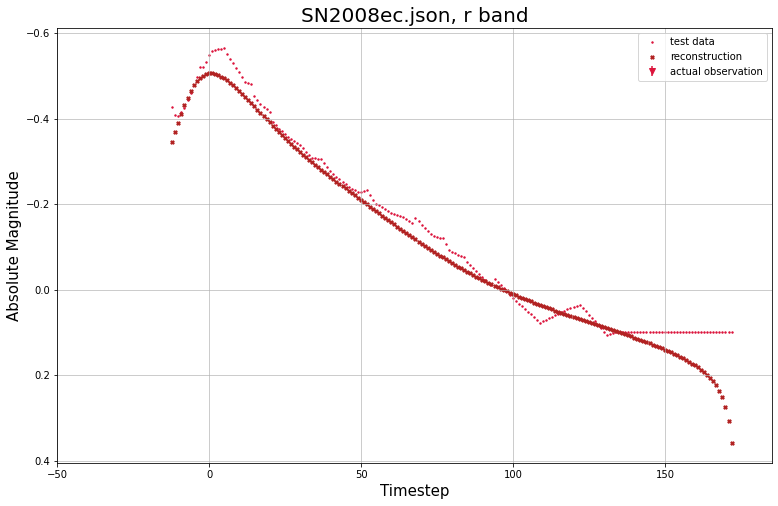

IIb


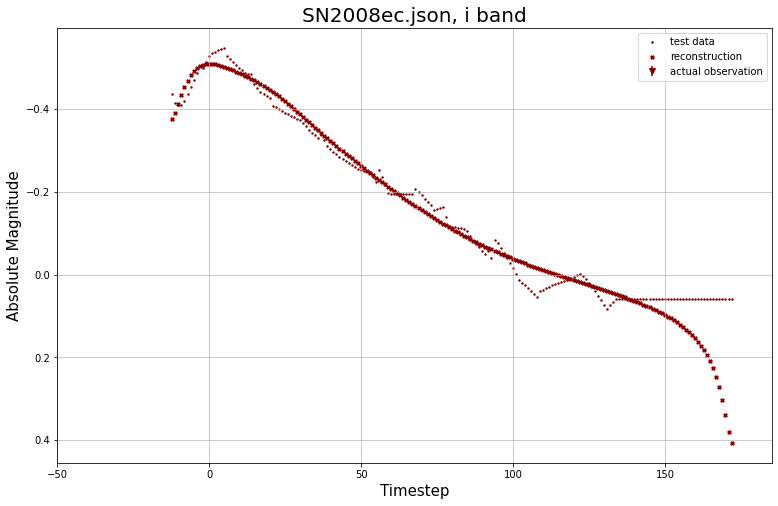

IIb


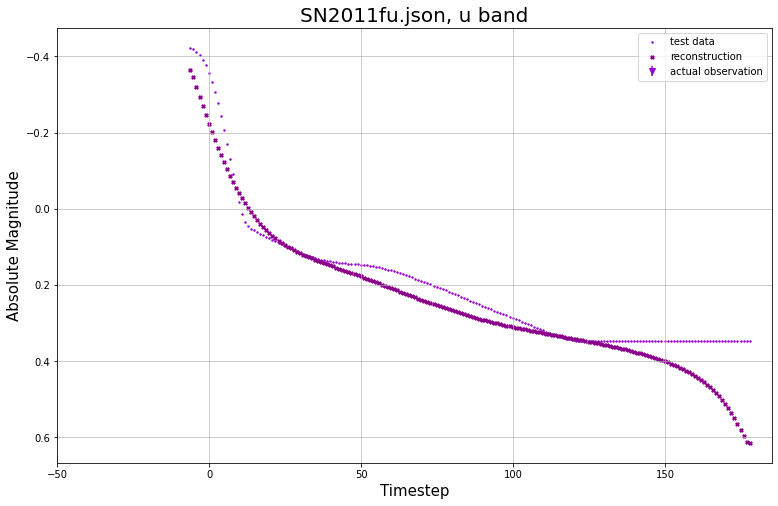

IIb


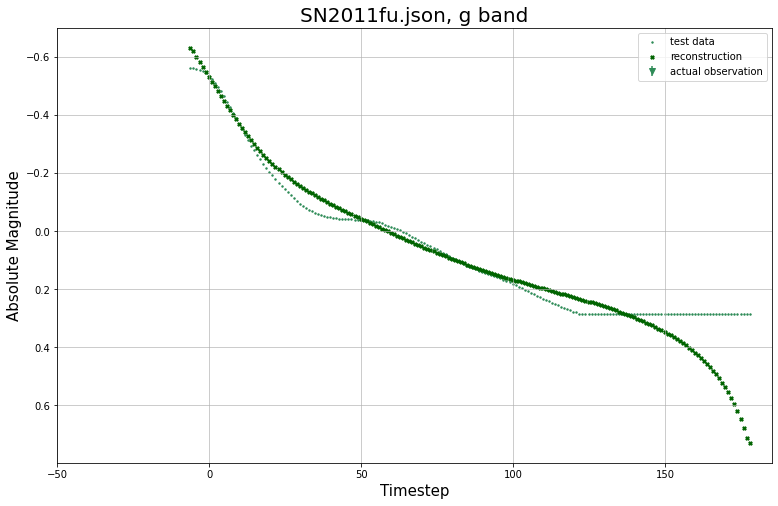

IIb


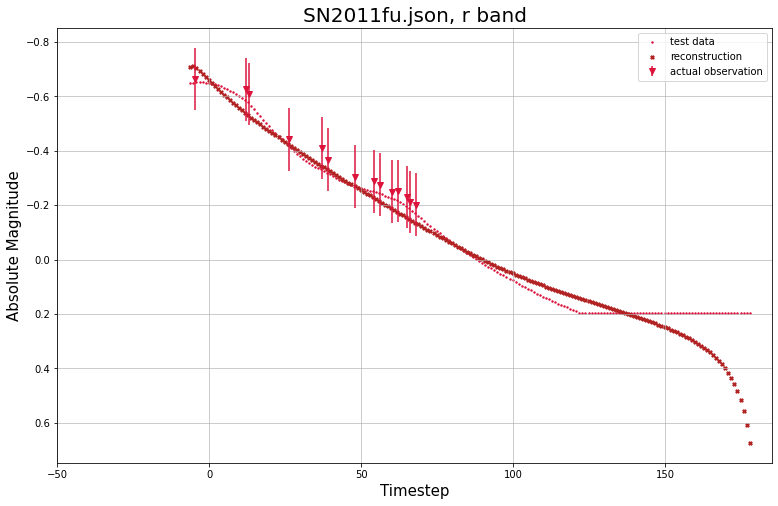

IIb


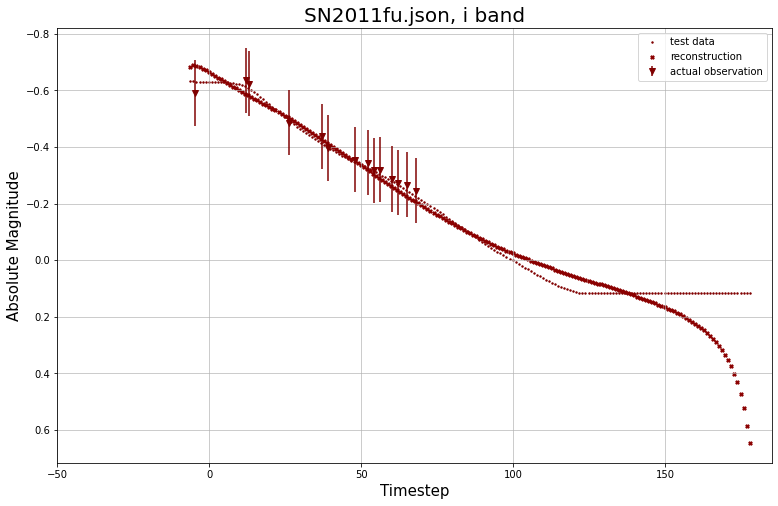

II


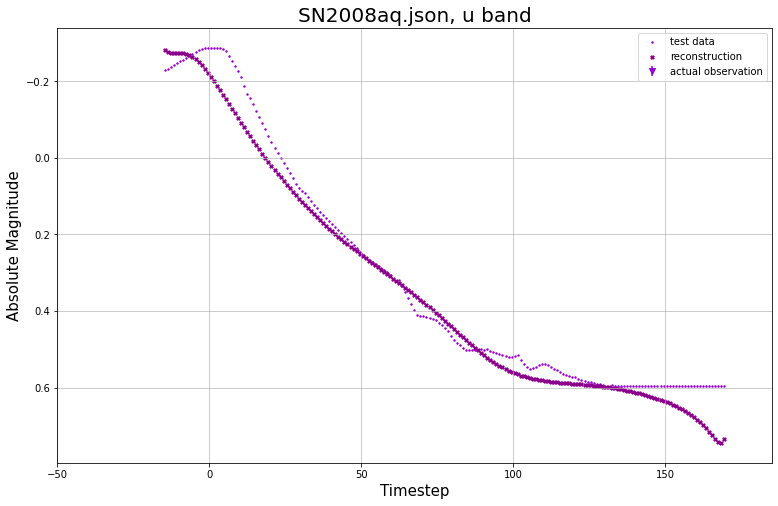

II


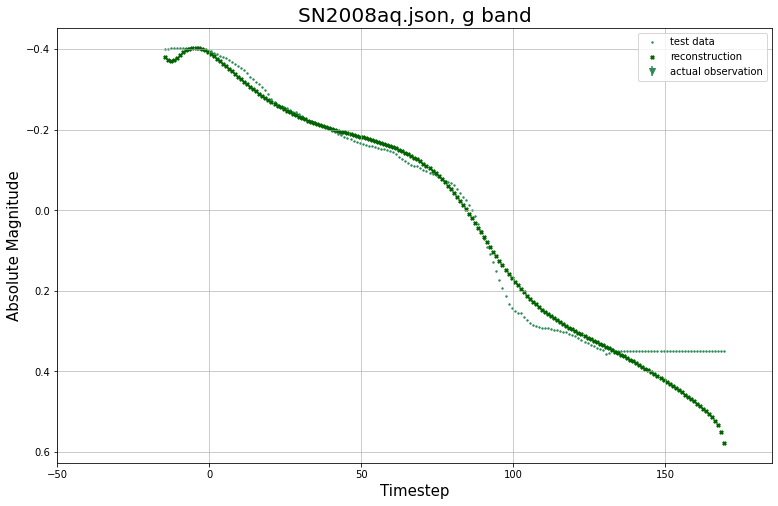

II


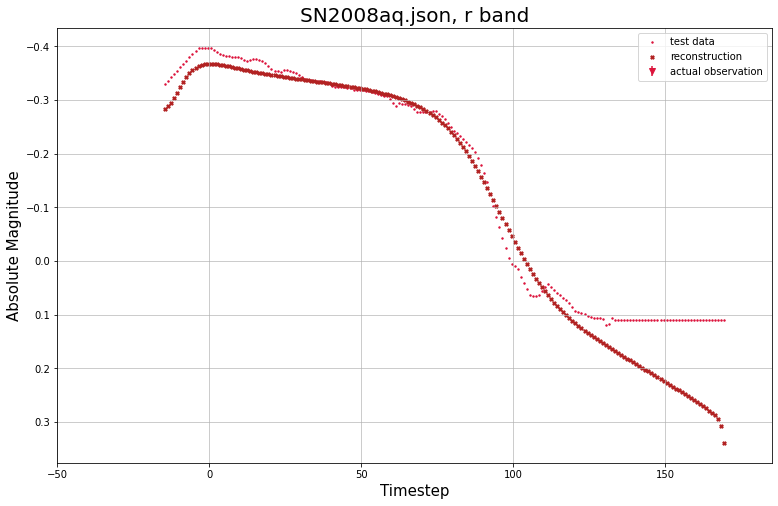

II


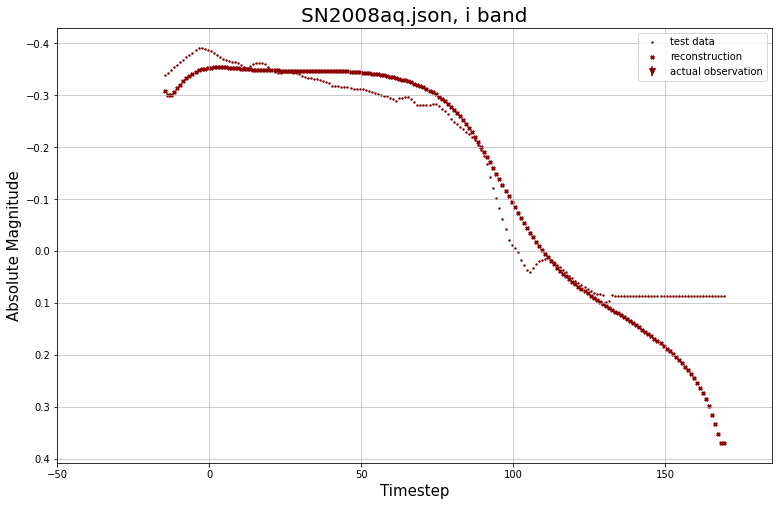

IIn


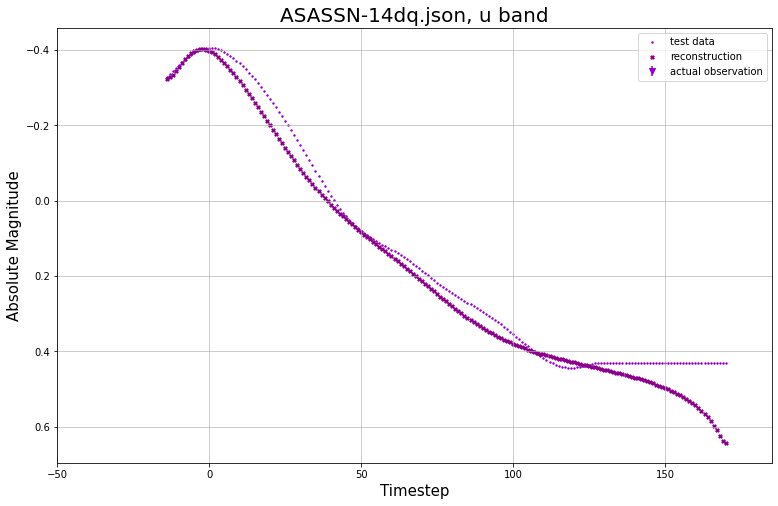

IIn


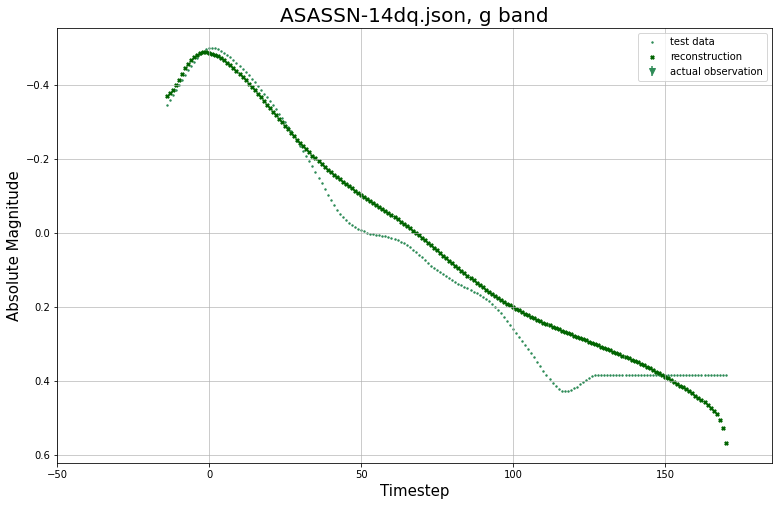

IIn


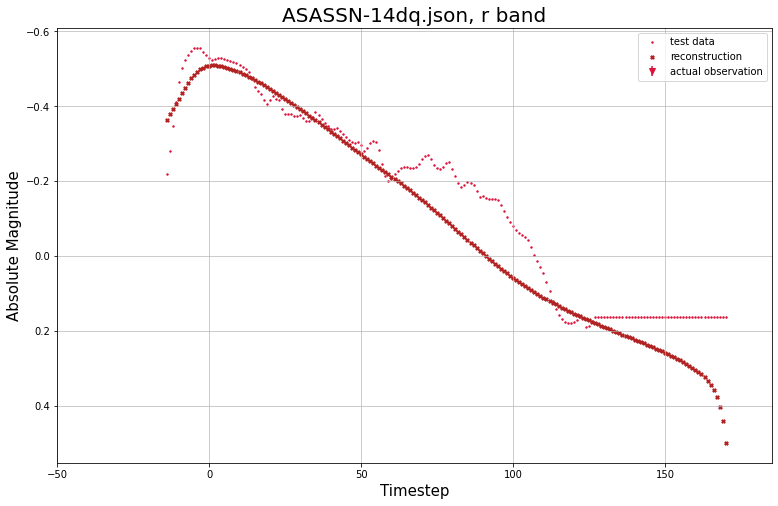

IIn


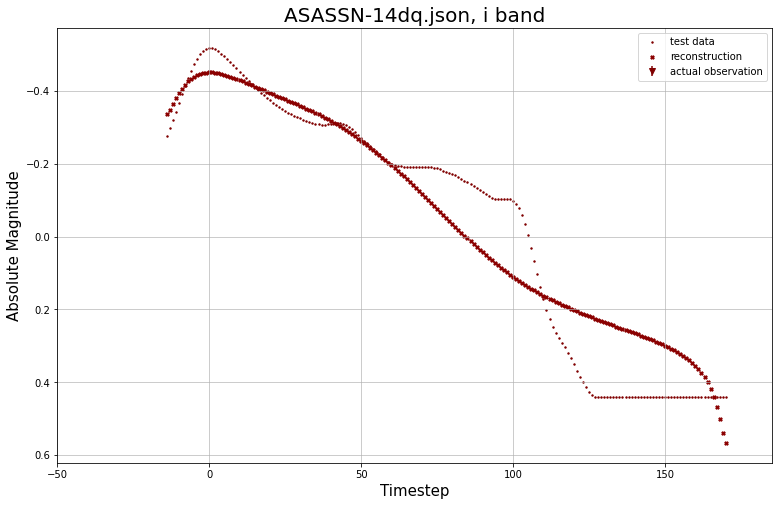

II P


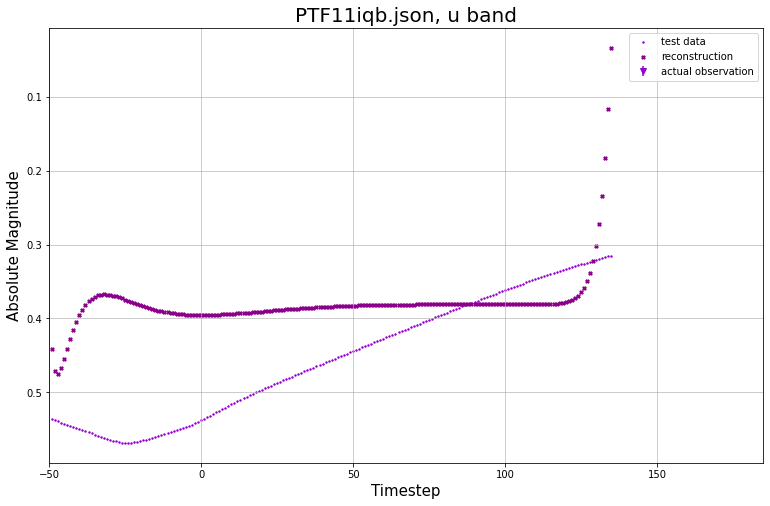

II P


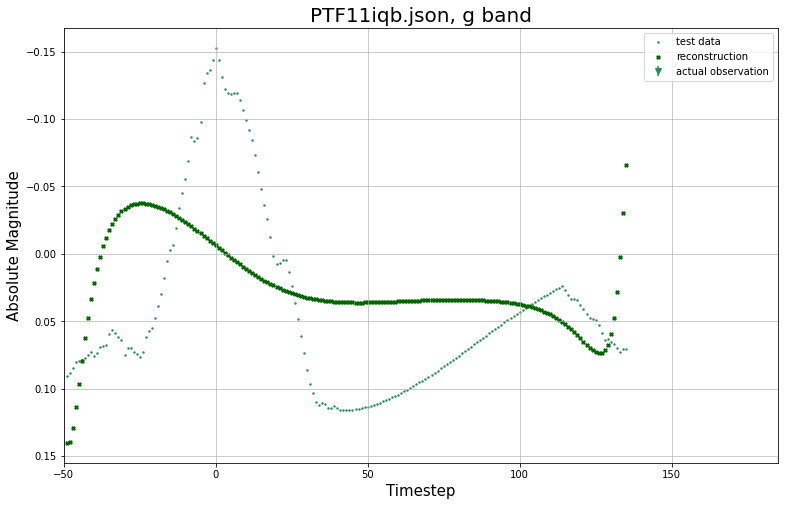

II P


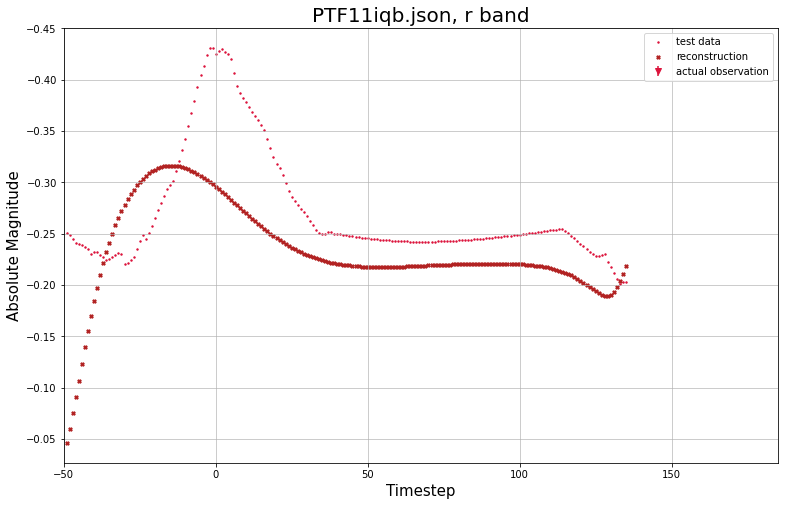

II P


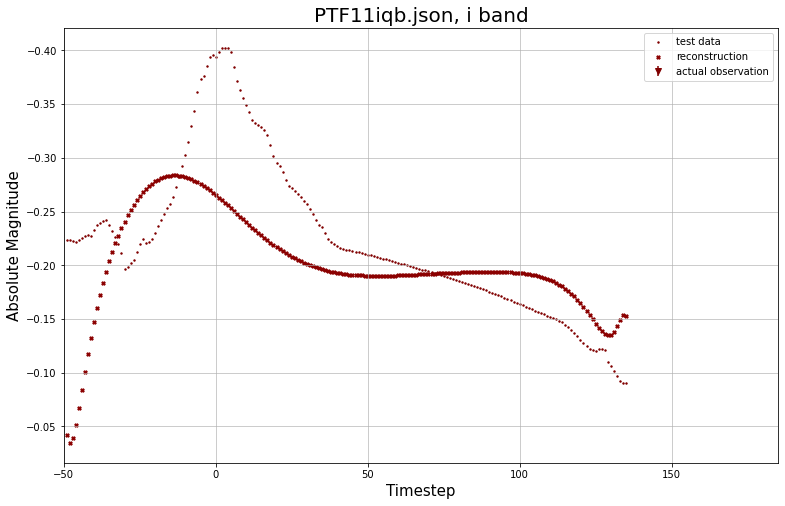

Ia


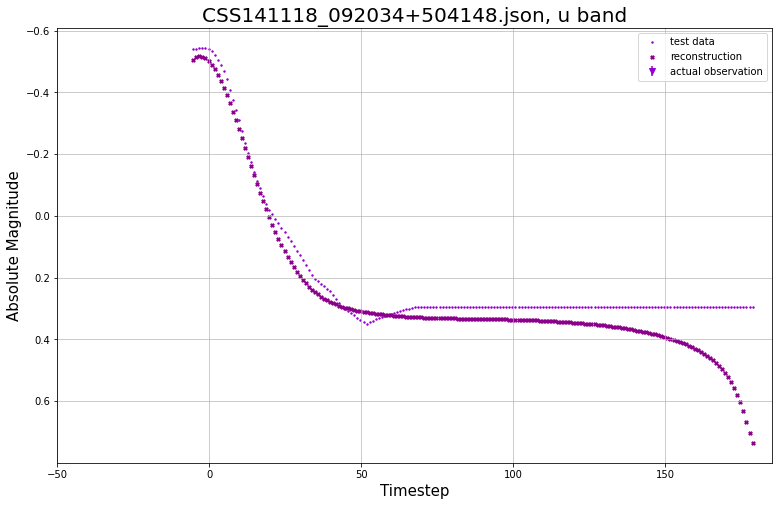

Ia


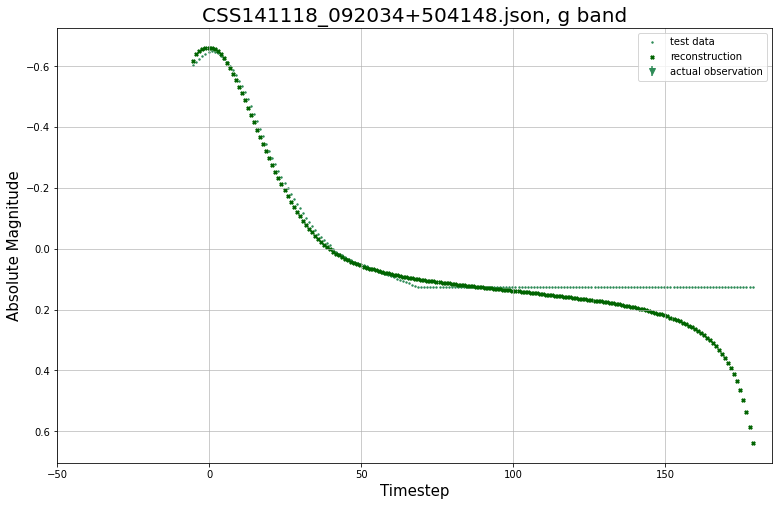

Ia


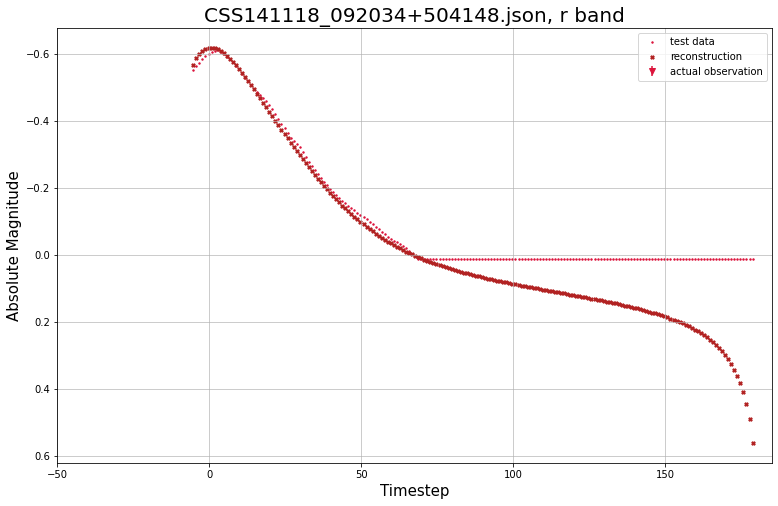

Ia


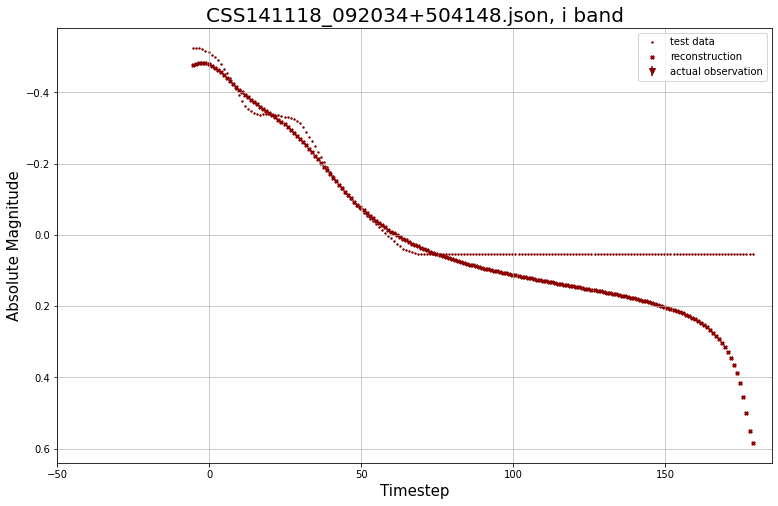

Ia


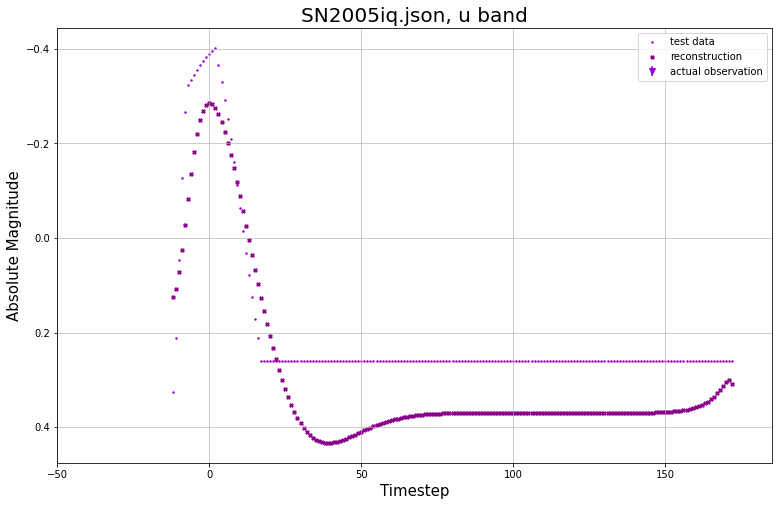

Ia


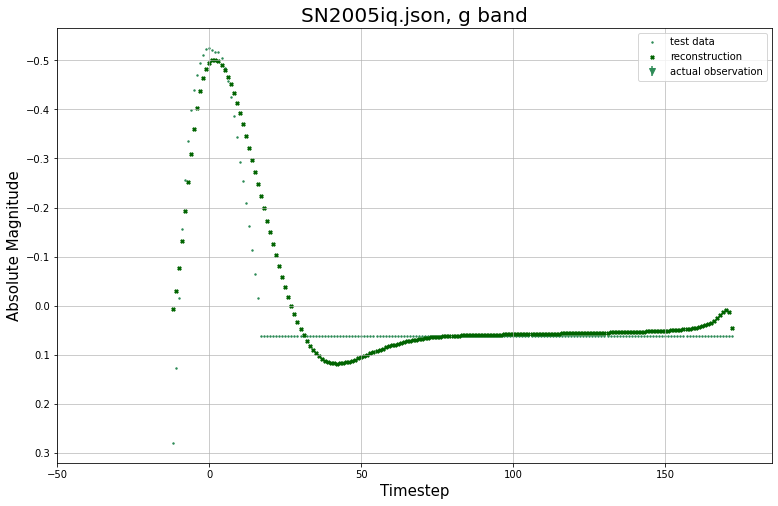

Ia


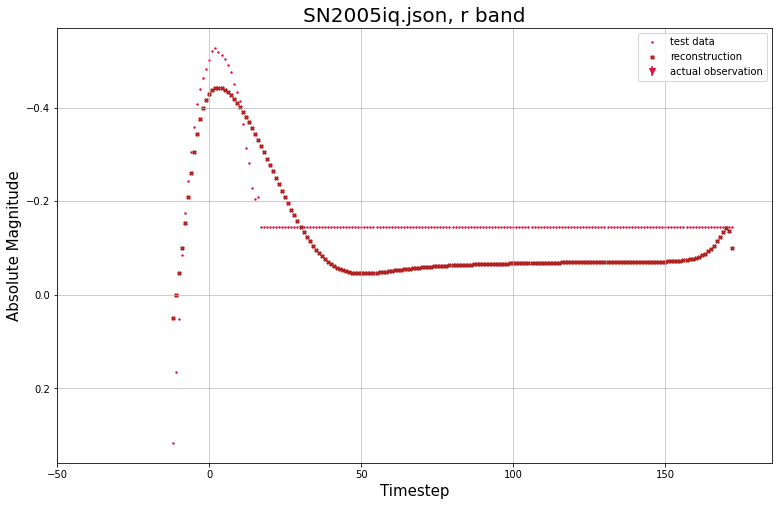

Ia


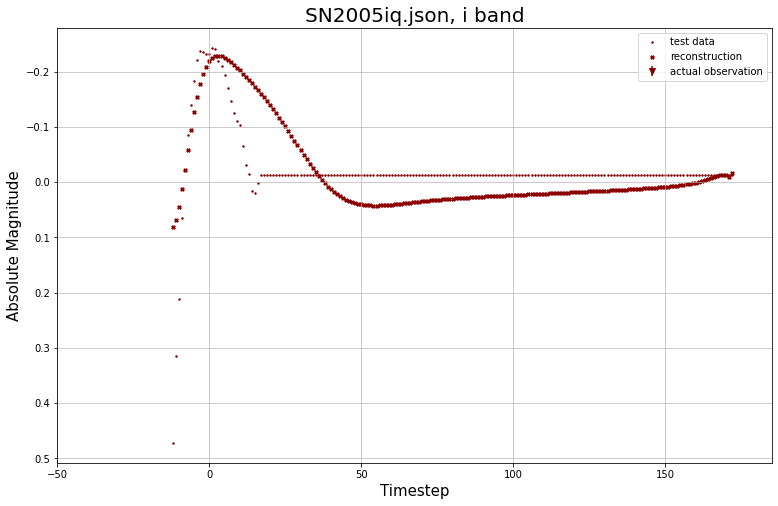

Ia


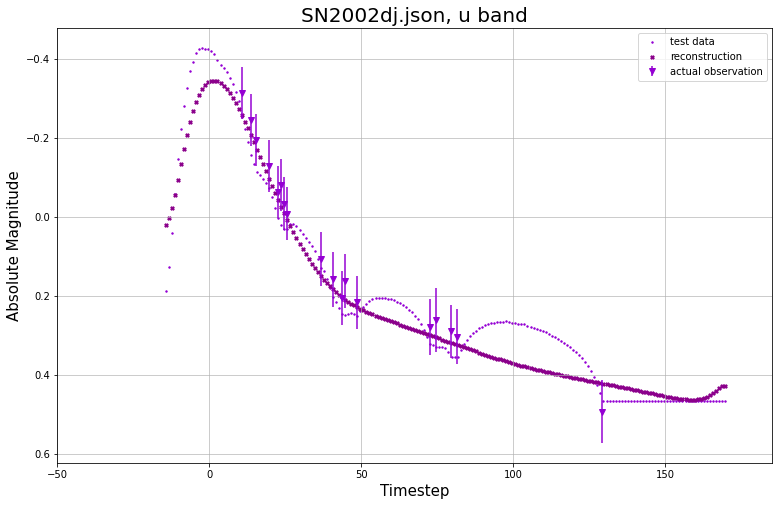

Ia


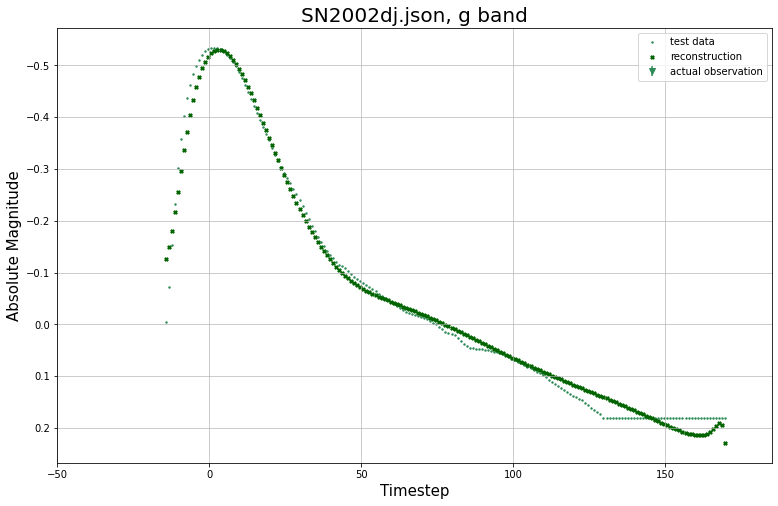

Ia


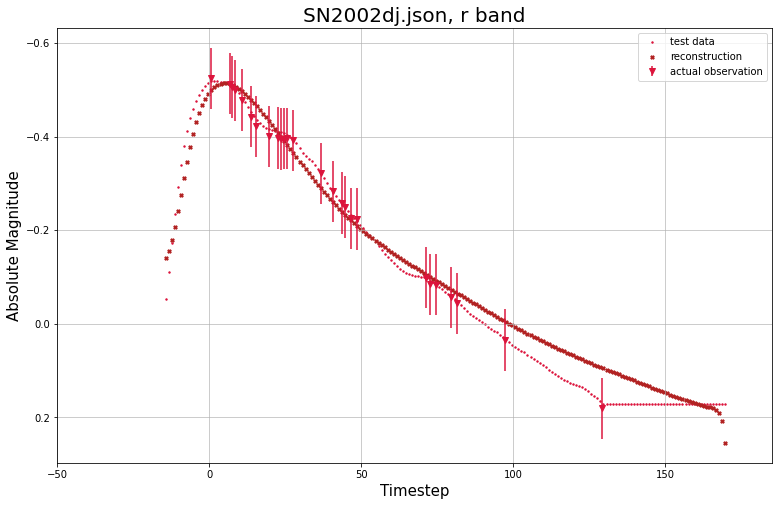

Ia


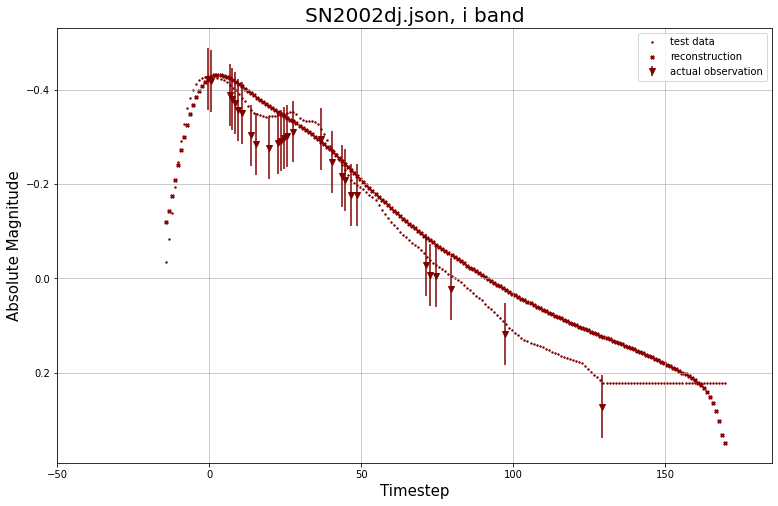

II


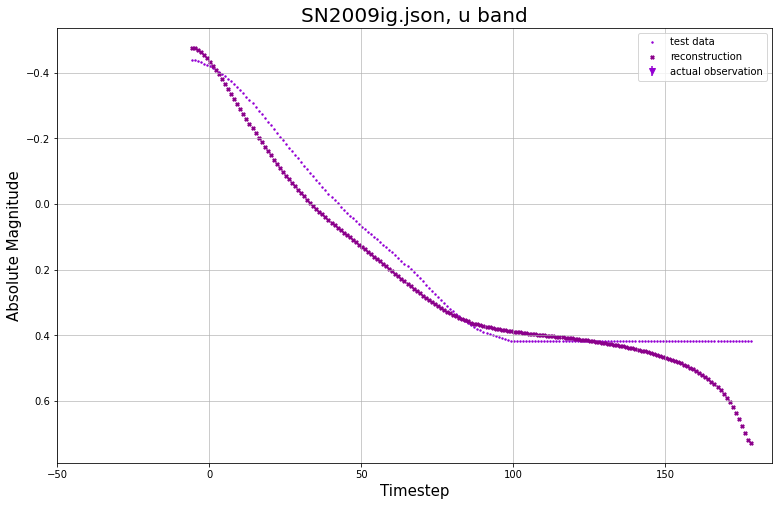

II


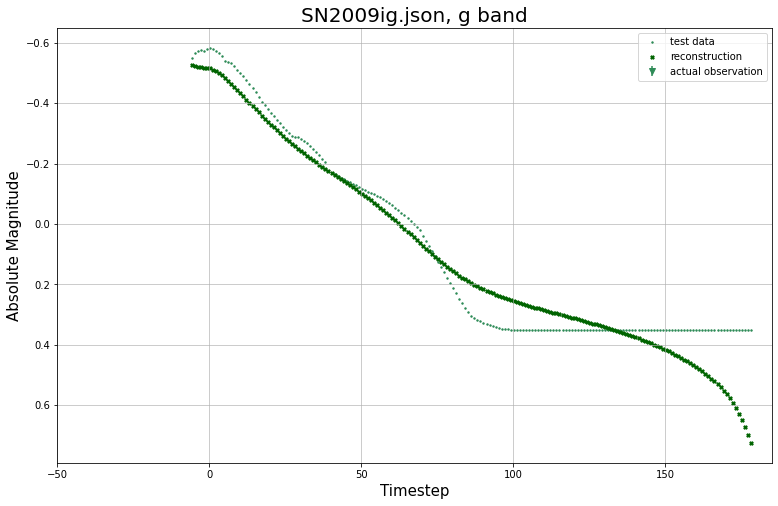

II


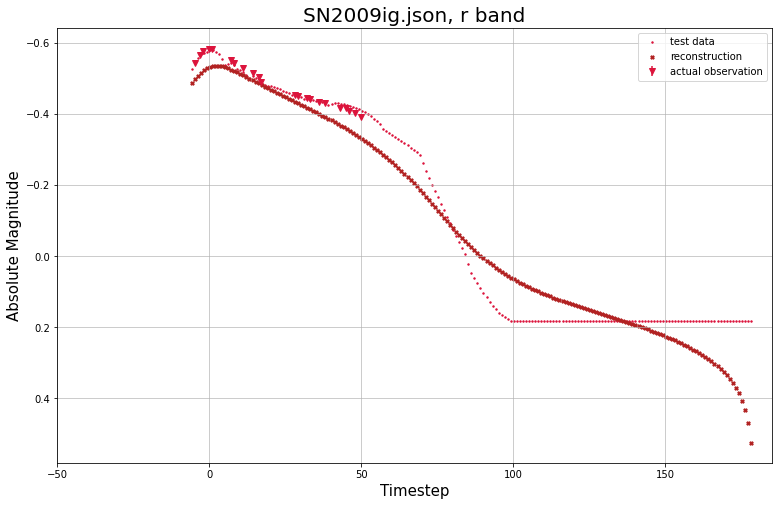

II


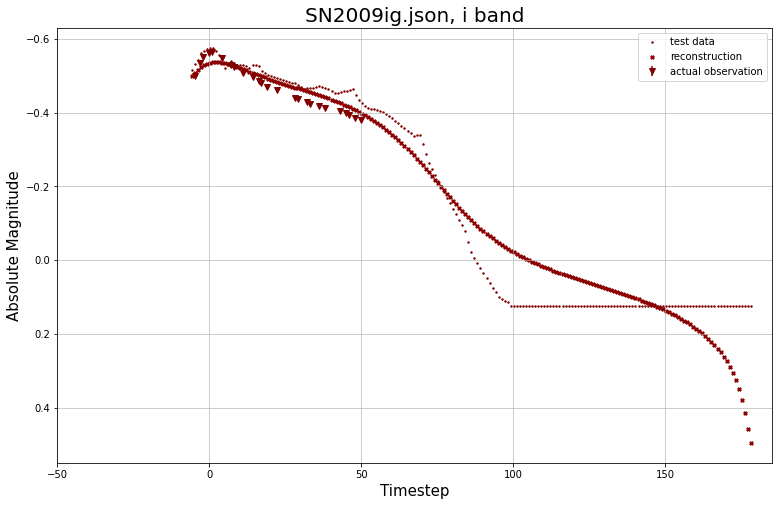

Ia Pec


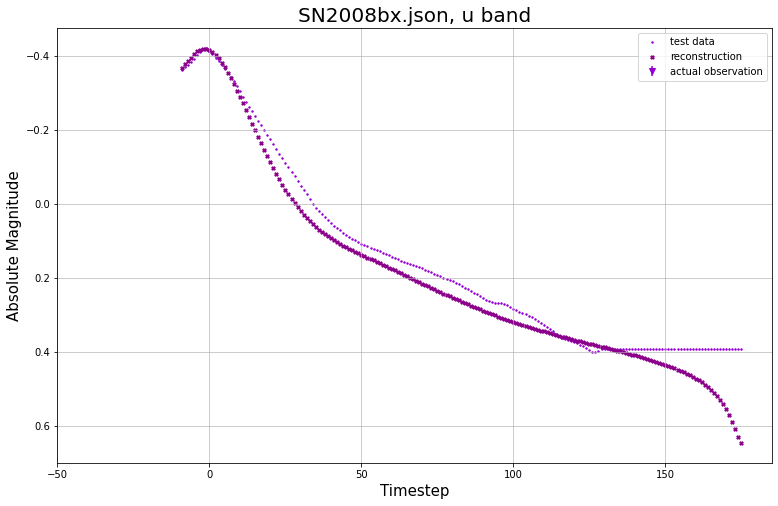

Ia Pec


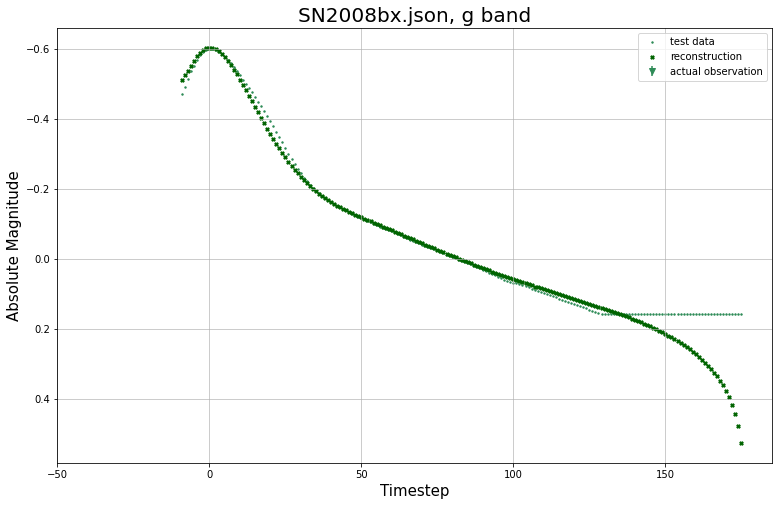

Ia Pec


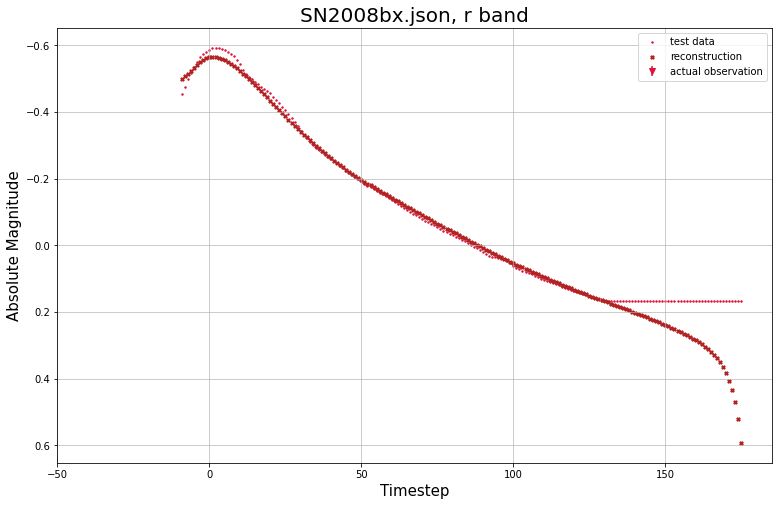

Ia Pec


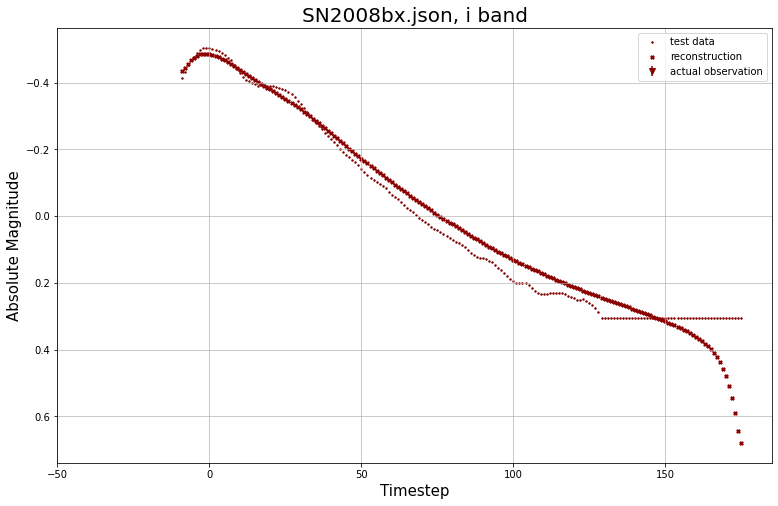

Ia


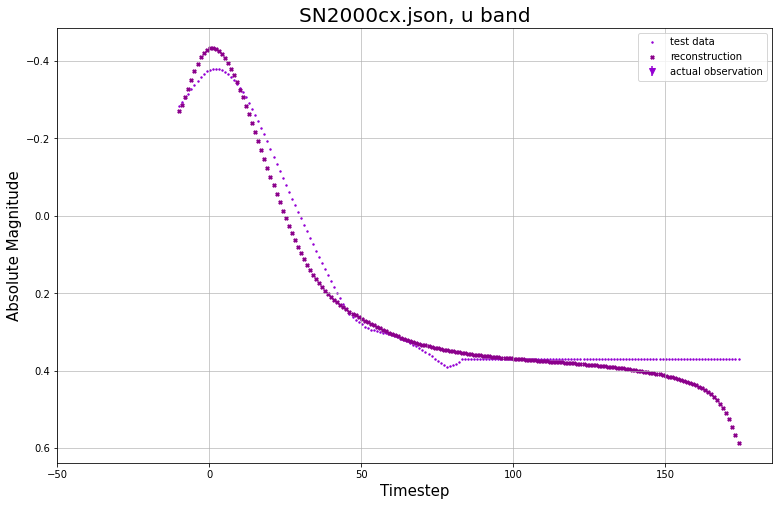

Ia


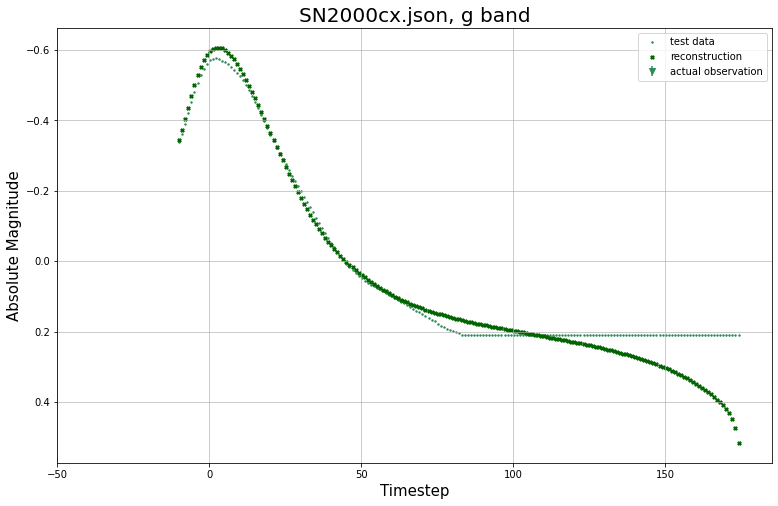

Ia


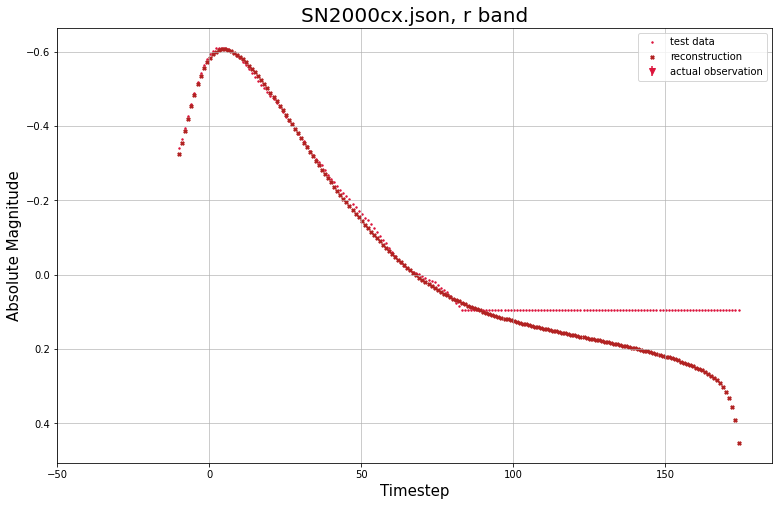

Ia


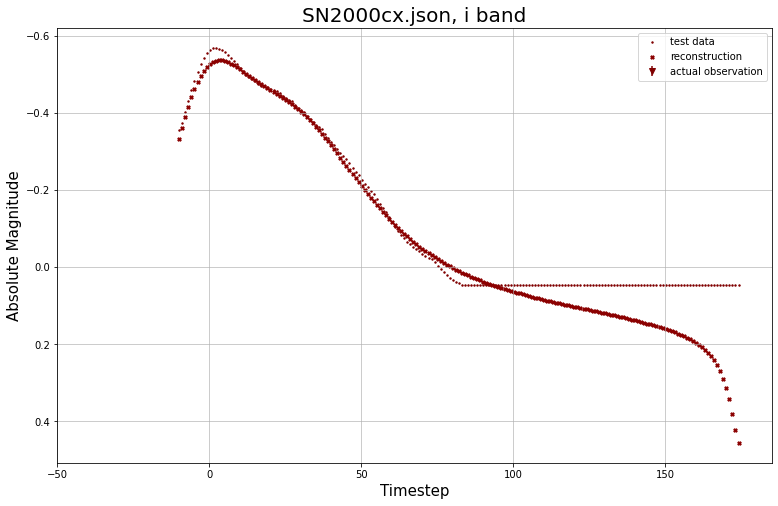

Ia Pec


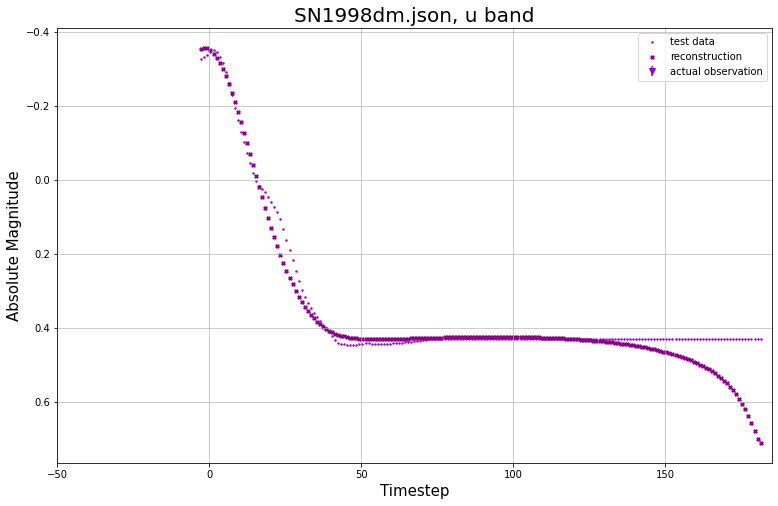

Ia Pec


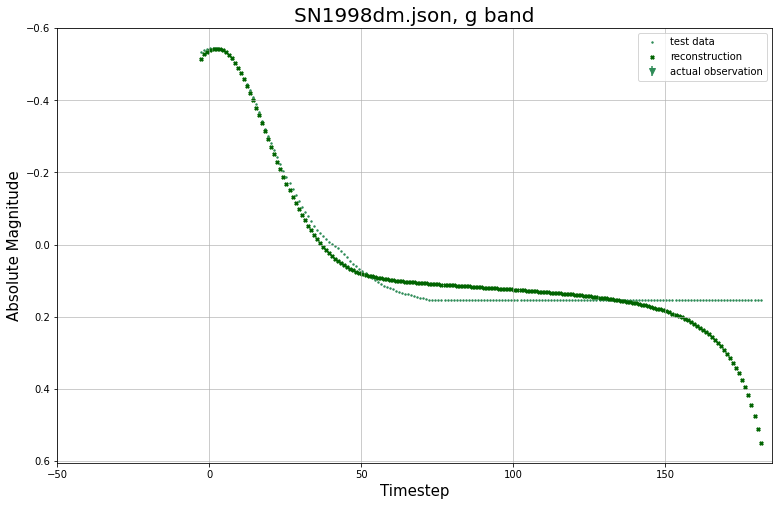

Ia Pec


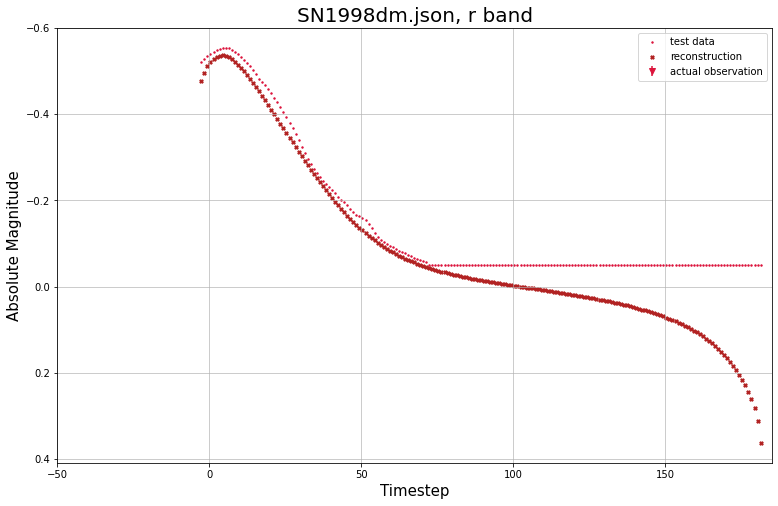

Ia Pec


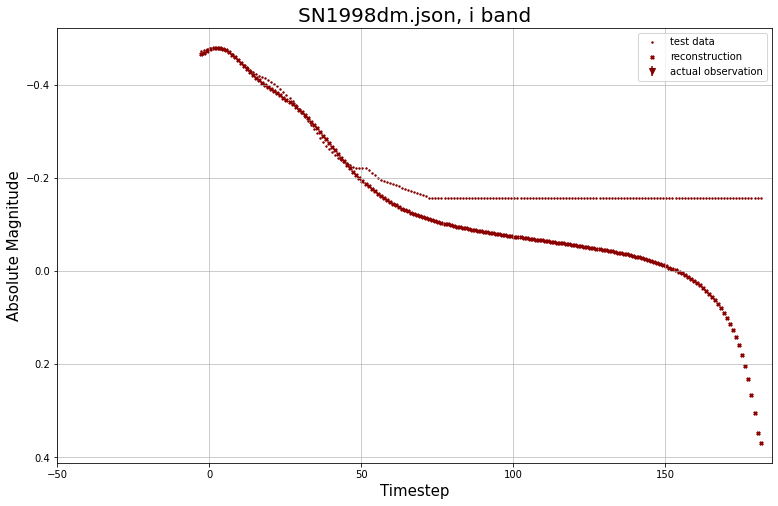

IIn


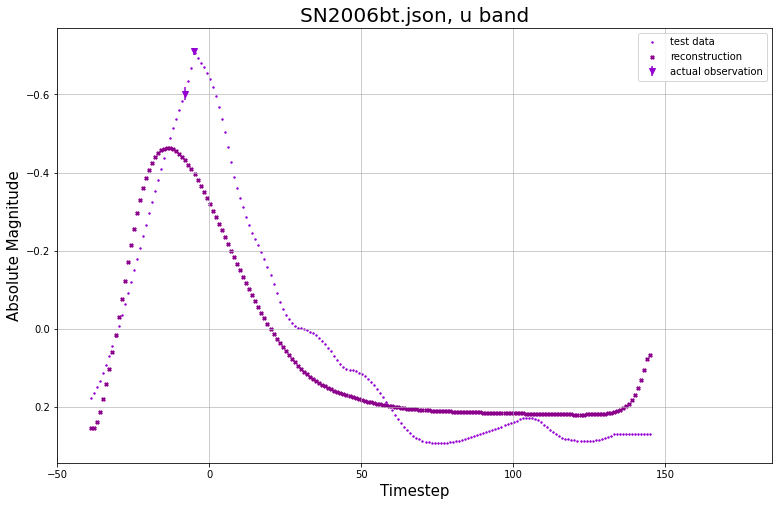

IIn


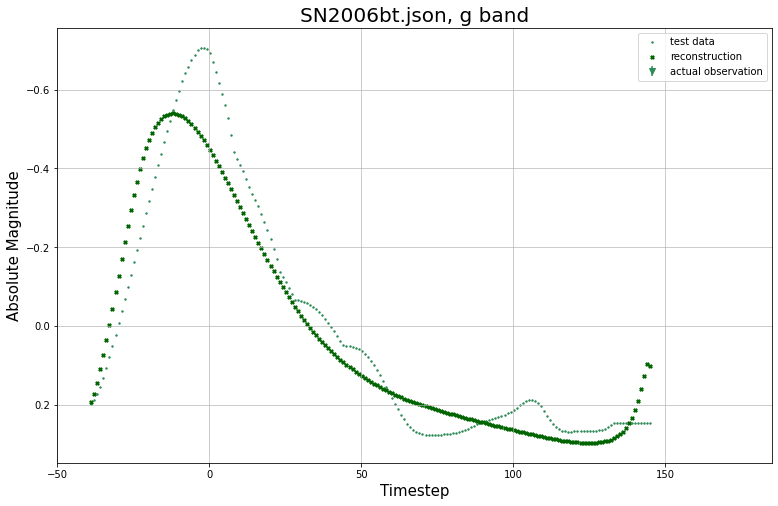

IIn


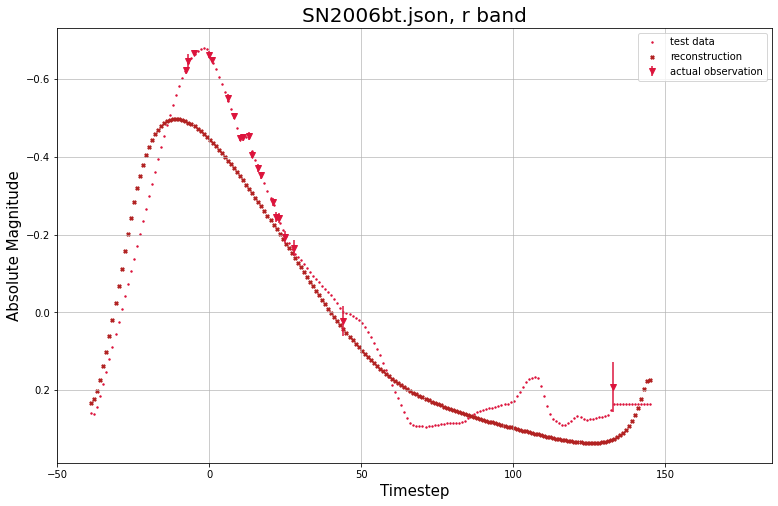

IIn


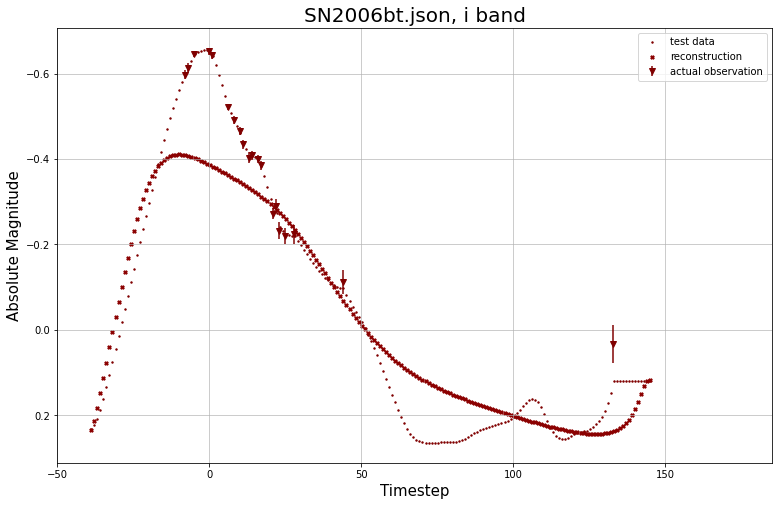

Ia


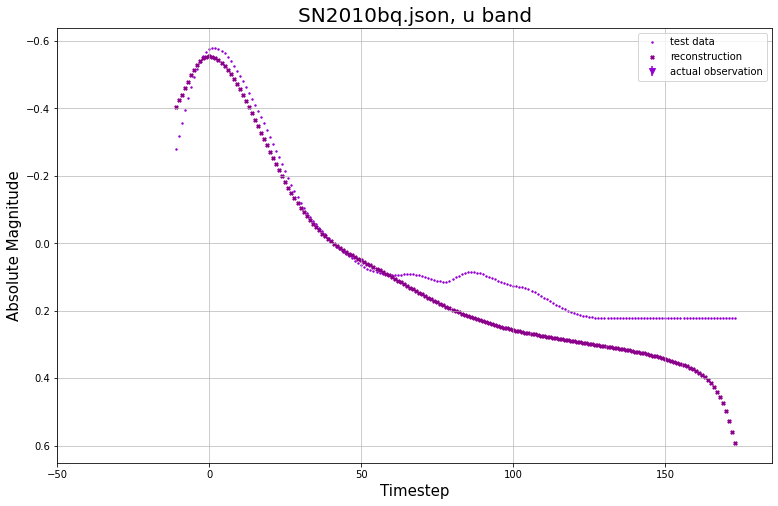

Ia


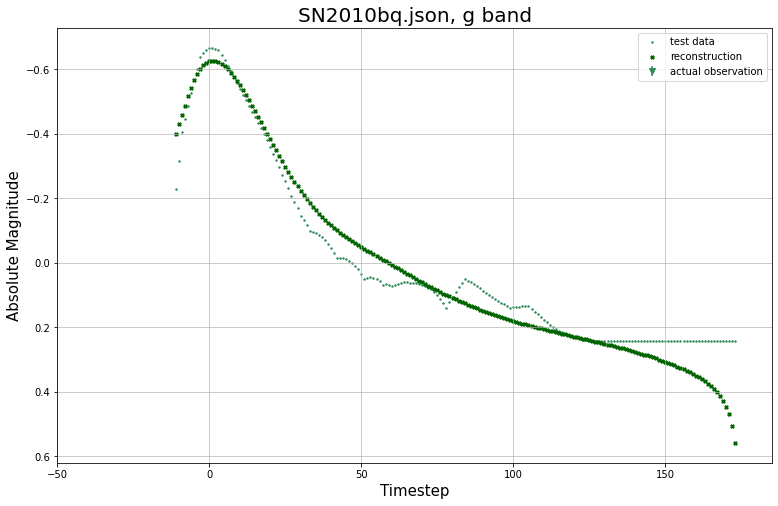

Ia


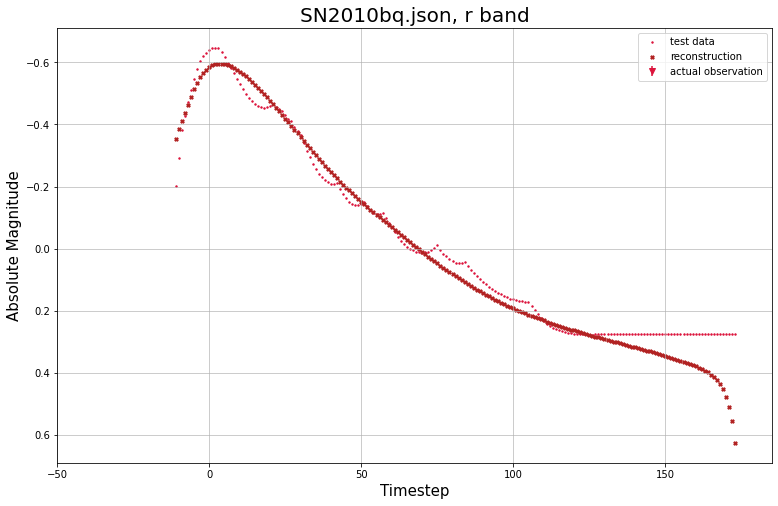

Ia


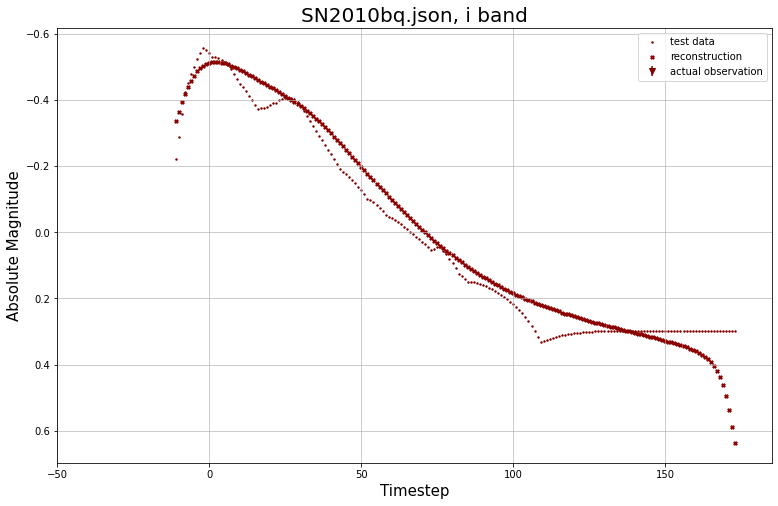

II


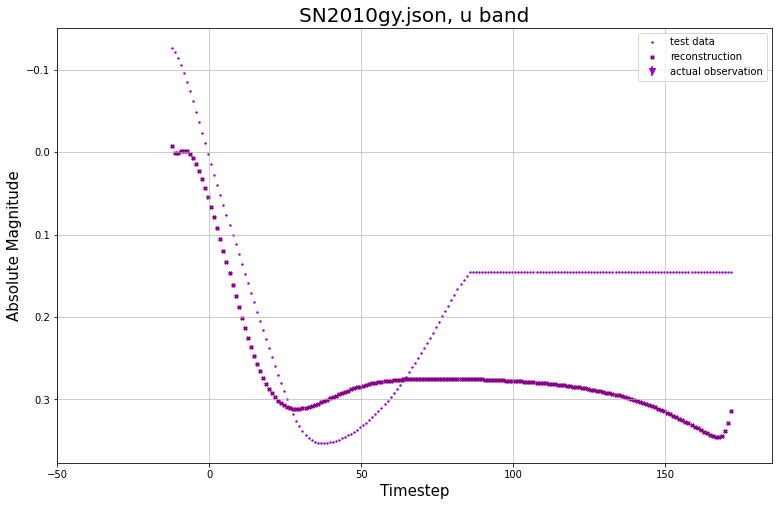

II


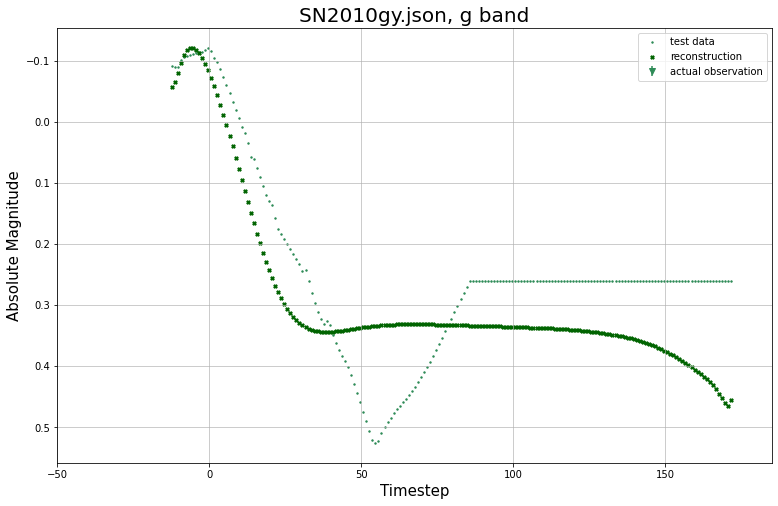

II


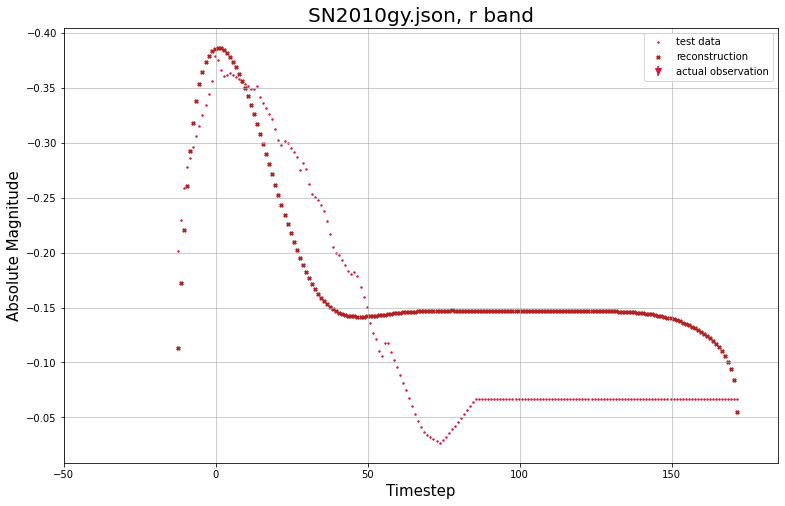

II


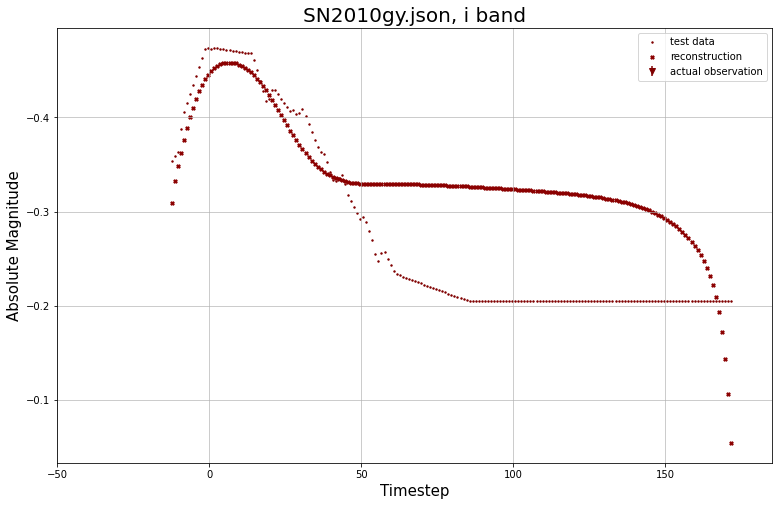

IIb


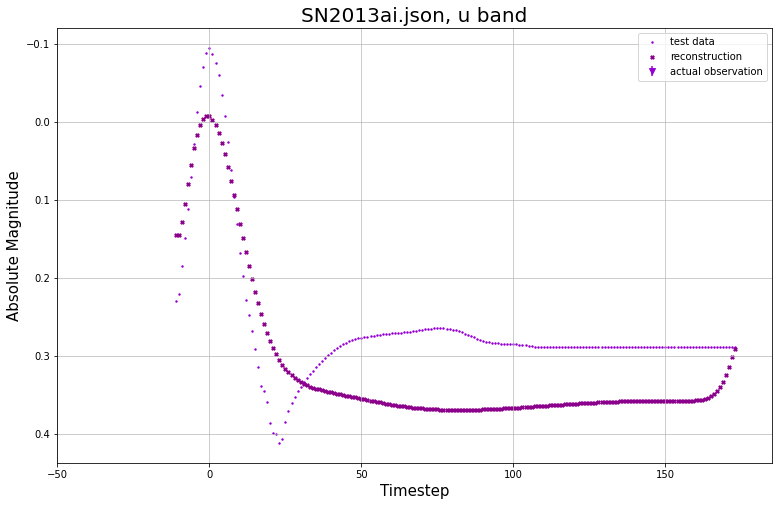

IIb


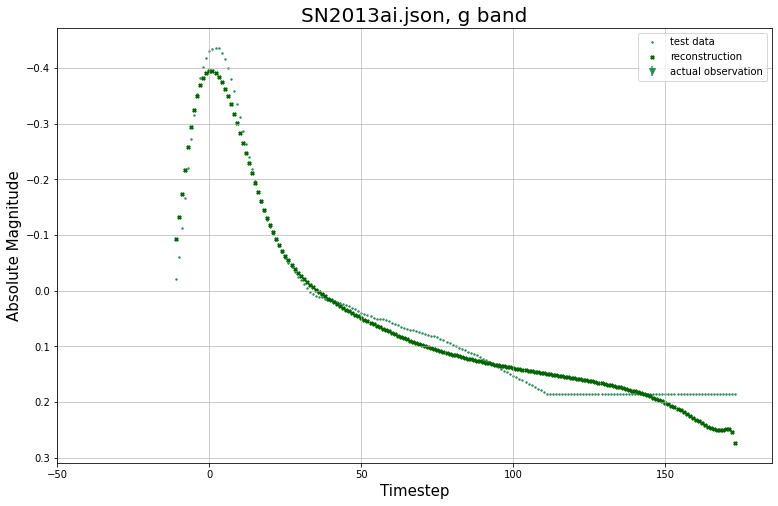

IIb


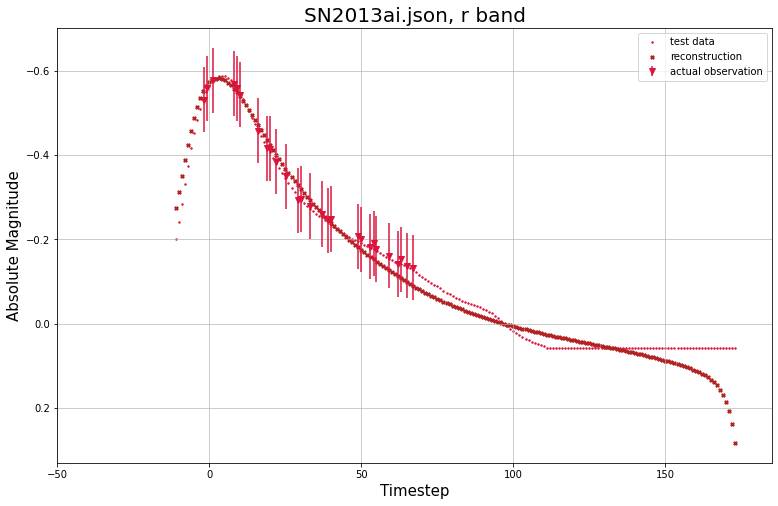

IIb


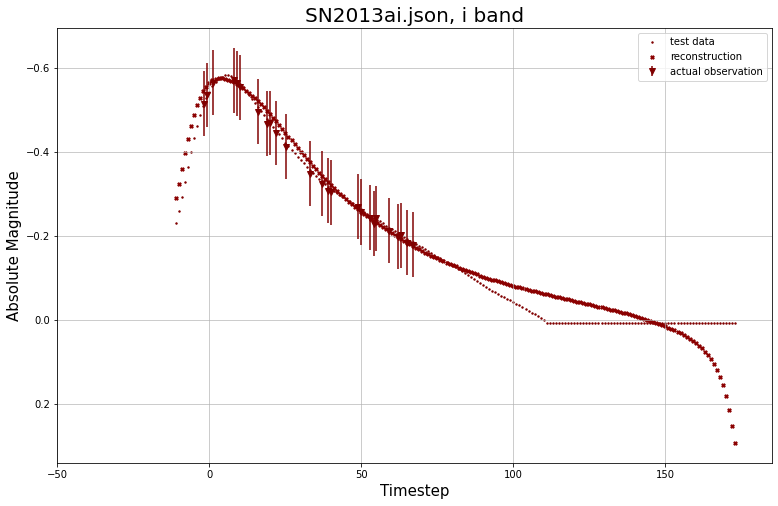

Ia


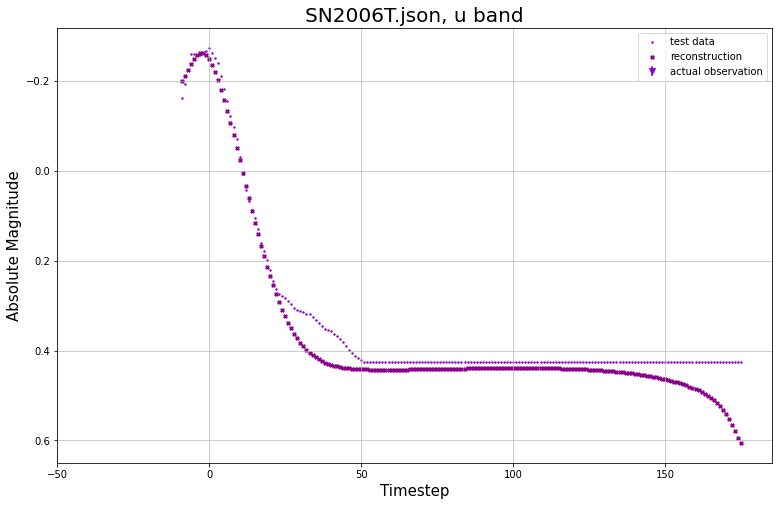

Ia


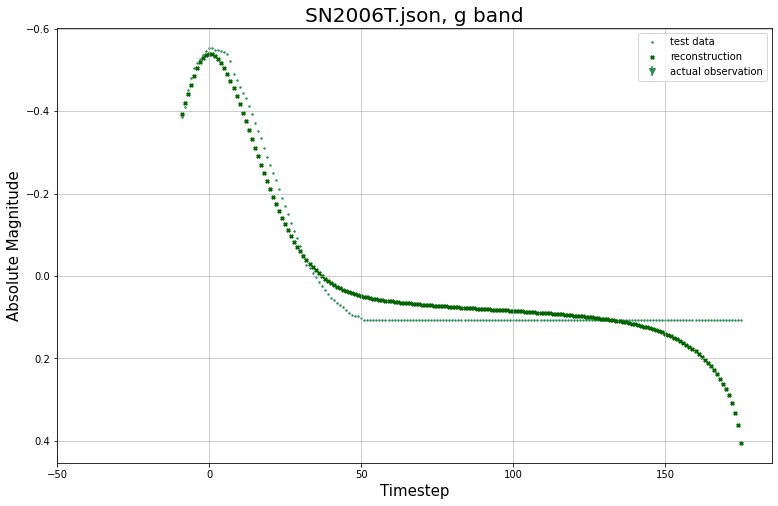

Ia


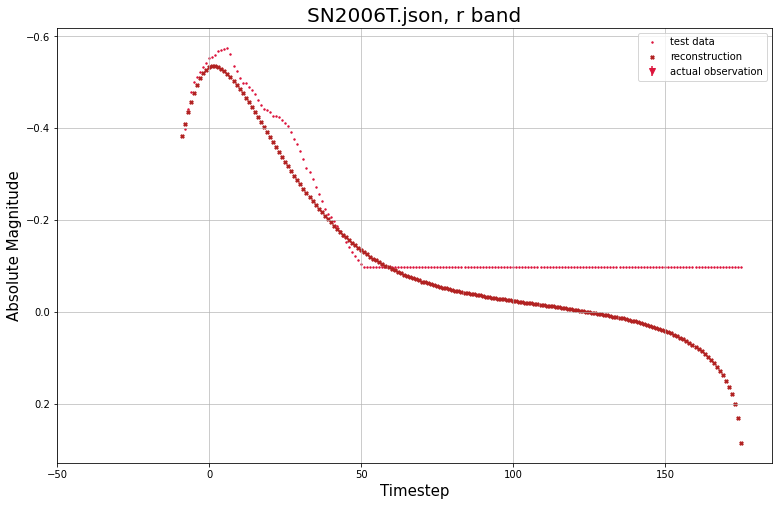

Ia


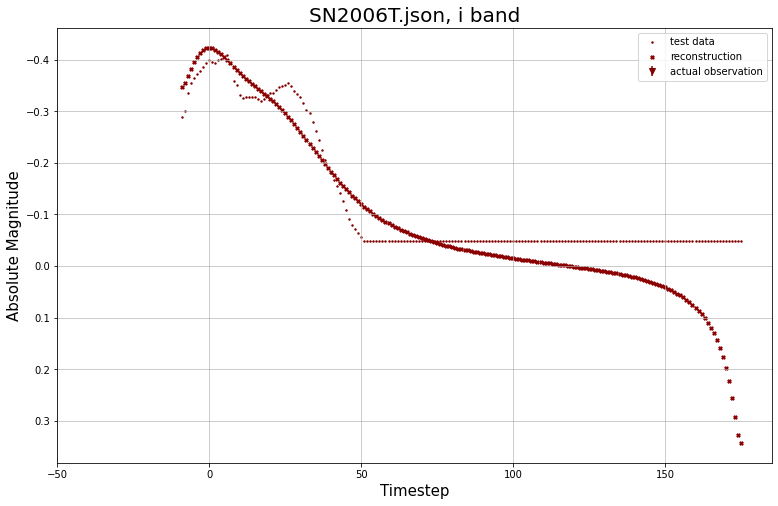

II


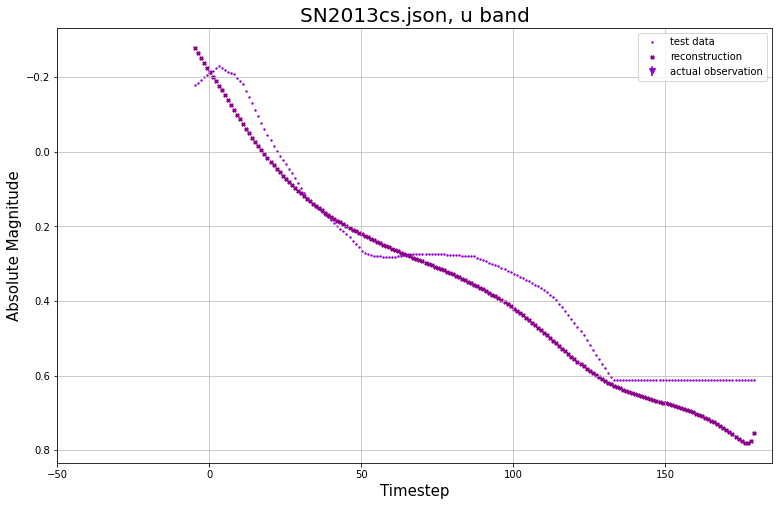

II


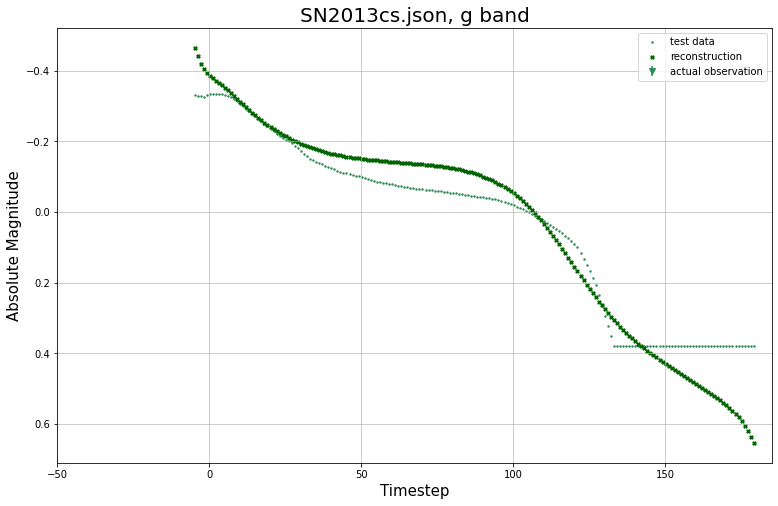

II


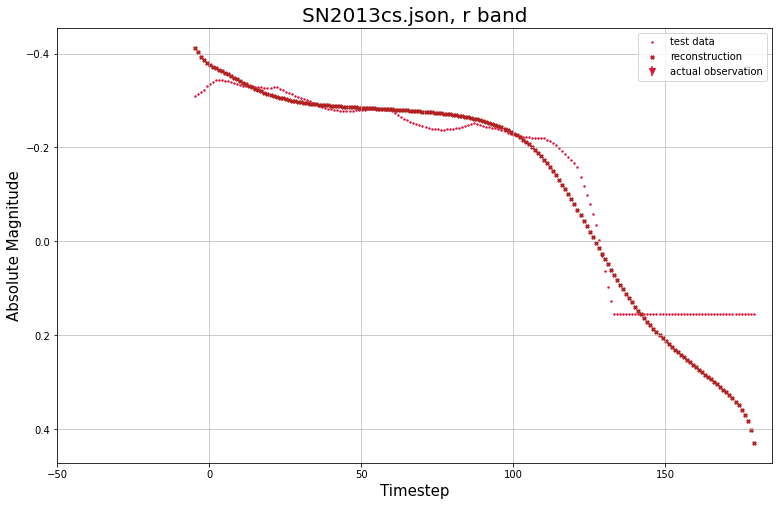

II


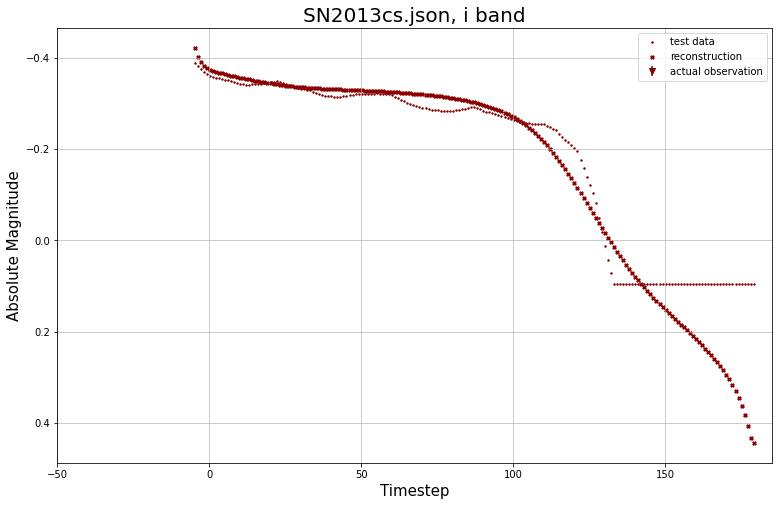

Ia


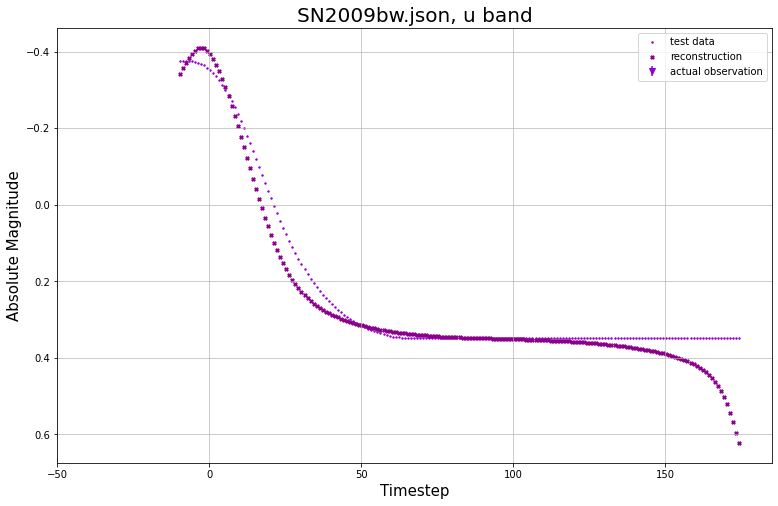

Ia


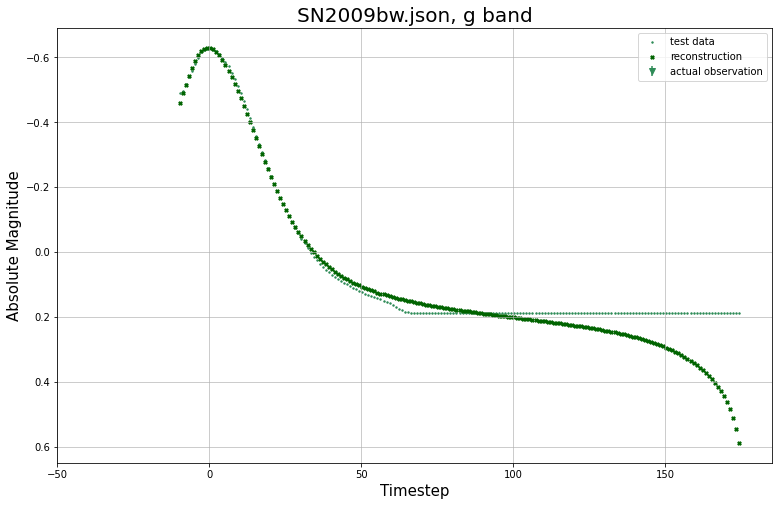

Ia


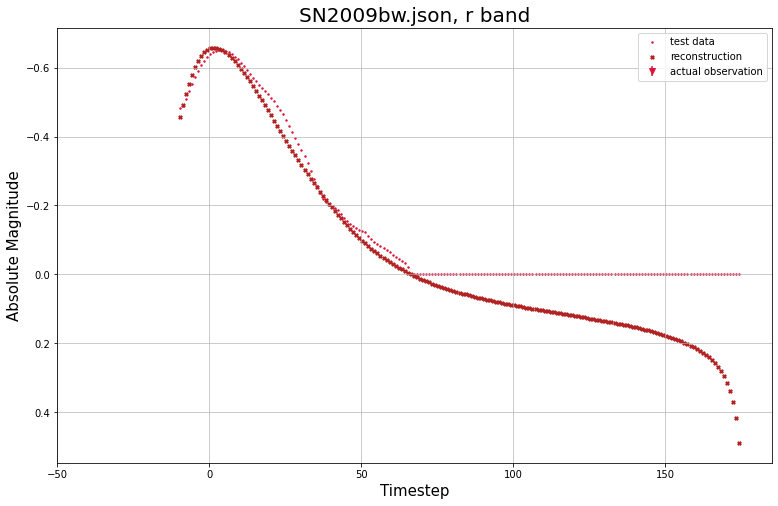

Ia


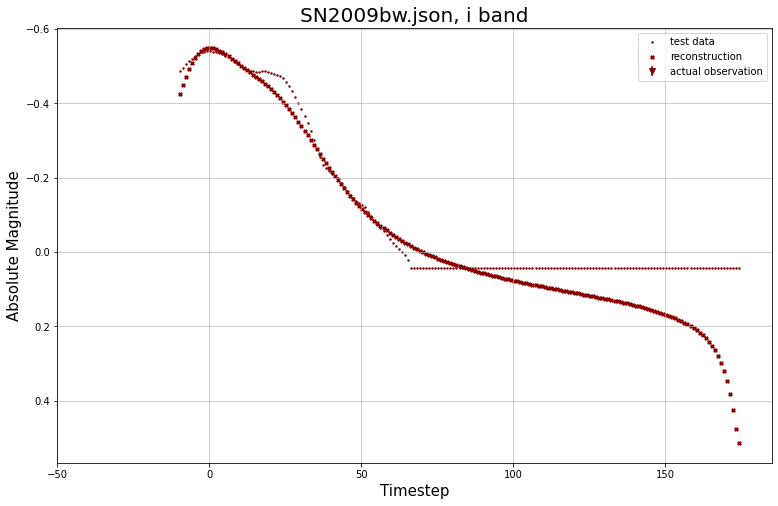

Ia


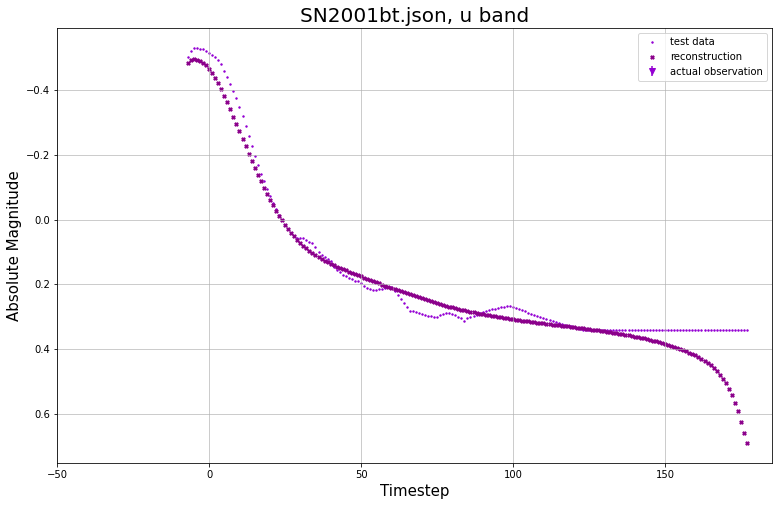

Ia


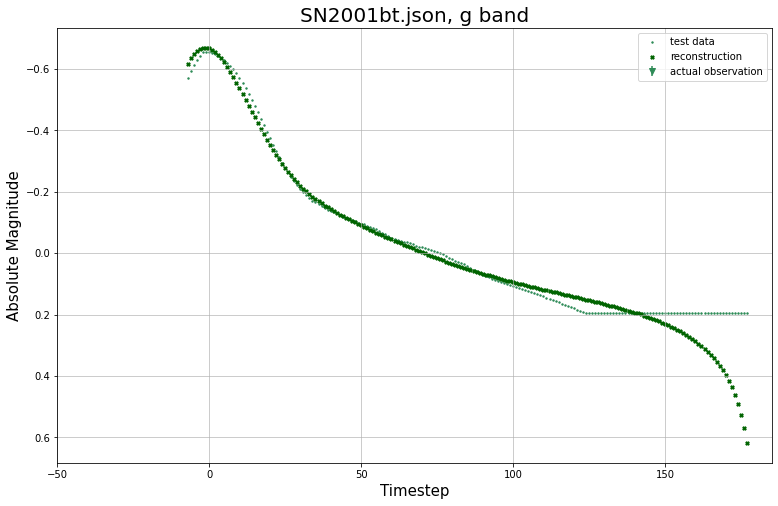

Ia


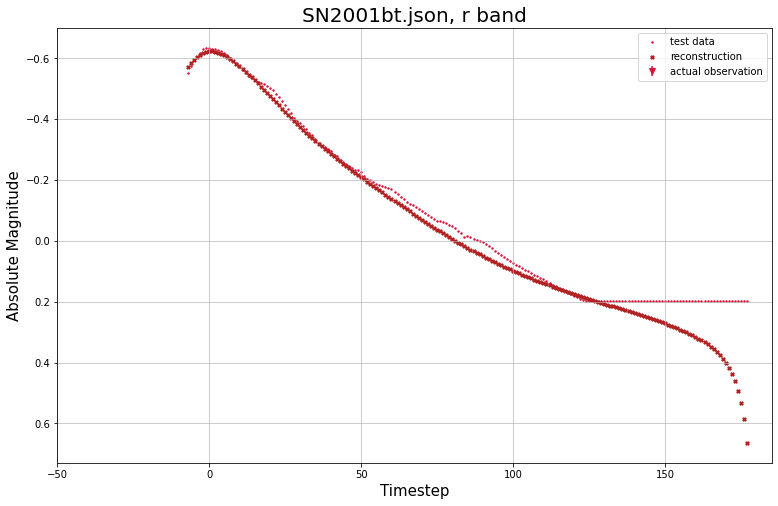

Ia


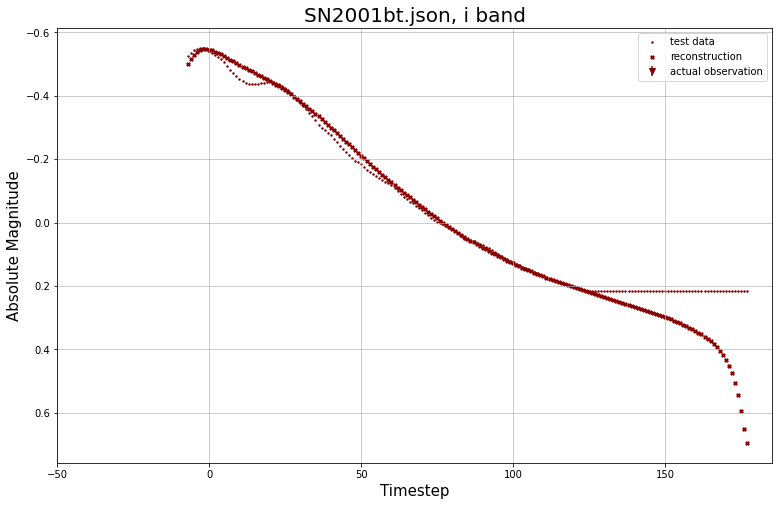

Ia


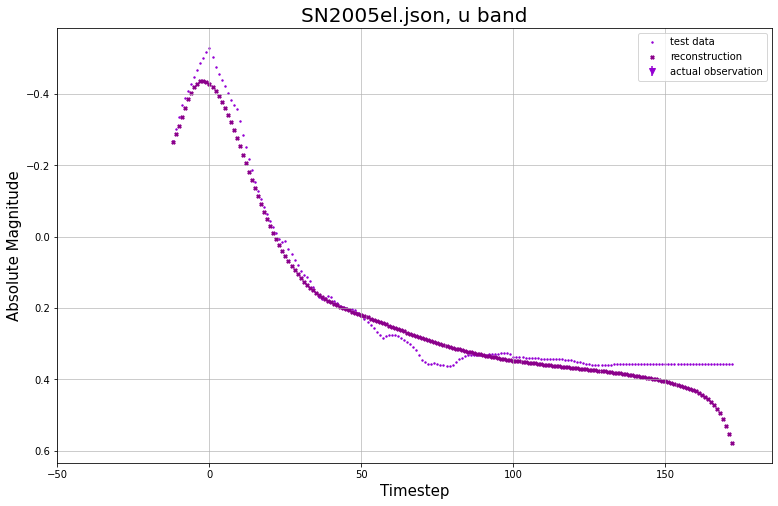

Ia


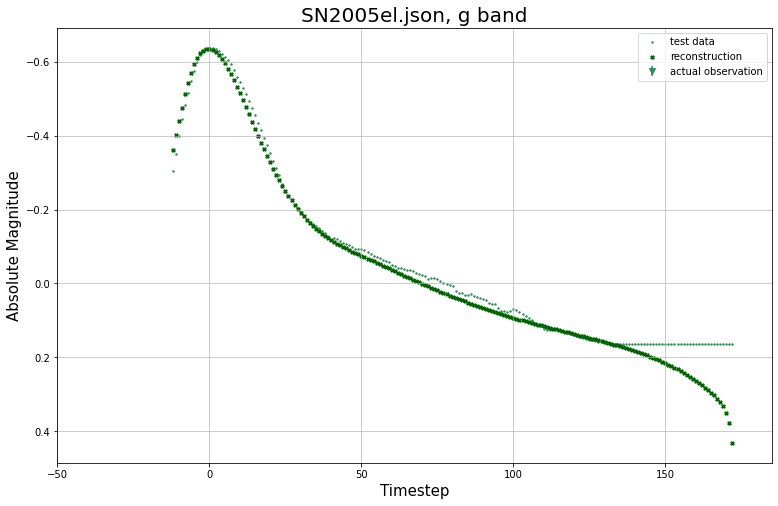

Ia


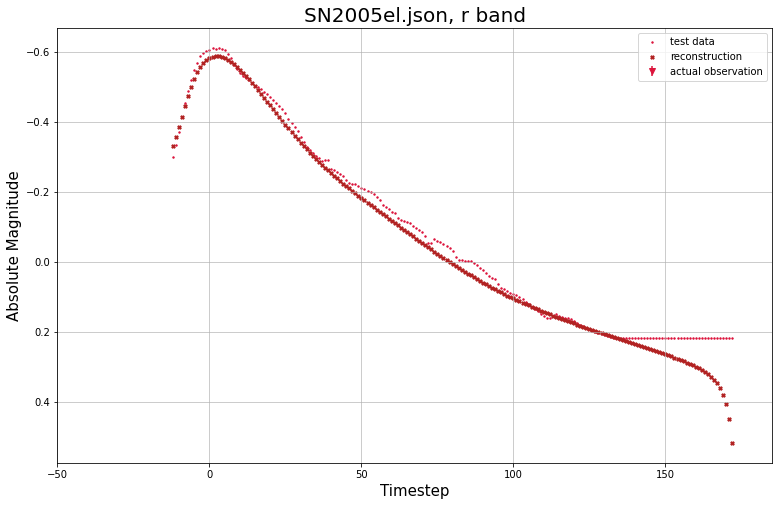

Ia


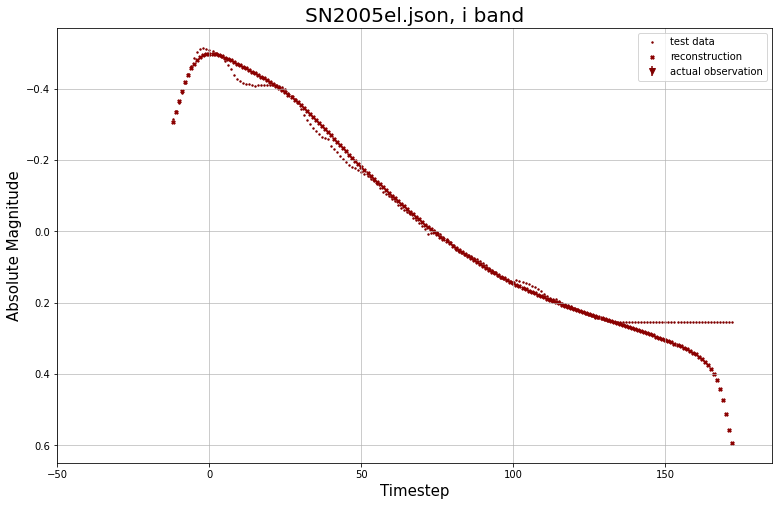

Ia


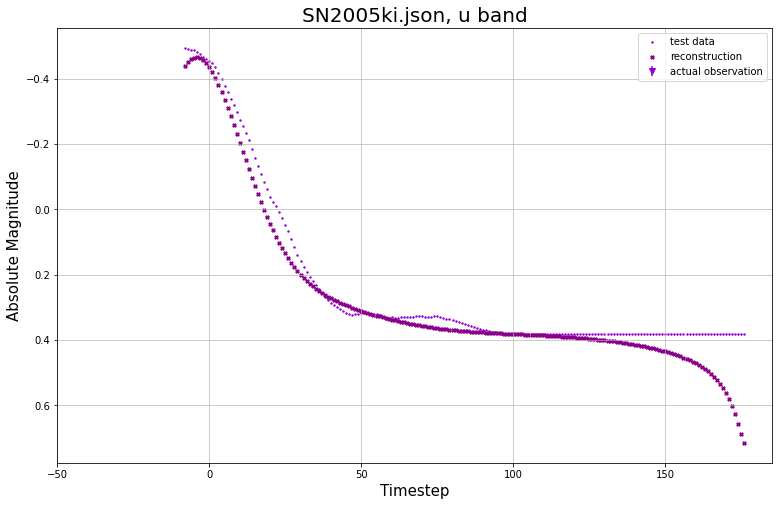

Ia


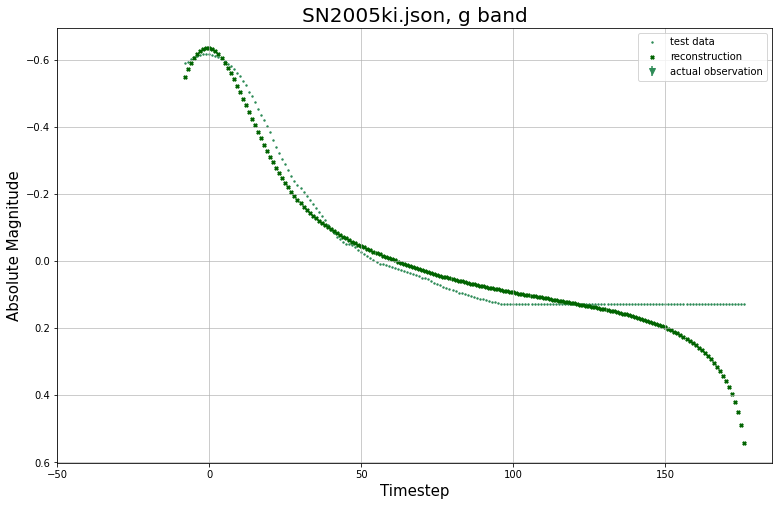

Ia


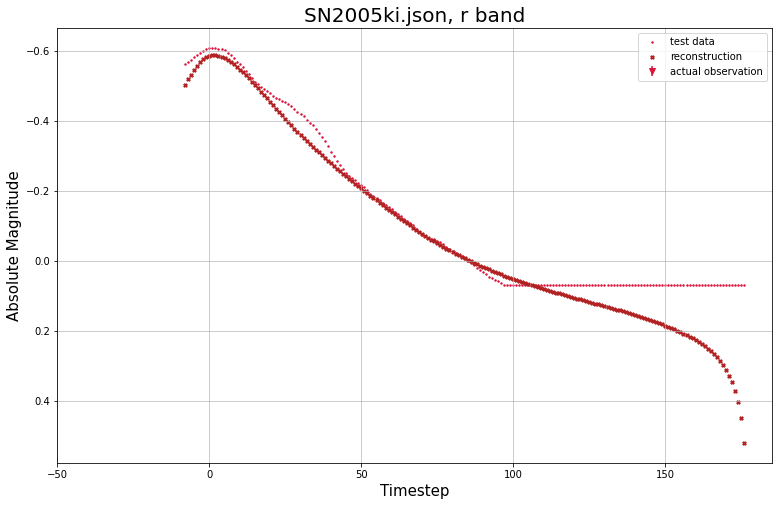

Ia


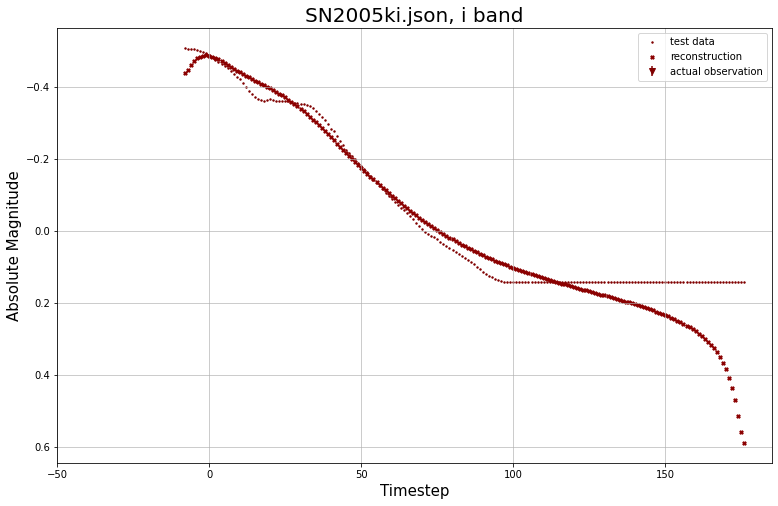

Ia


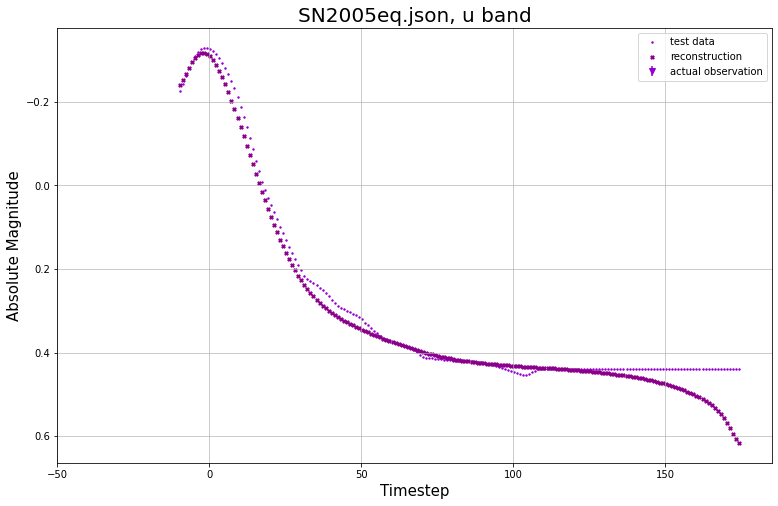

Ia


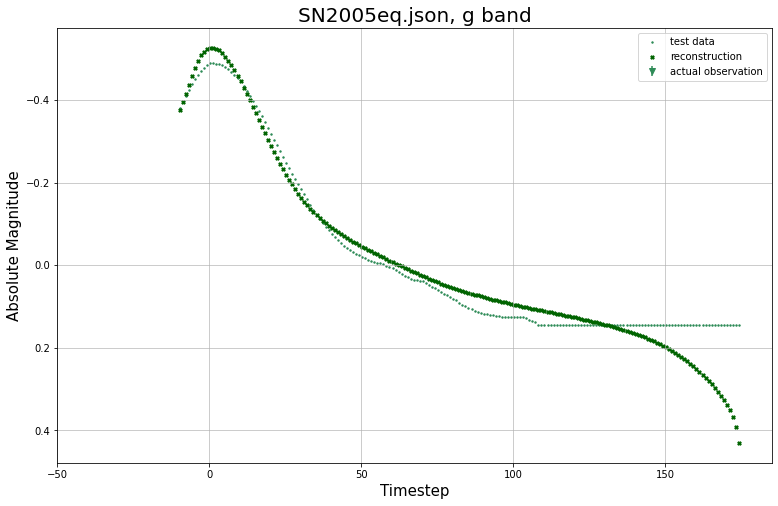

Ia


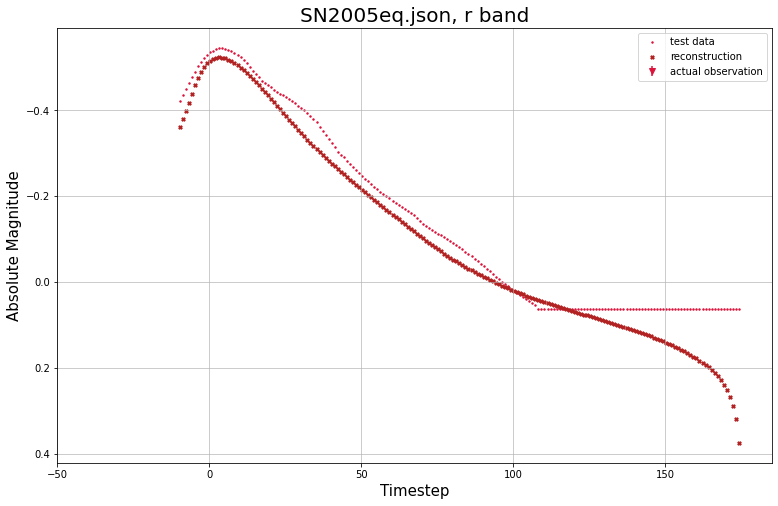

Ia


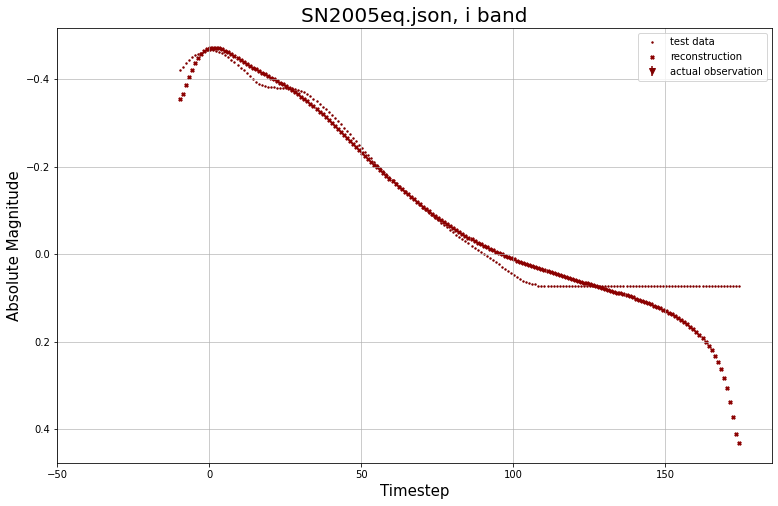

Ia


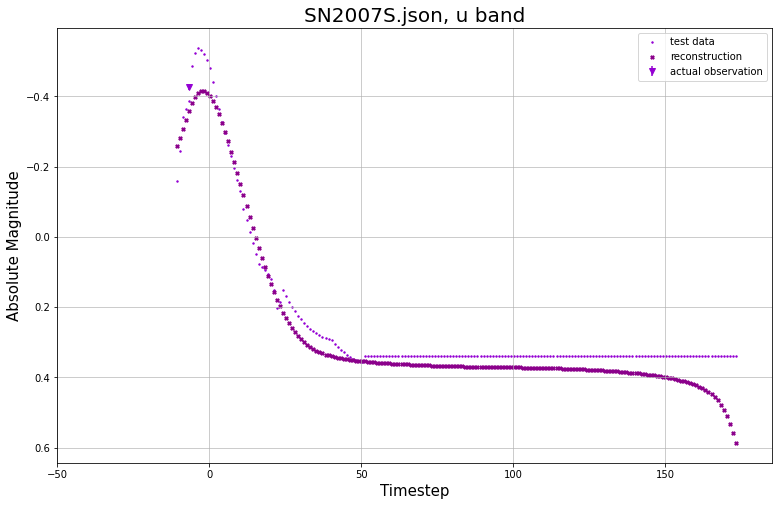

Ia


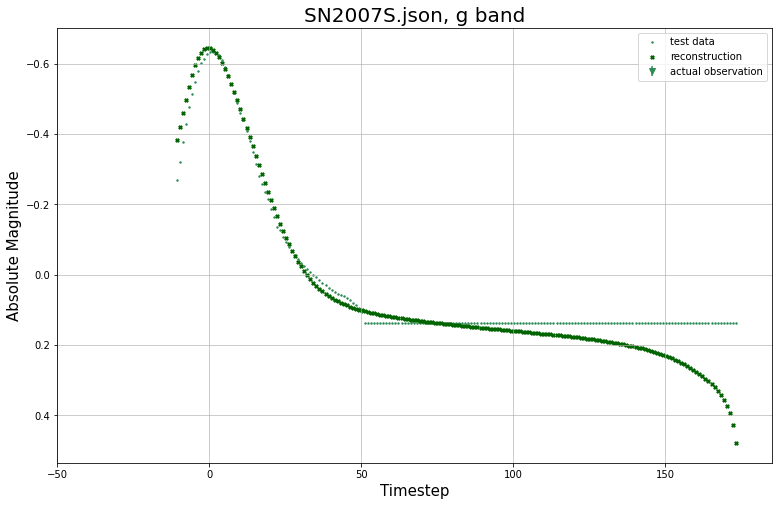

Ia


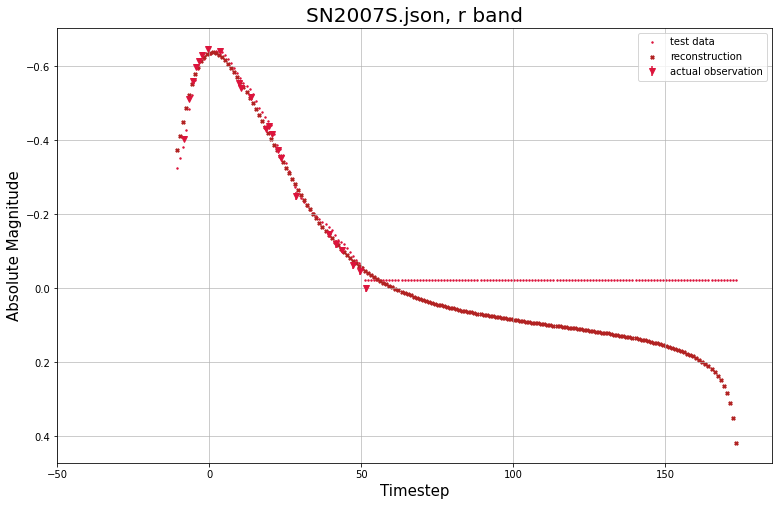

Ia


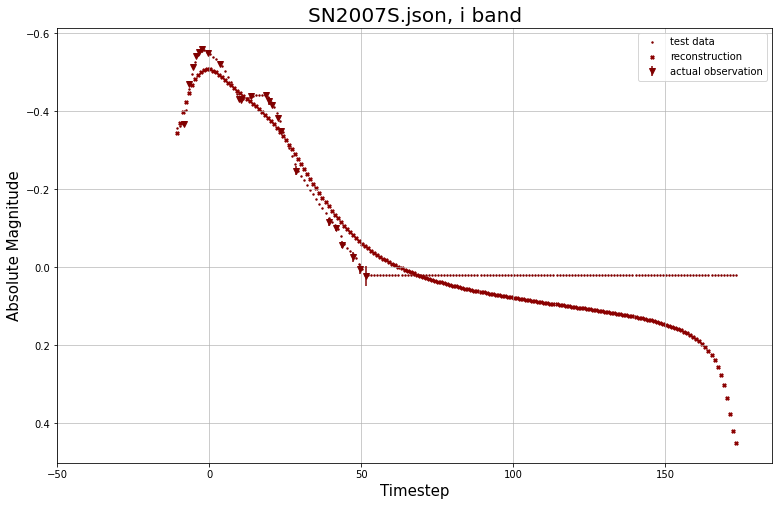

Ia


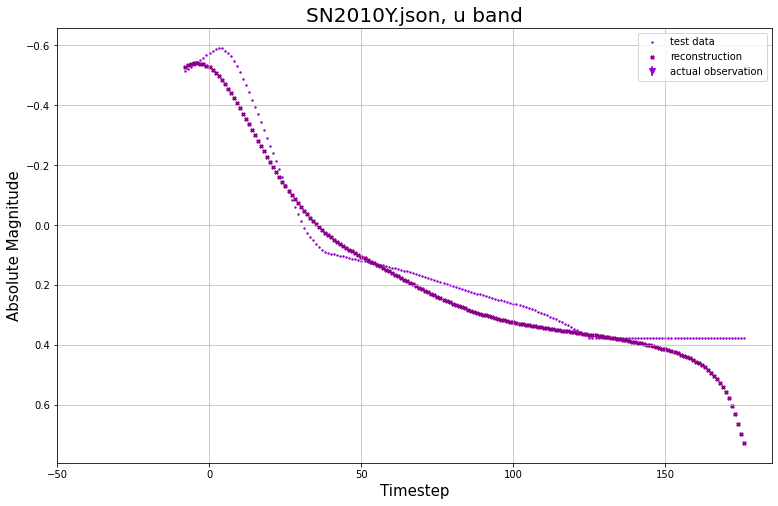

Ia


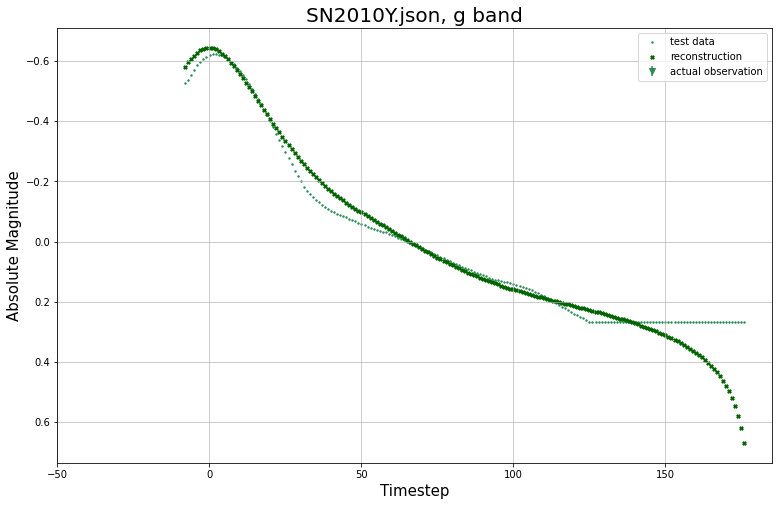

Ia


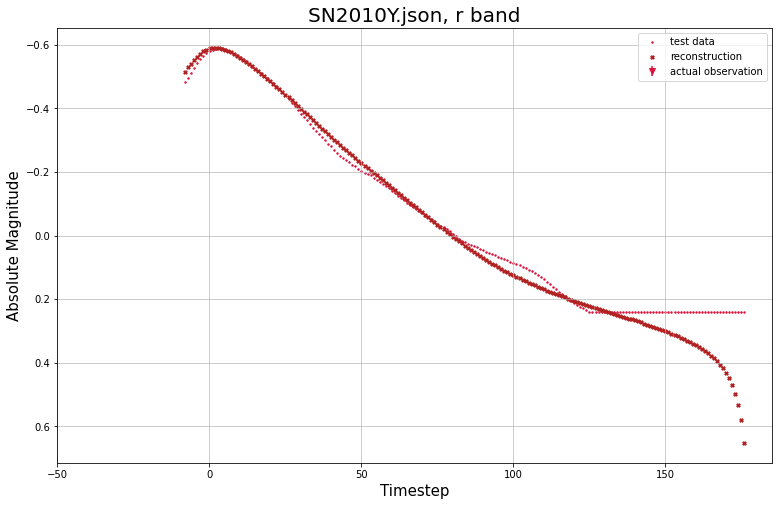

Ia


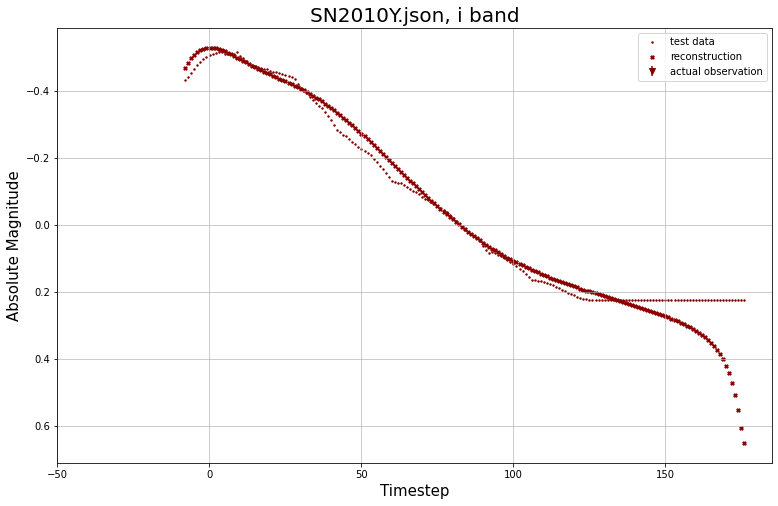

II P


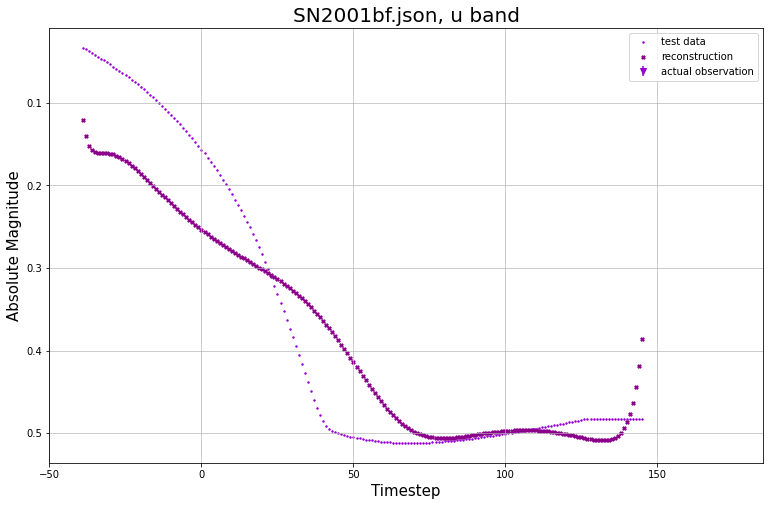

II P


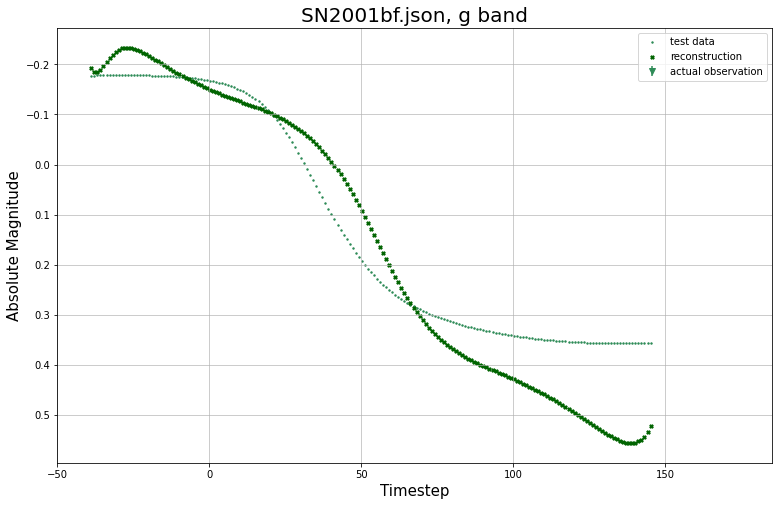

II P


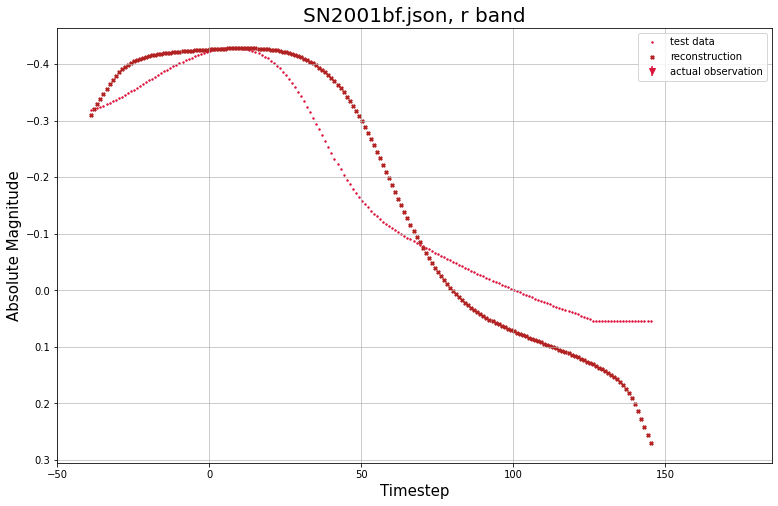

II P


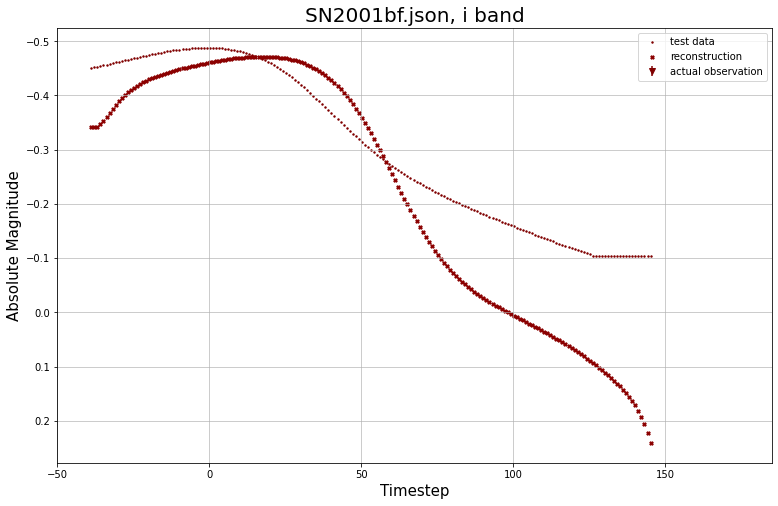

Ia


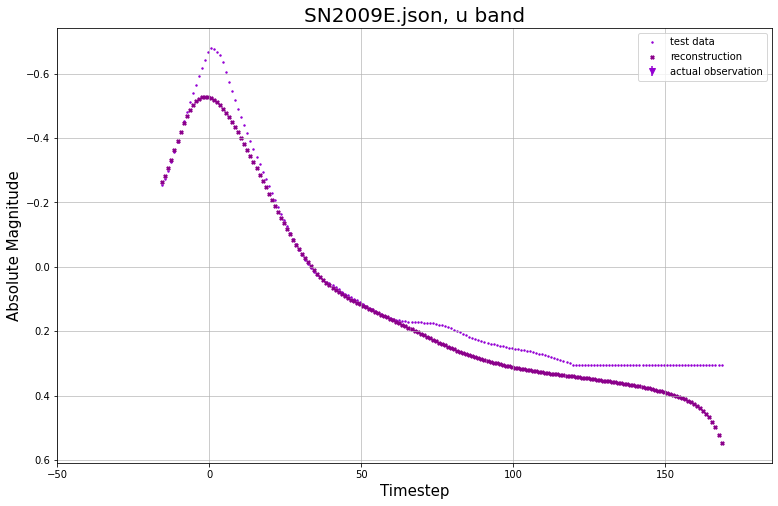

Ia


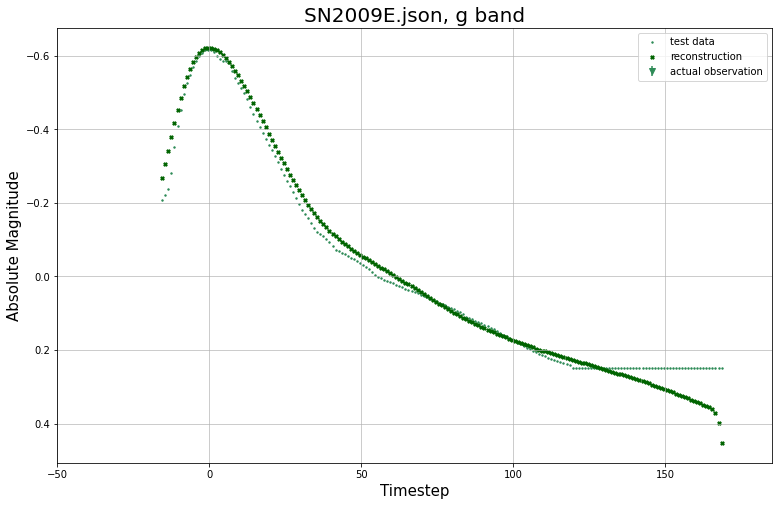

Ia


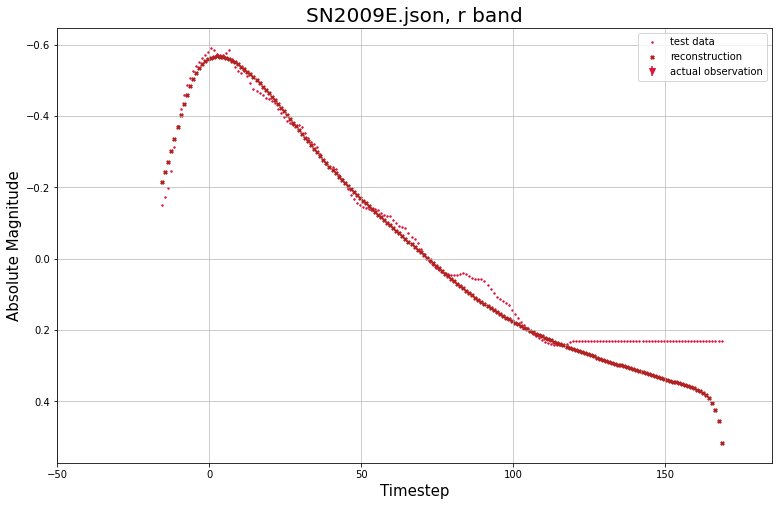

Ia


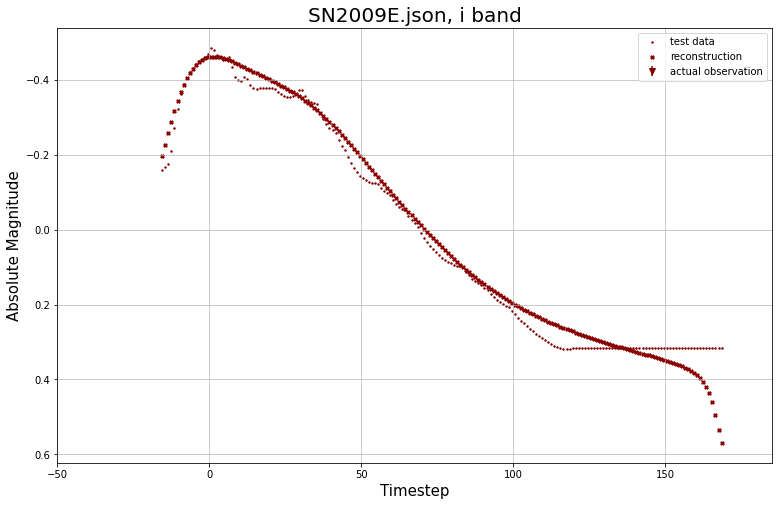

In [ ]:
color1 = ['darkviolet', 'seagreen', 'crimson', 'maroon']
color2 = ['darkmagenta', 'darkgreen', 'firebrick', 'darkred']

for i in range(Input_test[0].shape[0]):
    for j in range(len(Filter_SDSS)):
        fig = plt.figure(figsize=(12.8,8))
        ax = fig.add_subplot(1, 1, 1)

        plt.gca().invert_yaxis()

        # And a corresponding grid
        ax.grid(which='major', alpha=0.8)
        ax.grid(which='minor', alpha=0.3)

        plt.xlabel('Timestep', fontsize=15)
        plt.ylabel('Absolute Magnitude', fontsize=15)

        plt.xlim(-50, 185)
        #plt.ylim(-8, -22)

        '''x = np.linspace(1, lightcurve_length_max, lightcurve_length_max)

        plt.scatter(x, lightcurve_test[i,:,0], s=2)
        plt.scatter(x, yhat[i,:,0], s=2)'''
        
        print(type_GP_all[i+split])
        plt.title(filename[filename_all[i+split]]+', '+Filter_SDSS[j]+' band', fontsize=20)
        #print(succ_id_all[i+split], type_predict[i], type_predict1[i])
        
        plt.errorbar(t_all[succ_id_all[i+split]][j+5], (m_all[succ_id_all[i+split]][j+5] - y_mean[i+split]) / y_range[i+split], yerr=m_err_all[succ_id_all[i+split]][j+5] / y_range[i+split], fmt='v', color=color1[j], label='actual observation')
        
        plt.scatter(Input_test[0][i,:,0], Input_test[0][i,:,j+1], s=2, marker='o', color=color1[j], label='test data'.format('o'))
        plt.scatter(Input_test[0][i,:,0], yhat[i,:,j], s=12, marker='X', color=color2[j], label='reconstruction'.format('x'))
        plt.legend()
        
        #plt.savefig('{}'.format(filename[filename_all[i+split]])+' at band {}.jpg'.format(Filter_SDSS[j]), dpi = 150)
        
        plt.show()